# Garch model

In [90]:
pip install arch

In [91]:
# Read csv from path
import pandas as pd
import matplotlib.pyplot as plt


In [92]:
# Specify the file path
#file_path = '/Users/alex/Documents/Data Science Master/Second Semester/Guided Studies in Financial Management/Group Project/Stock Data/combined_financial_data.csv'

# Read the CSV file
df = pd.read_csv('combined_financial_data (1).csv')

# Display the DataFrame
print(df.head())

   Unnamed: 0        date  permno ticker  price      volume    return   high  \
0           0  2014-01-02   10107   MSFT  37.16  30423757.0 -0.006683  37.40   
1           1  2014-01-03   10107   MSFT  36.91  30944370.0 -0.006728  37.22   
2           2  2014-01-06   10107   MSFT  36.13  43111355.0 -0.021133  36.89   
3           3  2014-01-07   10107   MSFT  36.41  35478667.0  0.007750  36.49   
4           4  2014-01-08   10107   MSFT  35.76  59452427.0 -0.017852  36.14   

     low    open  avg_price      mkt_cap  pct_return  ticker_attention  \
0  37.10  37.350      37.25  308428000.0     -0.6683              3.25   
1  36.60  37.200      36.91  306353000.0     -0.6728              3.38   
2  36.11  36.850      36.50  299879000.0     -2.1133              4.03   
3  36.21  36.325      36.35  302203000.0      0.7750              4.94   
4  35.58  36.000      35.86  296808000.0     -1.7852              5.33   

   name_price_attention  
0                  3.15  
1                  1.5

In [93]:
from arch import arch_model

# Assume 'returns' is the column with returns data
#df['squared_returns'] = df['return'] ** 2

df['returns'] = df['return']*100
# Fit a GARCH(1, 1) model to the squared returns data
from arch import arch_model
model = arch_model(df['returns'], vol='Garch', p=1, q=1)
model_fit = model.fit()

# Print out the summary of the model
print(model_fit.summary())

Iteration:      1,   Func. Count:      6,   Neg. LLF: 484439.3231499122
Iteration:      2,   Func. Count:     16,   Neg. LLF: 450811.48493131844
Iteration:      3,   Func. Count:     25,   Neg. LLF: 492768394.51471424
Iteration:      4,   Func. Count:     31,   Neg. LLF: 114946.59702386297
Iteration:      5,   Func. Count:     37,   Neg. LLF: 150460.34335419768
Iteration:      6,   Func. Count:     45,   Neg. LLF: 115750.08384657183
Iteration:      7,   Func. Count:     52,   Neg. LLF: 114813.45624319317
Iteration:      8,   Func. Count:     57,   Neg. LLF: 114813.45150170047
Iteration:      9,   Func. Count:     62,   Neg. LLF: 114813.45149774698
Iteration:     10,   Func. Count:     66,   Neg. LLF: 114813.45149774392
Optimization terminated successfully    (Exit mode 0)
            Current function value: 114813.45149774698
            Iterations: 10
            Function evaluations: 66
            Gradient evaluations: 10
                     Constant Mean - GARCH Model Results     

### Model Components

- **Mean Model**: The `Constant Mean` model suggests that the expected return is constant over time, which is a common assumption in financial time series analysis.
- **Vol Model**: The `GARCH` model indicates that the volatility of returns is being modeled with a GARCH process, specifically designed to model time-varying volatility.

### Model Fit and Statistics

- **Log-Likelihood**: The log-likelihood value (-114813) indicates how well the model fits the data. Higher values (less negative) suggest a better fit.
- **AIC/BIC**: The Akaike Information Criterion (AIC) and Bayesian Information Criterion (BIC) are used to compare models; lower values indicate a better model fit in terms of explaining variance while penalizing for the number of parameters.

### Mean Model Parameters

- **mu (0.0692)**: This is the estimated constant mean of the returns series, with a standard error of 0.005555. The t-statistic and its associated p-value indicate that this mean is significantly different from zero, suggesting that the average return is statistically significant over the period analyzed.

### Volatility Model Parameters

- **omega (0.0533)**: This parameter represents the long-run average variance (volatility) of the returns series in the absence of shocks. It's the baseline level of variance when past values of returns and volatility have no effect.
- **alpha[1] (0.0878)**: This coefficient measures the reaction of volatility to past shocks (squared returns). A higher value indicates that recent shocks have a more significant impact on current volatility, suggesting a persistence of volatility clustering.
- **beta[1] (0.8961)**: This parameter measures the persistence of volatility over time. A value close to 1 indicates high persistence, meaning that if volatility spikes, it tends to remain high for a more extended period.

### Interpretation

The model's parameters suggest that there is significant time-varying volatility in the returns series, with both recent shocks (alpha[1]) and past volatility (beta[1]) having substantial impacts on current volatility levels. The high value of beta[1] indicates that volatility shocks are highly persistent, meaning that periods of high volatility are likely to follow each other.

Additionally, the constant mean model's significance suggests that, despite the volatility, there is a statistically significant average return level throughout the data period.

This GARCH model output can be particularly useful for risk management, as it allows for more accurate predictions of future volatility, which is crucial for setting appropriate risk levels, pricing derivatives, and managing portfolios.

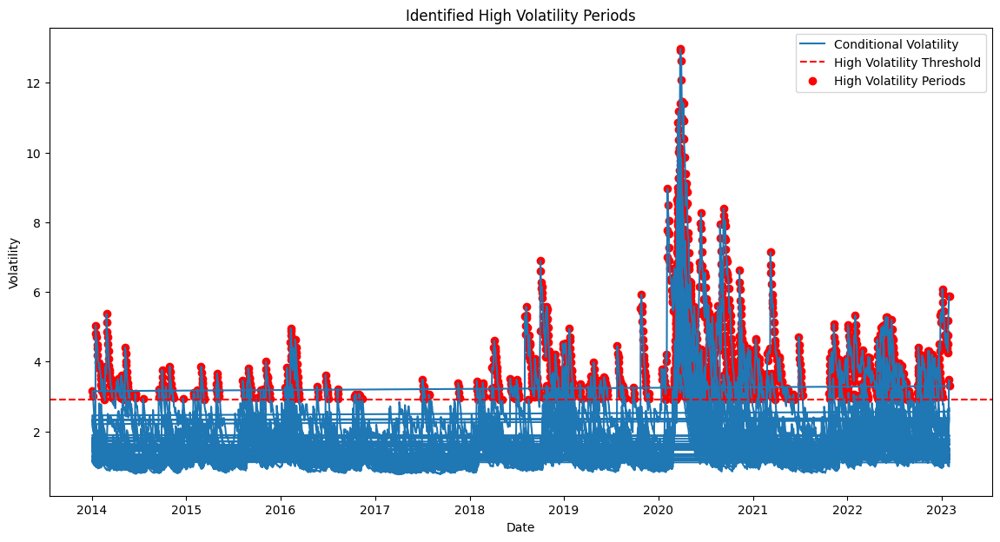

In [94]:
import numpy as np
# Assuming 'garch11_fit' is your fitted GARCH model object from the 'arch' library

# Step 1: Extract conditional volatility
conditional_volatility = model_fit.conditional_volatility

# Step 2: Determine a threshold for high volatility
# For example, using the 95th percentile of the extracted conditional volatility
high_volatility_threshold = np.percentile(conditional_volatility, 95)

# Step 3: Identify periods of high volatility
# This will be a boolean series where True indicates periods of high volatility
is_high_volatility = conditional_volatility > high_volatility_threshold

# Assuming 'data' is your DataFrame and it has a 'Date' column in the correct date-time format
df.index = pd.to_datetime(df['date'])

plt.figure(figsize=(14, 7))
plt.plot(df.index, conditional_volatility, label='Conditional Volatility')
plt.axhline(high_volatility_threshold, color='r', linestyle='--', label='High Volatility Threshold')
plt.scatter(df.index[is_high_volatility], conditional_volatility[is_high_volatility], color='red', label='High Volatility Periods')
plt.title('Identified High Volatility Periods')
plt.xlabel('Date')
plt.ylabel('Volatility')
plt.legend()
plt.show()



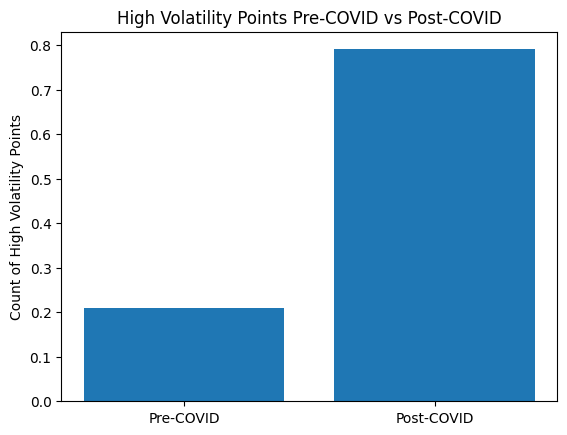

In [95]:
# Parse the dates and set them as the DataFrame index
df.index = pd.to_datetime(df['date'])

# Count high volatility points in pre-COVID and post-COVID periods
pre_covid_high_volatility_count = is_high_volatility[df.index < '2020-01-01'].sum() / is_high_volatility.sum()
post_covid_high_volatility_count = is_high_volatility[df.index >= '2020-01-01'].sum() / is_high_volatility.sum()

# Visualize the counts
plt.bar(['Pre-COVID', 'Post-COVID'], [pre_covid_high_volatility_count, post_covid_high_volatility_count])
plt.ylabel('Count of High Volatility Points')
plt.title('High Volatility Points Pre-COVID vs Post-COVID')
plt.show()

In [96]:
# Assuming you have a series called 'conditional_volatility' and a boolean series 'is_high_volatility'
# The 'df' DataFrame should have a 'date' column

# Add the 'conditional_volatility' and 'is_high_volatility' to the DataFrame if they are not already included
df['volatility'] = conditional_volatility.values
df['High_Volatility'] = is_high_volatility.values
#df['High_Volatility'] = is_high_volatility

# Ensure the index is set to the datetime of the 'date' column
df.index = pd.to_datetime(df['date'])

# Get the top 5 high volatility data points for the pre-COVID period
df_high_volatility = df[df['High_Volatility'] == True]
#pre_covid_high_volatility_top5 = df_high_volatility[df_high_volatility.index < '2020-01-01'].sort_values(by='volatility', ascending=False).head(5)
pre_covid_high_volatility_top5 = df_high_volatility[df_high_volatility.index < '2020-01-01'].drop_duplicates(subset='ticker').sort_values(by='volatility', ascending=False).head(5)

# Get the top 5 high volatility data points for the post-COVID period
post_covid_high_volatility_top5 = df_high_volatility[df_high_volatility.index >= '2020-01-01'].drop_duplicates(subset='ticker').sort_values(by='volatility', ascending=False).head(5)

pre_covid_high_volatility_top5


,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility
date,,,,,,,,,,,,,,,,,,
2014-01-15,61731,2014-01-15,93436,TSLA,164.13000,20407704.0,0.017734,172.23,162.10001,168.45,167.165005,2.020293e+07,1.7734,10.00,5.00,1.7734,5.041375,True
2019-04-26,58487,2019-04-26,22592,MMM,191.67000,4491273.0,0.004981,192.25,189.36000,190.53,190.805000,1.103822e+08,0.4981,40.87,21.12,0.4981,3.980878,True
2016-01-25,48524,2016-01-25,59176,AXP,55.02000,18498255.0,-0.000726,55.77,54.14000,54.46,54.955000,5.415321e+07,-0.0726,30.68,10.92,-0.0726,3.826357,True
2014-09-29,45906,2014-09-29,57665,NKE,89.12000,7425478.0,-0.004246,90.10,88.27000,88.27,89.185000,6.155875e+07,-0.4246,5.40,0.90,-0.4246,3.761732,True
2019-04-15,35619,2019-04-15,26403,DIS,132.03999,32773740.0,0.015224,132.70,129.78999,131.05,131.244995,2.373579e+08,1.5224,39.44,11.80,1.5224,3.577618,True


In [97]:
df.head()

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility
date,,,,,,,,,,,,,,,,,,
2014-01-02,0,2014-01-02,10107,MSFT,37.16,30423757.0,-0.006683,37.40,37.10,37.350,37.25,308428000.0,-0.6683,3.25,3.15,-0.6683,1.523906,False
2014-01-03,1,2014-01-03,10107,MSFT,36.91,30944370.0,-0.006728,37.22,36.60,37.200,36.91,306353000.0,-0.6728,3.38,1.54,-0.6728,1.477227,False
2014-01-06,2,2014-01-06,10107,MSFT,36.13,43111355.0,-0.021133,36.89,36.11,36.850,36.50,299879000.0,-2.1133,4.03,2.24,-2.1133,1.434310,False
2014-01-07,3,2014-01-07,10107,MSFT,36.41,35478667.0,0.007750,36.49,36.21,36.325,36.35,302203000.0,0.7750,4.94,1.19,0.7750,1.521598,False
2014-01-08,4,2014-01-08,10107,MSFT,35.76,59452427.0,-0.017852,36.14,35.58,36.000,35.86,296808000.0,-1.7852,5.33,1.68,-1.7852,1.473733,False


In [98]:
post_covid_high_volatility_top5

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility
date,,,,,,,,,,,,,,,,,,
2020-03-10,22130,2020-03-10,14541,CVX,84.98000,22592128.0,0.053428,86.30000,81.04000,86.24000,83.670000,1.597050e+08,5.3428,61.06,61.38,5.3428,5.121053,True
2020-03-10,44990,2020-03-10,18542,CAT,106.49000,8293227.0,0.023254,109.06000,99.11000,108.64000,104.085000,5.857834e+07,2.3254,46.86,70.55,2.3254,4.778657,True
2020-03-10,56420,2020-03-10,86868,GS,184.35001,6803867.0,0.066779,185.39500,173.28500,181.62000,179.340000,6.372482e+07,6.6779,60.52,77.00,6.6779,4.050774,True
2020-01-14,63240,2020-01-14,93436,TSLA,537.91998,28955735.0,0.024883,547.40997,524.90002,544.25500,536.154995,9.739687e+07,2.4883,18.48,17.28,2.4883,3.793798,True
2020-03-03,3837,2020-03-03,14593,AAPL,289.32001,79720151.0,-0.031759,304.00000,285.79999,303.67001,294.899995,1.265914e+09,-3.1759,59.16,43.24,-3.1759,3.784335,True


In [99]:
pre_covid_high_volatility_top5.to_csv("pre_covid_high_volatility_top5.csv")
post_covid_high_volatility_top5.to_csv("post_covid_high_volatility_top5.csv")

In [100]:
for index, row in pre_covid_high_volatility_top5.iterrows():
    if pd.notna(row['High_Volatility']):
        print(row)

Unnamed: 0                    61731
date                     2014-01-15
permno                        93436
ticker                         TSLA
price                        164.13
volume                   20407704.0
return                     0.017734
high                         172.23
low                       162.10001
open                         168.45
avg_price                167.165005
mkt_cap                 20202925.83
pct_return                   1.7734
ticker_attention               10.0
name_price_attention            5.0
returns                      1.7734
volatility                 5.041375
High_Volatility                True
Name: 2014-01-15 00:00:00, dtype: object
Unnamed: 0                     58487
date                      2019-04-26
permno                         22592
ticker                           MMM
price                         191.67
volume                     4491273.0
return                      0.004981
high                          192.25
low            

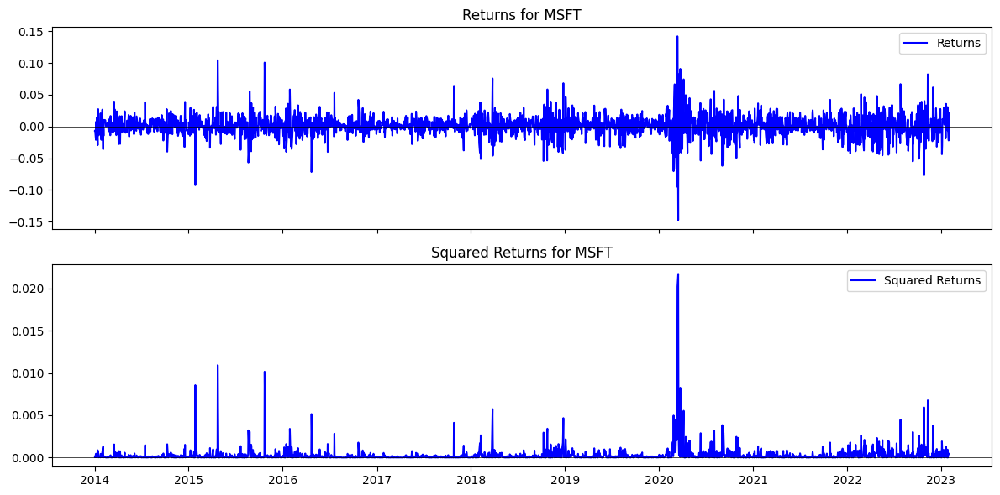

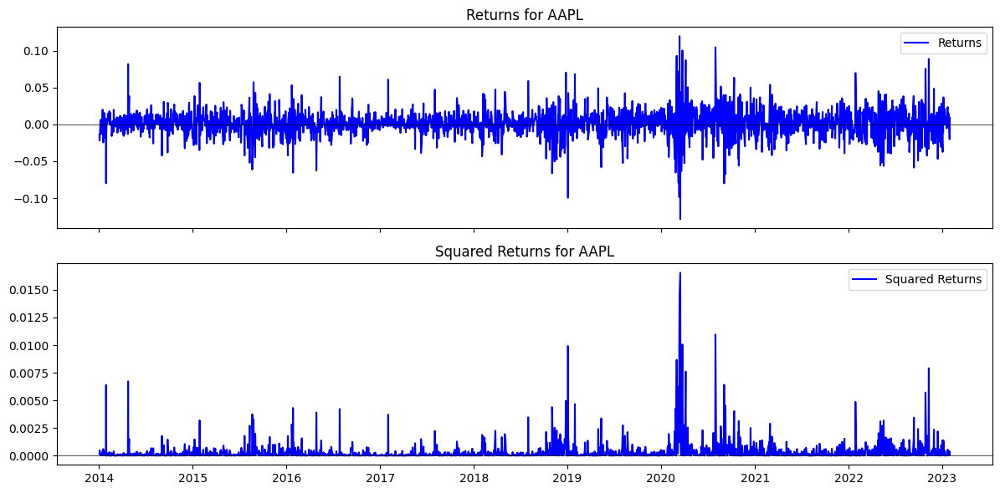

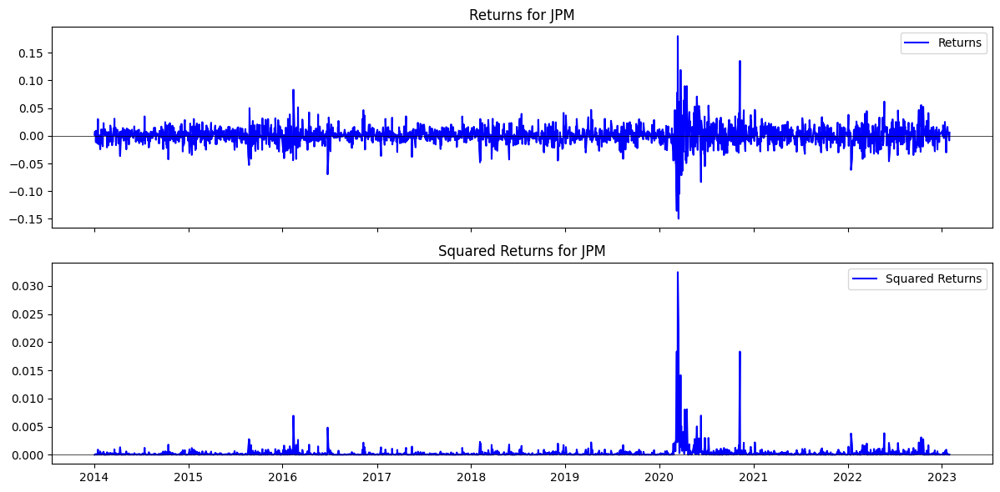

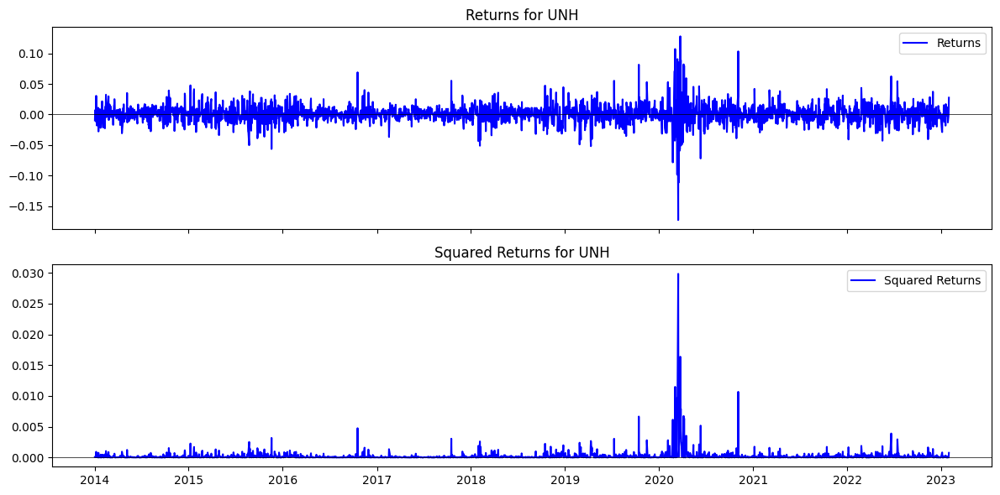

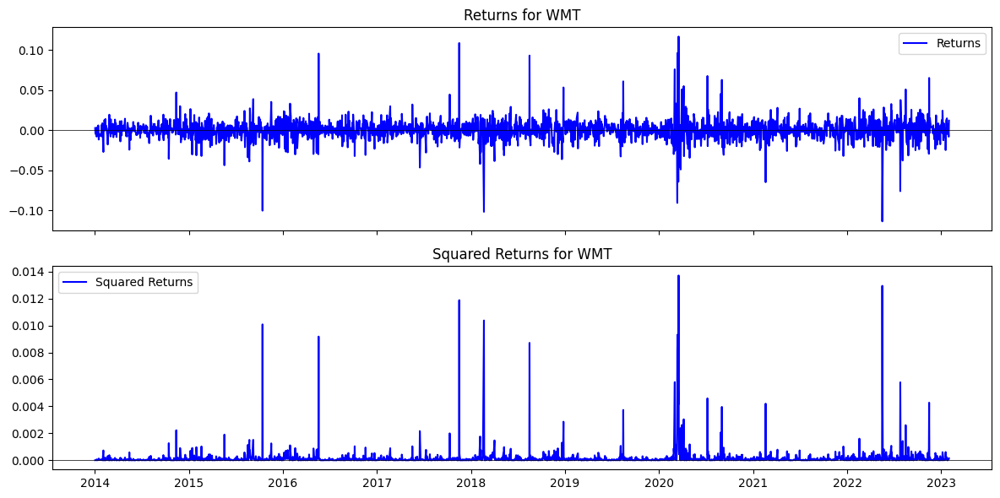

...

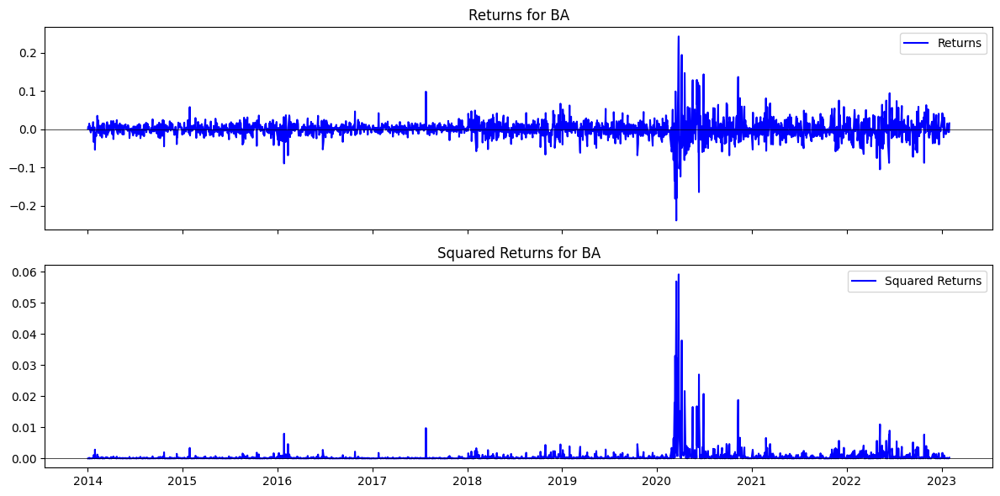

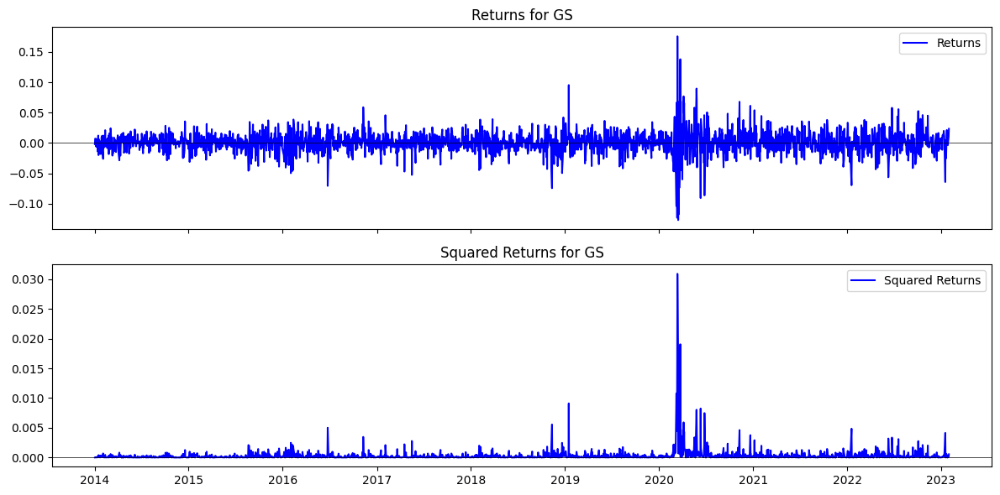

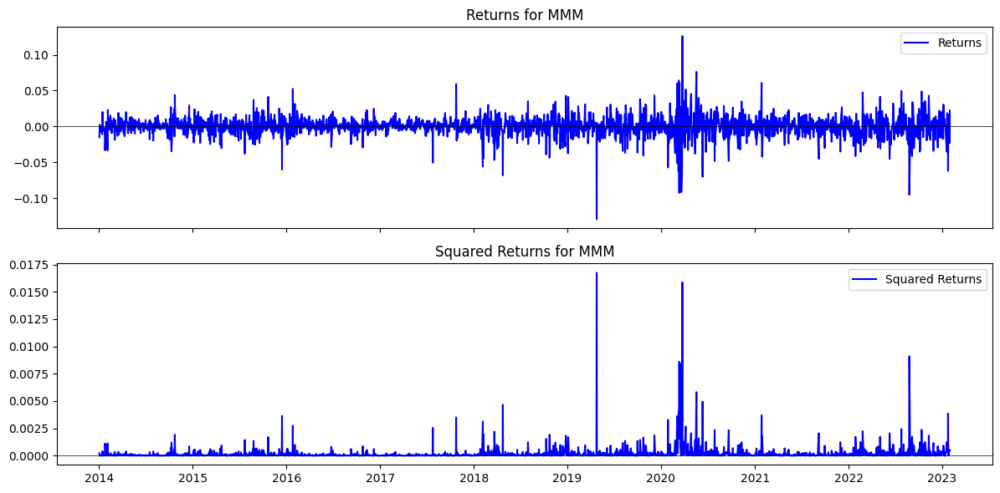

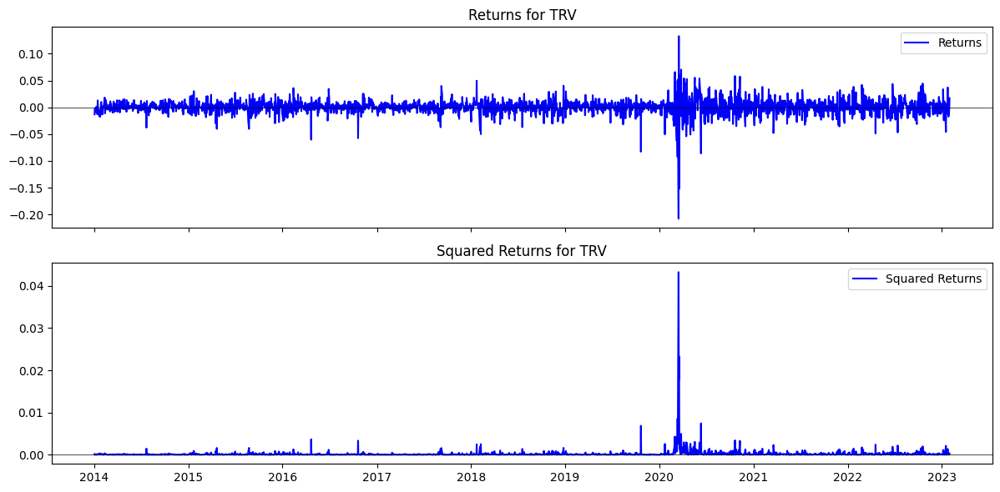

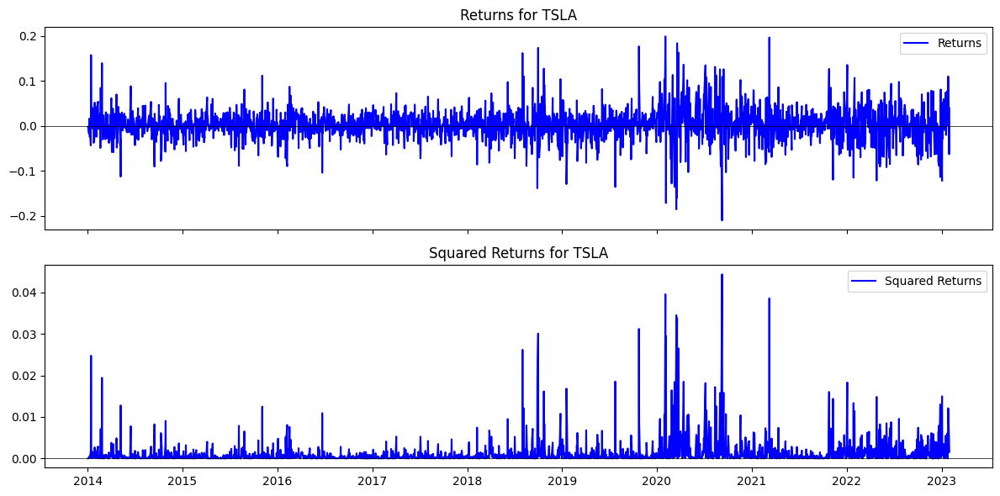

In [101]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your dataset
# Assuming your DataFrame is already read from the CSV and is named df
# df = pd.read_csv('/mnt/data/your_stock_data.csv')

# Ensure 'date' column is in the proper datetime format if it's not already
df['date'] = pd.to_datetime(df['date'])

# Calculate squared returns, if not already present in the DataFrame
if 'squared_returns' not in df.columns:
    df['squared_returns'] = df['return'] ** 2

# Assuming your DataFrame has a 'ticker' column
unique_tickers = df['ticker'].unique()

for ticker in unique_tickers:
    # Filter the DataFrame for the current ticker
    ticker_df = df[df['ticker'] == ticker]

    # Create subplots for each ticker
    fig, axs = plt.subplots(2, 1, figsize=(12, 6), sharex=True)

    # Plot returns for the ticker
    axs[0].plot(ticker_df['date'], ticker_df['return'], label='Returns', color='blue')
    axs[0].set_title(f'Returns for {ticker}')
    axs[0].axhline(0, color='black', linewidth=0.5)
    axs[0].legend()

    # Plot squared returns for the ticker
    axs[1].plot(ticker_df['date'], ticker_df['squared_returns'], label='Squared Returns', color='blue')
    axs[1].set_title(f'Squared Returns for {ticker}')
    axs[1].axhline(0, color='black', linewidth=0.5)
    axs[1].legend()

    # Improve layout and show plot
    plt.tight_layout()
    plt.show()


In [102]:
# Define a function to calculate the high volatility threshold
def high_volatility_threshold(returns_series, percentile=95):
    return returns_series.quantile(percentile / 100.0)

# Apply the function to each stock's squared returns to find the threshold
volatility_thresholds = df.groupby('ticker')['squared_returns'].apply(high_volatility_threshold)


In [103]:
# Initialize a dictionary to hold the high volatility periods
high_volatility_periods = {}

for ticker in df['ticker'].unique():
    # Get the threshold for this ticker
    threshold = volatility_thresholds[ticker]

    # Filter the periods where squared returns exceed the threshold
    high_vol_periods = df[(df['ticker'] == ticker) & (df['squared_returns'] > threshold)]

    # Store the results
    high_volatility_periods[ticker] = high_vol_periods


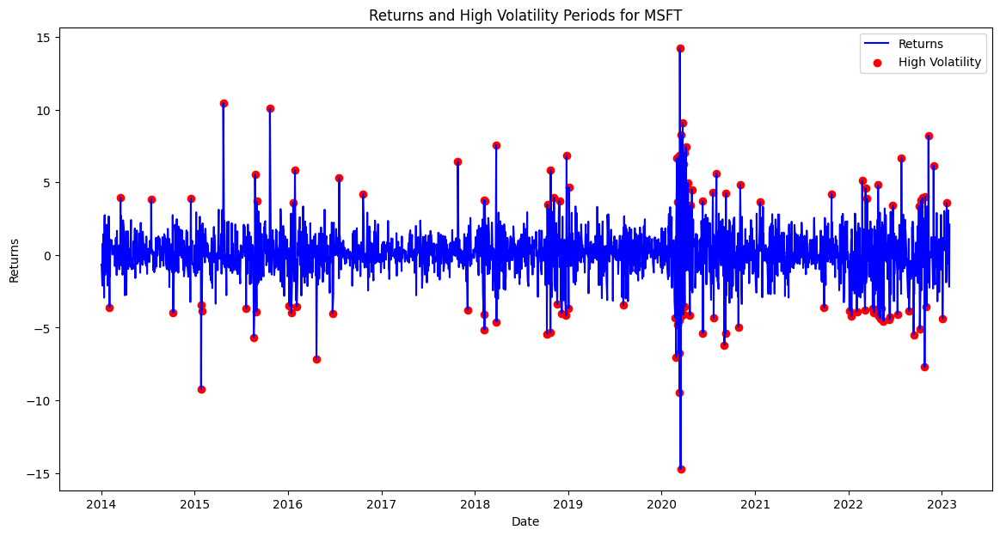

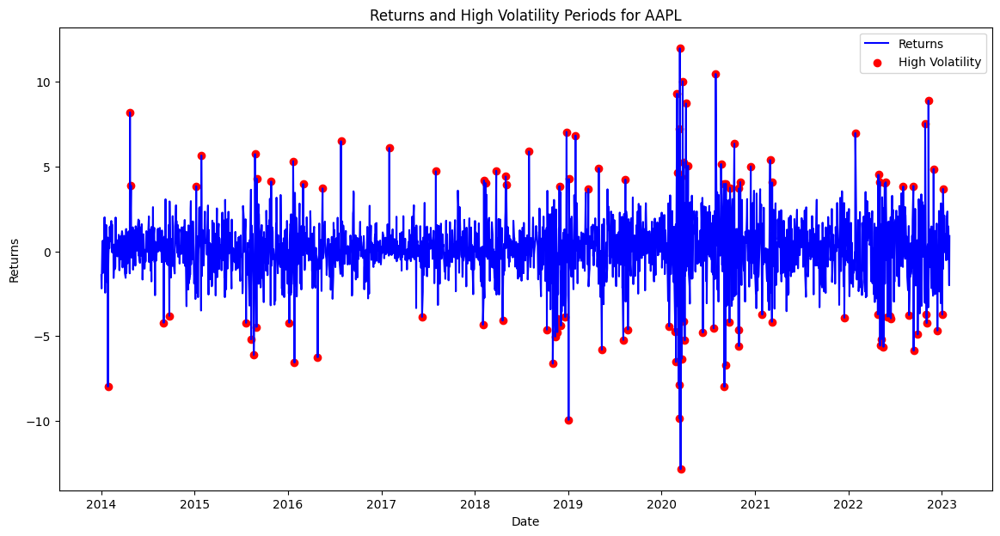

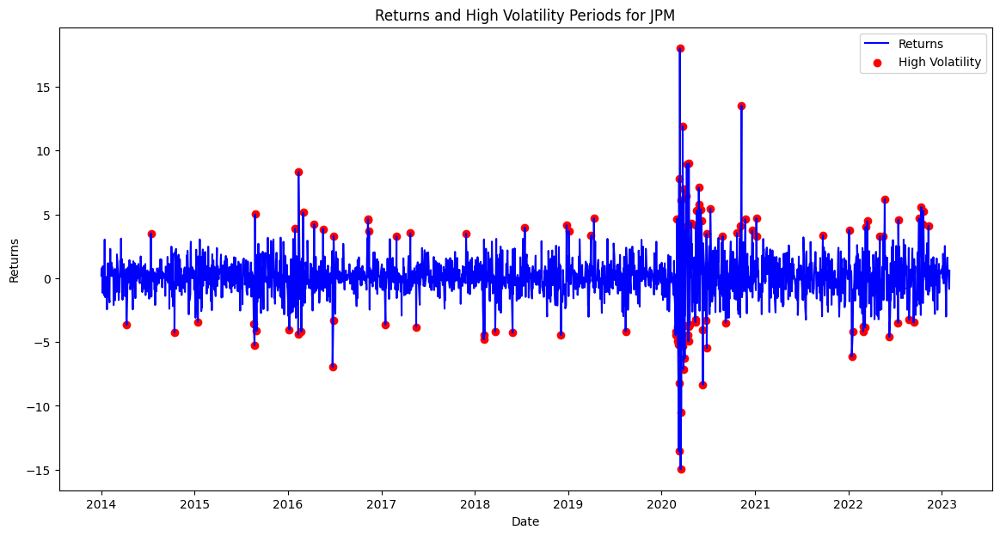

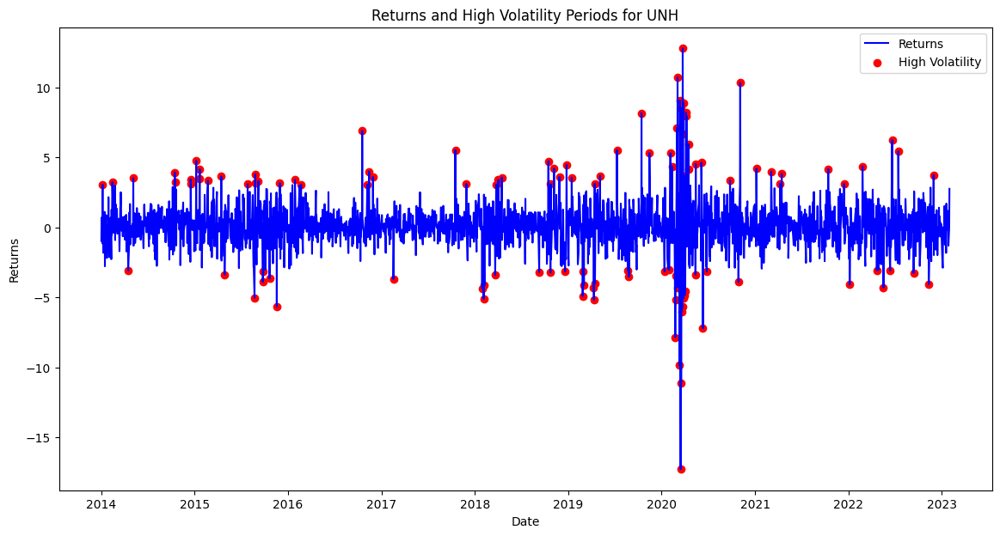

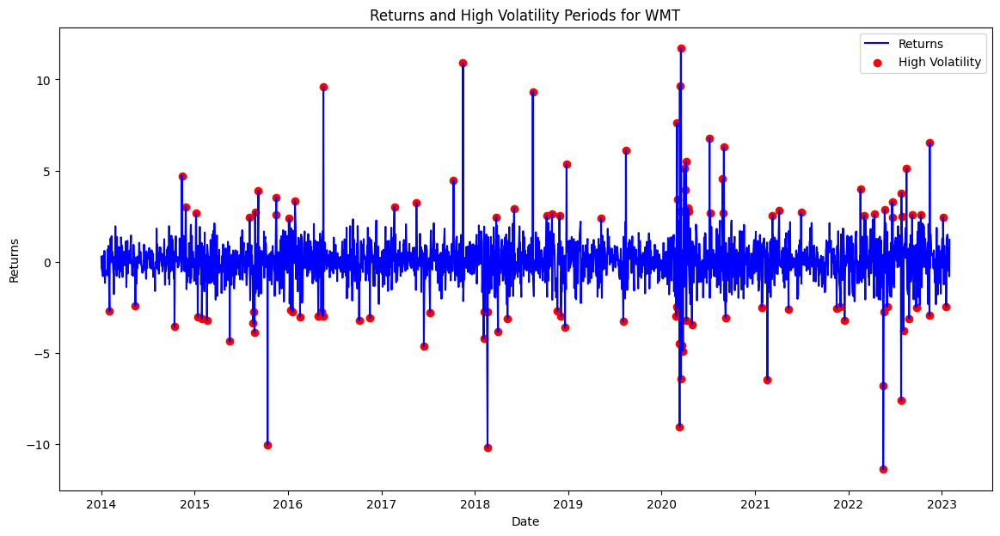

...

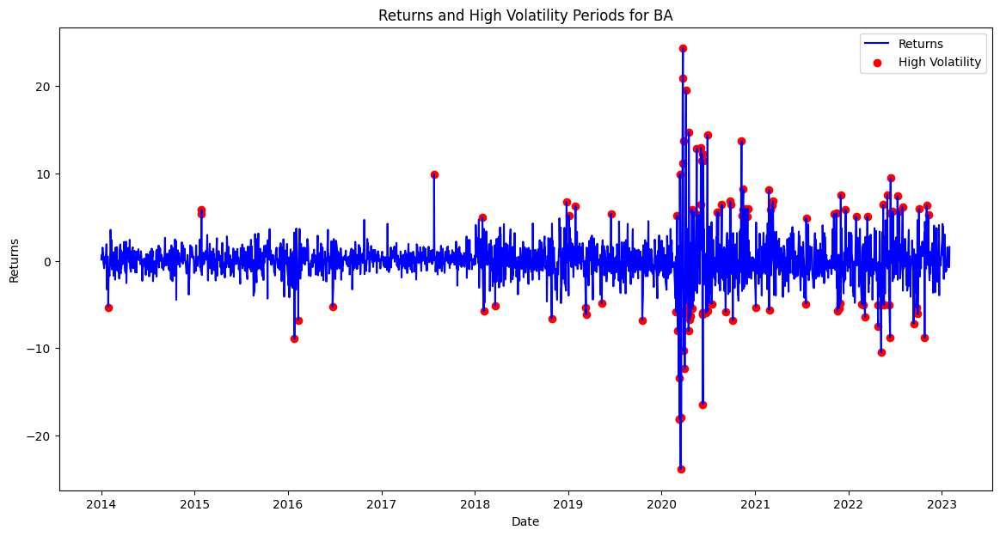

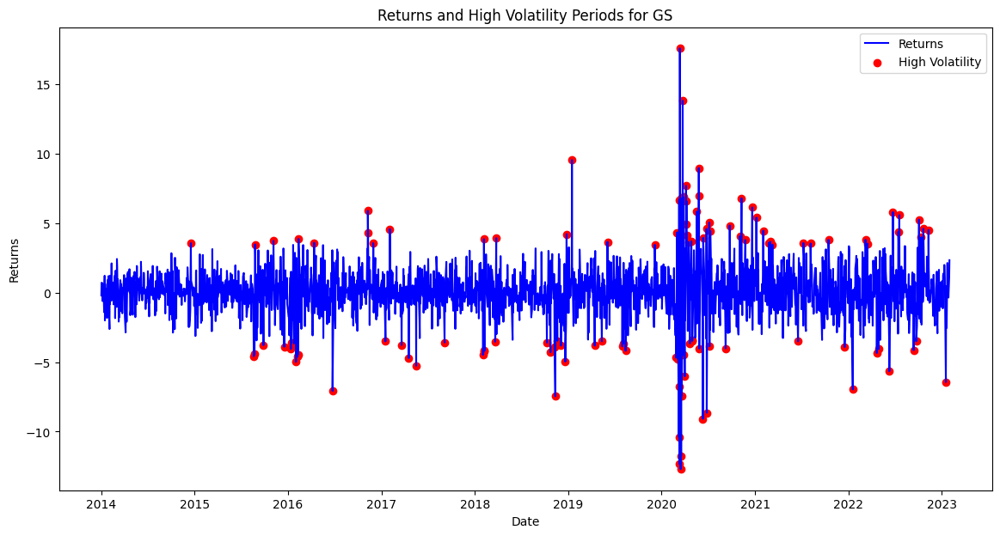

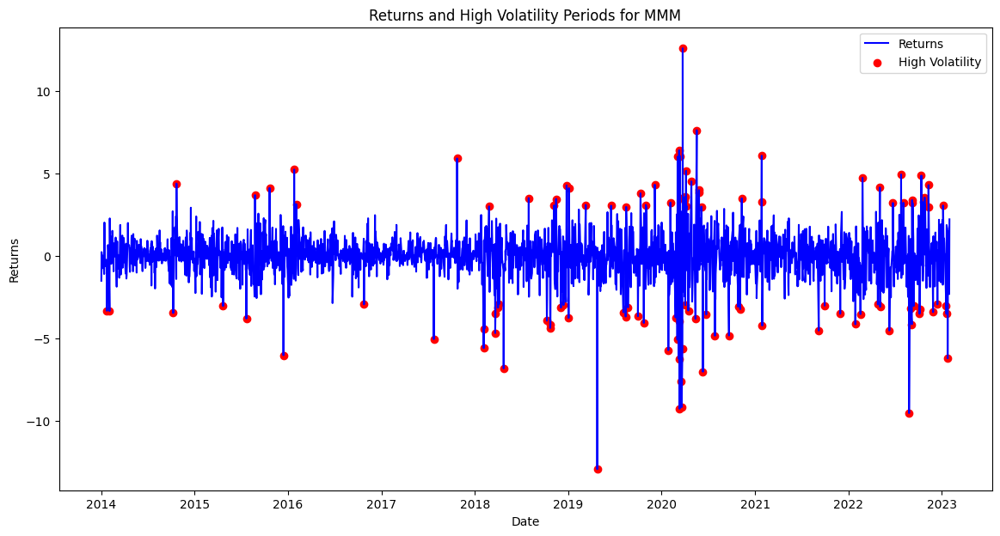

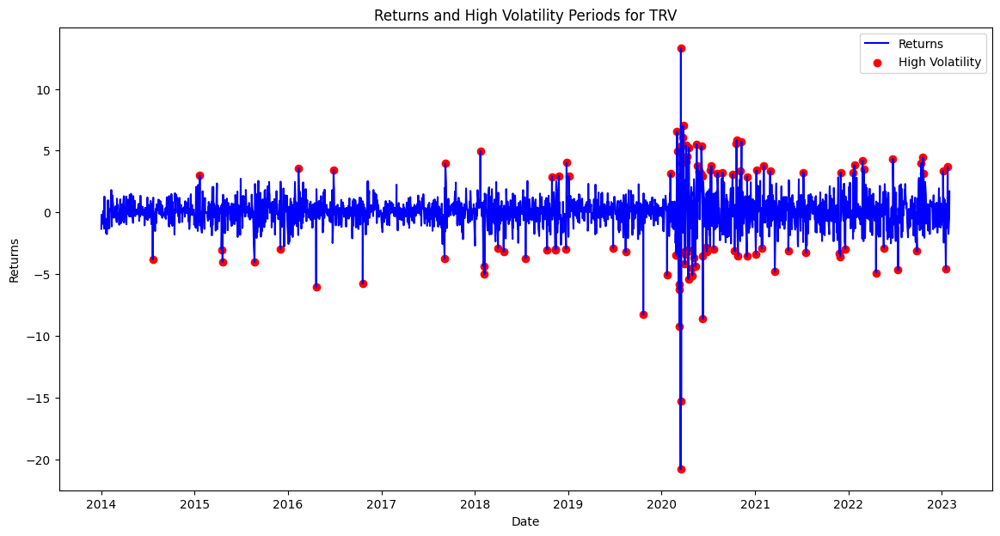

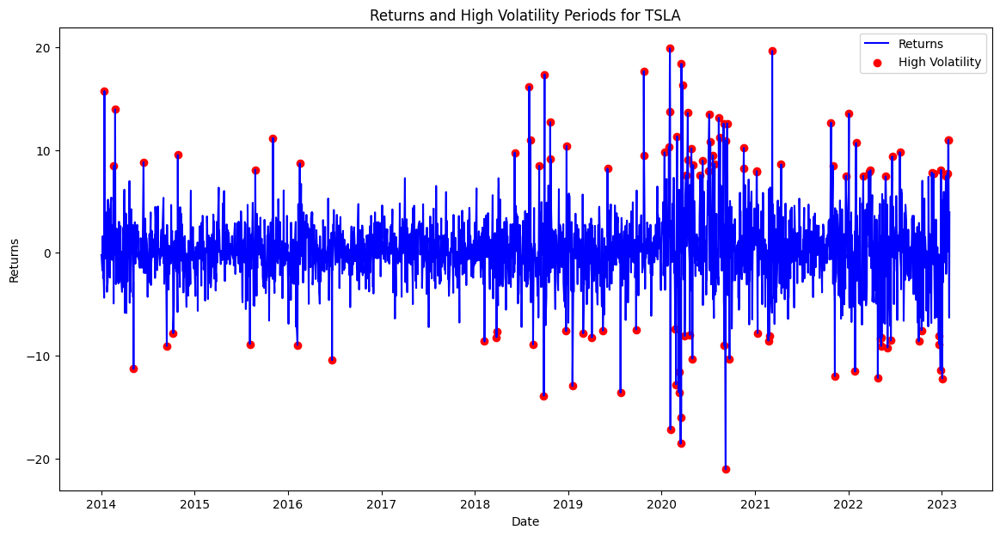

In [104]:
# Loop through each unique ticker in the DataFrame
for ticker in df['ticker'].unique():
    # Select data for the current ticker
    ticker_data = df[df['ticker'] == ticker]

    # If the ticker has high volatility periods recorded, fetch them
    high_vol_data = high_volatility_periods.get(ticker, pd.DataFrame())

    # Create a plot for the ticker
    plt.figure(figsize=(14, 7))
    plt.plot(ticker_data['date'], ticker_data['returns'], label='Returns', color='blue')

    # If there are high volatility periods, plot them
    if not high_vol_data.empty:
        plt.scatter(high_vol_data['date'], high_vol_data['returns'], color='red', label='High Volatility', marker='o')

    plt.title(f'Returns and High Volatility Periods for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.legend()
    plt.show()


In [105]:
post_covid_high_volatility_top5

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility
date,,,,,,,,,,,,,,,,,,
2020-03-10,22130,2020-03-10,14541,CVX,84.98000,22592128.0,0.053428,86.30000,81.04000,86.24000,83.670000,1.597050e+08,5.3428,61.06,61.38,5.3428,5.121053,True
2020-03-10,44990,2020-03-10,18542,CAT,106.49000,8293227.0,0.023254,109.06000,99.11000,108.64000,104.085000,5.857834e+07,2.3254,46.86,70.55,2.3254,4.778657,True
2020-03-10,56420,2020-03-10,86868,GS,184.35001,6803867.0,0.066779,185.39500,173.28500,181.62000,179.340000,6.372482e+07,6.6779,60.52,77.00,6.6779,4.050774,True
2020-01-14,63240,2020-01-14,93436,TSLA,537.91998,28955735.0,0.024883,547.40997,524.90002,544.25500,536.154995,9.739687e+07,2.4883,18.48,17.28,2.4883,3.793798,True
2020-03-03,3837,2020-03-03,14593,AAPL,289.32001,79720151.0,-0.031759,304.00000,285.79999,303.67001,294.899995,1.265914e+09,-3.1759,59.16,43.24,-3.1759,3.784335,True


In [106]:
pre_covid_high_volatility_top5

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility
date,,,,,,,,,,,,,,,,,,
2014-01-15,61731,2014-01-15,93436,TSLA,164.13000,20407704.0,0.017734,172.23,162.10001,168.45,167.165005,2.020293e+07,1.7734,10.00,5.00,1.7734,5.041375,True
2019-04-26,58487,2019-04-26,22592,MMM,191.67000,4491273.0,0.004981,192.25,189.36000,190.53,190.805000,1.103822e+08,0.4981,40.87,21.12,0.4981,3.980878,True
2016-01-25,48524,2016-01-25,59176,AXP,55.02000,18498255.0,-0.000726,55.77,54.14000,54.46,54.955000,5.415321e+07,-0.0726,30.68,10.92,-0.0726,3.826357,True
2014-09-29,45906,2014-09-29,57665,NKE,89.12000,7425478.0,-0.004246,90.10,88.27000,88.27,89.185000,6.155875e+07,-0.4246,5.40,0.90,-0.4246,3.761732,True
2019-04-15,35619,2019-04-15,26403,DIS,132.03999,32773740.0,0.015224,132.70,129.78999,131.05,131.244995,2.373579e+08,1.5224,39.44,11.80,1.5224,3.577618,True


In [107]:
df.head()

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,,,,,
2014-01-02,0,2014-01-02,10107,MSFT,37.16,30423757.0,-0.006683,37.40,37.10,37.350,37.25,308428000.0,-0.6683,3.25,3.15,-0.6683,1.523906,False,0.000045
2014-01-03,1,2014-01-03,10107,MSFT,36.91,30944370.0,-0.006728,37.22,36.60,37.200,36.91,306353000.0,-0.6728,3.38,1.54,-0.6728,1.477227,False,0.000045
2014-01-06,2,2014-01-06,10107,MSFT,36.13,43111355.0,-0.021133,36.89,36.11,36.850,36.50,299879000.0,-2.1133,4.03,2.24,-2.1133,1.434310,False,0.000447
2014-01-07,3,2014-01-07,10107,MSFT,36.41,35478667.0,0.007750,36.49,36.21,36.325,36.35,302203000.0,0.7750,4.94,1.19,0.7750,1.521598,False,0.000060
2014-01-08,4,2014-01-08,10107,MSFT,35.76,59452427.0,-0.017852,36.14,35.58,36.000,35.86,296808000.0,-1.7852,5.33,1.68,-1.7852,1.473733,False,0.000319


In [108]:
# Assuming your DataFrame is already loaded and contains pre-COVID and post-COVID data

# Define a function to calculate volatility measure (e.g., standard deviation of returns)
def calculate_volatility(returns_series):
    return returns_series.std()

# Split the dataset into pre-COVID and post-COVID periods
pre_covid_data = df[df['date'] < '2020-01-01']
post_covid_data = df[df['date'] >= '2020-01-01']

# Calculate volatility for each stock in pre-COVID period
pre_covid_volatility = pre_covid_data.groupby('ticker')['return'].apply(calculate_volatility)

# Calculate volatility for each stock in post-COVID period
post_covid_volatility = post_covid_data.groupby('ticker')['return'].apply(calculate_volatility)

# Rank the stocks based on volatility measure for each period
top_pre_covid_volatility = pre_covid_volatility.nlargest(5)
top_post_covid_volatility = post_covid_volatility.nlargest(5)

print("Top 5 Volatile Stocks Pre-COVID:")
print(top_pre_covid_volatility)

print("\nTop 5 Volatile Stocks Post-COVID:")
print(top_post_covid_volatility)


Top 5 Volatile Stocks Pre-COVID:
ticker
TSLA    0.028664
CRM     0.018836
CAT     0.016216
INTC    0.015779
BA      0.015325
Name: return, dtype: float64

Top 5 Volatile Stocks Post-COVID:
ticker
TSLA    0.045804
BA      0.037959
AXP     0.028543
CRM     0.027709
CVX     0.026599
Name: return, dtype: float64


In [1]:
pre_covid_volatility

NameError: name 'pre_covid_volatility' is not defined

In [109]:
top_pre_covid_volatility

ticker
TSLA    0.028664
CRM     0.018836
CAT     0.016216
INTC    0.015779
BA      0.015325
Name: return, dtype: float64

In [110]:
# Step 1: Calculate volatility using the standard deviation of returns
# Define a function to calculate volatility measure (standard deviation of returns)
def calculate_volatility(returns_series):
    return returns_series.std()

# Calculate volatility for a specific stock in the pre-COVID period
ticker = 'TSLA'  # Example stock ticker
pre_covid_data_tsla = pre_covid_data[pre_covid_data['ticker'] == ticker]
volatility_calculated = calculate_volatility(pre_covid_data_tsla['return'])

# Step 2: Check if the calculated volatility matches the value in the 'volatility' column
# Get the volatility value from the DataFrame
volatility_from_dataframe = pre_covid_data_tsla['volatility'].iloc[0]  # Assuming there's only one row for TSLA

# Compare the calculated volatility with the value from the DataFrame
if volatility_calculated == volatility_from_dataframe:
    print("The calculated volatility matches the value from the DataFrame.")
else:
    print("The calculated volatility does not match the value from the DataFrame.")



The calculated volatility does not match the value from the DataFrame.


In [111]:
top_pre_covid_volatility

ticker
TSLA    0.028664
CRM     0.018836
CAT     0.016216
INTC    0.015779
BA      0.015325
Name: return, dtype: float64

In [112]:
top_post_covid_volatility

ticker
TSLA    0.045804
BA      0.037959
AXP     0.028543
CRM     0.027709
CVX     0.026599
Name: return, dtype: float64

In [113]:
#Currently moving with this

In [114]:
# Assuming 'df' is your DataFrame containing the data
import pandas as pd

# Split the dataset into pre-COVID and post-COVID periods
pre_covid_data = df[df['date'] < '2020-01-01']
post_covid_data = df[df['date'] >= '2020-01-01']

# Calculate mean volatility before and after COVID-19
mean_pre_covid_volatility = pre_covid_data.groupby('ticker')['volatility'].mean()
mean_post_covid_volatility = post_covid_data.groupby('ticker')['volatility'].mean()

# Select top 5 volatile stocks before and after COVID-19 based on mean volatility
top_pre_covid_volatility = mean_pre_covid_volatility.nlargest(5)
top_post_covid_volatility = mean_post_covid_volatility.nlargest(5)

print("Top 5 Volatile Stocks Before COVID-19 (Based on Mean Volatility):")
print(top_pre_covid_volatility)

print("\nTop 5 Volatile Stocks After COVID-19 (Based on Mean Volatility):")
print(top_post_covid_volatility)


Top 5 Volatile Stocks Before COVID-19 (Based on Mean Volatility):
ticker
TSLA    2.604066
CRM     1.770994
CAT     1.597589
INTC    1.549979
AAPL    1.522579
Name: volatility, dtype: float64

Top 5 Volatile Stocks After COVID-19 (Based on Mean Volatility):
ticker
TSLA    3.976353
BA      3.039144
CRM     2.427382
AXP     2.336272
INTC    2.283602
Name: volatility, dtype: float64


In [115]:
# Create DataFrames for the top 5 volatile stocks before and after COVID-19
pre_covid_top_stocks = pre_covid_data[pre_covid_data['ticker'].isin(top_pre_covid_volatility.index)]
post_covid_top_stocks = post_covid_data[post_covid_data['ticker'].isin(top_post_covid_volatility.index)]

print("DataFrame of Top 5 Volatile Stocks Before COVID-19:")
print(pre_covid_top_stocks.head())

print("\nDataFrame of Top 5 Volatile Stocks After COVID-19:")
print(post_covid_top_stocks.head())


DataFrame of Top 5 Volatile Stocks Before COVID-19:
            Unnamed: 0       date  permno ticker      price      volume  \
date                                                                      
2014-01-02        2286 2014-01-02   14593   AAPL  553.13000   8338094.0   
2014-01-03        2287 2014-01-03   14593   AAPL  540.97998  13992006.0   
2014-01-06        2288 2014-01-06   14593   AAPL  543.92999  14820614.0   
2014-01-07        2289 2014-01-07   14593   AAPL  540.03748  11381939.0   
2014-01-08        2290 2014-01-08   14593   AAPL  543.46002   9199689.0   

              return       high        low       open   avg_price  \
date                                                                
2014-01-02 -0.014064  557.03003  552.02100  555.67999  554.525515   
2014-01-03 -0.021966  553.70001  540.42999  552.85999  547.065000   
2014-01-06  0.005453  546.79999  533.59998  537.45001  540.199985   
2014-01-07 -0.007156  545.96002  537.92499  544.32001  541.942505   
2014-01-

In [116]:
pre_covid_top_stocks.describe()

,Unnamed: 0,permno,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,squared_returns
count,7550.000000,7550.00000,7550.000000,7.550000e+03,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000,7.550000e+03,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000
mean,33215.700000,55222.80000,136.598275,1.588654e+07,0.000879,138.222376,134.838513,136.558319,136.530445,2.199275e+08,0.087856,31.022356,10.304654,0.087856,1.809041,0.000385
std,19903.486711,33759.65609,97.149623,1.673036e+07,0.019608,98.453634,95.714935,97.087326,97.075293,2.788444e+08,1.960756,19.631252,10.677028,1.960756,0.706004,0.001203
min,2286.000000,14593.00000,23.520000,7.102770e+05,-0.139015,23.760000,23.500000,23.600000,23.630000,1.715150e+07,-13.901500,1.080000,0.000000,-13.901500,0.839583,0.000000
25%,23237.250000,18542.00000,66.920000,4.351750e+06,-0.007887,67.842500,66.112500,66.880000,66.910625,4.917065e+07,-0.788675,13.200000,2.465000,-0.788675,1.305258,0.000017
50%,32758.500000,59328.00000,111.035000,7.617812e+06,0.000735,112.125000,109.695000,110.845000,110.785000,8.067736e+07,0.073500,27.300000,7.560000,0.073500,1.634551,0.000083
75%,44565.750000,90215.00000,185.147500,2.363867e+07,0.010223,187.260000,182.484992,184.802507,185.271209,2.148731e+08,1.022325,50.400000,15.300000,1.022325,2.133503,0.000318
max,63231.000000,93436.00000,647.349980,1.898486e+08,0.176692,651.260010,644.469970,649.900020,647.864990,1.288147e+09,17.669200,100.000000,100.000000,17.669200,6.893301,0.031220


In [117]:
# Check the highest and lowest date
highest_date = pre_covid_top_stocks['date'].max()
lowest_date = pre_covid_top_stocks['date'].min()

# Get all unique tickers
unique_tickers = pre_covid_top_stocks['ticker'].unique()

print("Highest Date in pre_covid_top_stocks:", highest_date)
print("Lowest Date in pre_covid_top_stocks:", lowest_date)
print("All Unique Tickers in pre_covid_top_stocks:", unique_tickers)


Highest Date in pre_covid_top_stocks: 2019-12-31 00:00:00
Lowest Date in pre_covid_top_stocks: 2014-01-02 00:00:00
All Unique Tickers in pre_covid_top_stocks: ['AAPL' 'CRM' 'INTC' 'CAT' 'TSLA']


In [118]:
# Check the highest and lowest date
highest_date = post_covid_top_stocks['date'].max()
lowest_date = post_covid_top_stocks['date'].min()

# Get all unique tickers
unique_tickers = pre_covid_top_stocks['ticker'].unique()

print("Highest Date in post_covid_top_stocks:", highest_date)
print("Lowest Date in post_covid_top_stocks:", lowest_date)
print("All Unique Tickers in post_covid_top_stocks:", unique_tickers)


Highest Date in post_covid_top_stocks: 2023-01-31 00:00:00
Lowest Date in post_covid_top_stocks: 2020-01-02 00:00:00
All Unique Tickers in post_covid_top_stocks: ['AAPL' 'CRM' 'INTC' 'CAT' 'TSLA']


In [119]:
## Data Cleaning

In [120]:
pre_covid_top_stocks.head()

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,,,,,
2014-01-02,2286,2014-01-02,14593,AAPL,553.13000,8338094.0,-0.014064,557.03003,552.02100,555.67999,554.525515,4.936392e+08,-1.4064,16.43,4.4,-1.4064,1.892723,False,0.000198
2014-01-03,2287,2014-01-03,14593,AAPL,540.97998,13992006.0,-0.021966,553.70001,540.42999,552.85999,547.065000,4.827960e+08,-2.1966,18.02,4.2,-2.1966,1.858734,False,0.000483
2014-01-06,2288,2014-01-06,14593,AAPL,543.92999,14820614.0,0.005453,546.79999,533.59998,537.45001,540.199985,4.854287e+08,0.5453,18.55,4.5,0.5453,1.897441,False,0.000030
2014-01-07,2289,2014-01-07,14593,AAPL,540.03748,11381939.0,-0.007156,545.96002,537.92499,544.32001,541.942505,4.819548e+08,-0.7156,15.90,4.7,-0.7156,1.816480,False,0.000051
2014-01-08,2290,2014-01-08,14593,AAPL,543.46002,9199689.0,0.006338,545.56000,538.69000,538.81000,542.125000,4.850093e+08,0.6338,15.37,5.0,0.6338,1.750521,False,0.000040


In [121]:
# Drop one of the date columns
pre_covid_top_stocks.drop('date', axis=1, inplace=True)


<ipython-input-121-b01c01ce46d2>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_covid_top_stocks.drop('date', axis=1, inplace=True)


In [122]:
# Check the data types of the 'return' columns
print(pre_covid_top_stocks['return'].dtype)
print(pre_covid_top_stocks['returns'].dtype)

# Check the scale of the values in the 'return' columns
print(pre_covid_top_stocks['return'].describe())
print(pre_covid_top_stocks['returns'].describe())


float64
float64
count    7550.000000
mean        0.000879
std         0.019608
min        -0.139015
25%        -0.007887
50%         0.000735
75%         0.010223
max         0.176692
Name: return, dtype: float64
count    7550.000000
mean        0.087856
std         1.960756
min       -13.901500
25%        -0.788675
50%         0.073500
75%         1.022325
max        17.669200
Name: returns, dtype: float64


In [123]:
pre_covid_top_stocks['returns'] /= 100


<ipython-input-123-6ae8b8669537>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_covid_top_stocks['returns'] /= 100


In [124]:
pre_covid_top_stocks.drop('returns', axis=1, inplace=True)


<ipython-input-124-4cab9b227140>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_covid_top_stocks.drop('returns', axis=1, inplace=True)


In [125]:
pre_covid_top_stocks.drop(columns=['Unnamed: 0'], inplace=True)

<ipython-input-125-6450a023bd16>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_covid_top_stocks.drop(columns=['Unnamed: 0'], inplace=True)


In [126]:
pre_covid_top_stocks.drop(columns=['permno'], inplace=True)

<ipython-input-126-e59c40d6684b>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_covid_top_stocks.drop(columns=['permno'], inplace=True)


In [127]:
# Check for null values in the pre_covid_top_stocks DataFrame
null_values = pre_covid_top_stocks.isnull().sum()

# Display the count of null values for each column
print("Null Values in pre_covid_top_stocks DataFrame:")
print(null_values)


Null Values in pre_covid_top_stocks DataFrame:
ticker                  0
price                   0
volume                  0
return                  0
high                    0
low                     0
open                    0
avg_price               0
mkt_cap                 0
pct_return              0
ticker_attention        0
name_price_attention    0
volatility              0
High_Volatility         0
squared_returns         0
dtype: int64


In [128]:
post_covid_top_stocks.drop(columns=['Unnamed: 0'], inplace=True)

<ipython-input-128-ab4697fc8756>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_covid_top_stocks.drop(columns=['Unnamed: 0'], inplace=True)


In [129]:
post_covid_top_stocks['returns'] /= 100


<ipython-input-129-eee48179b102>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_covid_top_stocks['returns'] /= 100


In [130]:
post_covid_top_stocks.drop('returns', axis=1, inplace=True)


<ipython-input-130-290992c599f8>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_covid_top_stocks.drop('returns', axis=1, inplace=True)


In [131]:
post_covid_top_stocks.drop(columns=['permno'], inplace=True)

<ipython-input-131-bea45020e916>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  post_covid_top_stocks.drop(columns=['permno'], inplace=True)


In [132]:
post_covid_top_stocks.head()

,date,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,,
2020-01-02,2020-01-02,CRM,166.99001,5094557.0,0.026746,167.07001,163.58,163.92,165.325005,1.481201e+08,2.6746,48.91,14.1,1.090864,False,0.000715
2020-01-03,2020-01-03,CRM,166.17000,3205583.0,-0.004911,166.77000,165.00,165.06,165.885000,1.473928e+08,-0.4911,58.29,13.8,1.309936,False,0.000024
2020-01-06,2020-01-06,CRM,173.45000,8843581.0,0.043811,173.67000,164.45,165.00,169.060000,1.538502e+08,4.3811,54.94,7.2,1.272252,False,0.001919
2020-01-07,2020-01-07,CRM,176.00000,8310525.0,0.014702,176.87000,172.09,173.23,174.480000,1.561120e+08,1.4702,61.64,0.0,1.771105,False,0.000216
2020-01-08,2020-01-08,CRM,177.33000,7226234.0,0.007557,178.85001,174.75,175.23,176.800005,1.572917e+08,0.7557,64.32,9.0,1.742628,False,0.000057


In [133]:
# Check for null values in the pre_covid_top_stocks DataFrame
null_values = post_covid_top_stocks.isnull().sum()

# Display the count of null values for each column
print("Null Values in post_covid_top_stocks DataFrame:")
print(null_values)


Null Values in post_covid_top_stocks DataFrame:
date                    0
ticker                  0
price                   0
volume                  0
return                  0
high                    0
low                     0
open                    0
avg_price               0
mkt_cap                 0
pct_return              0
ticker_attention        0
name_price_attention    0
volatility              0
High_Volatility         0
squared_returns         0
dtype: int64


In [134]:
## Data Visualisation

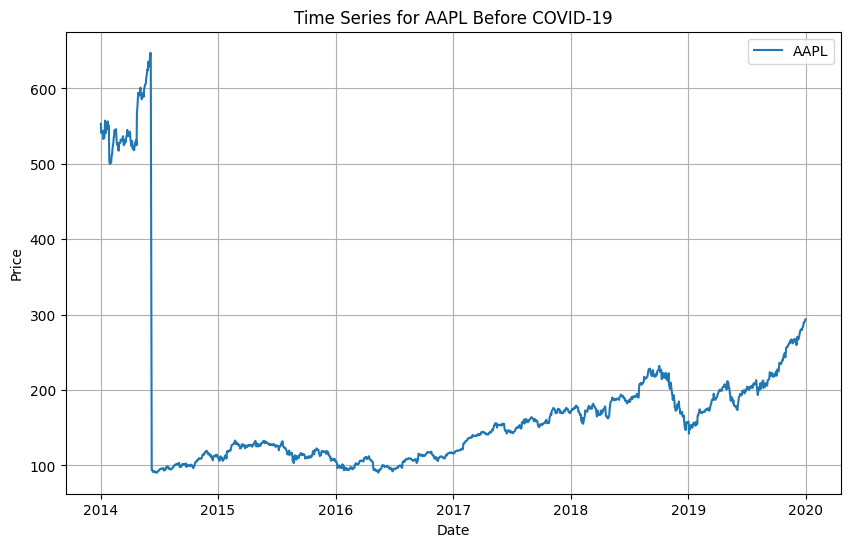

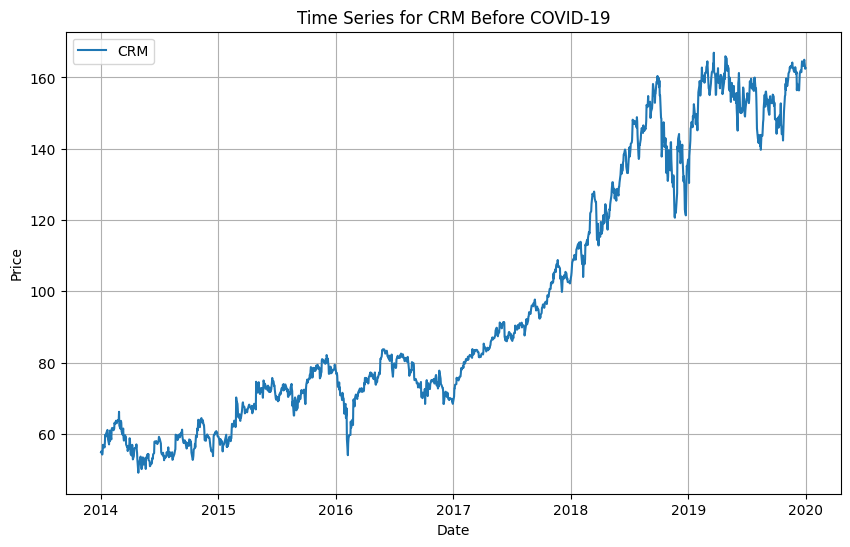

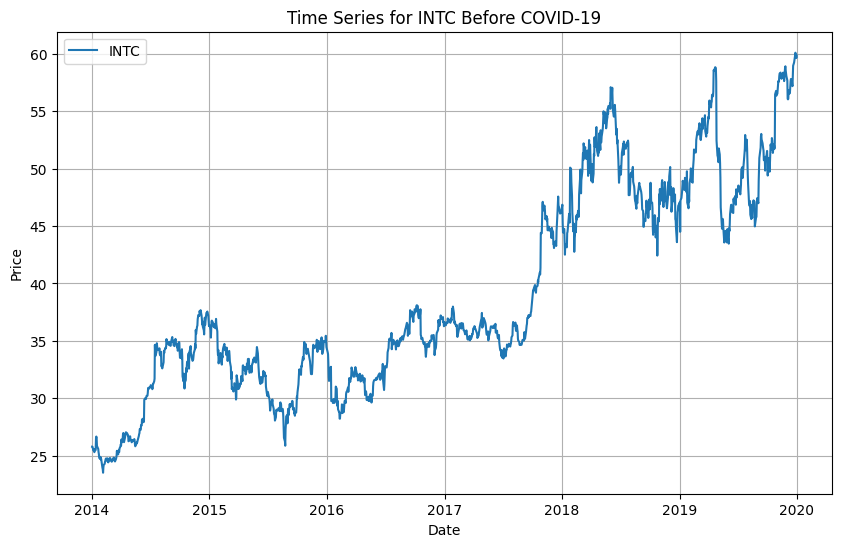

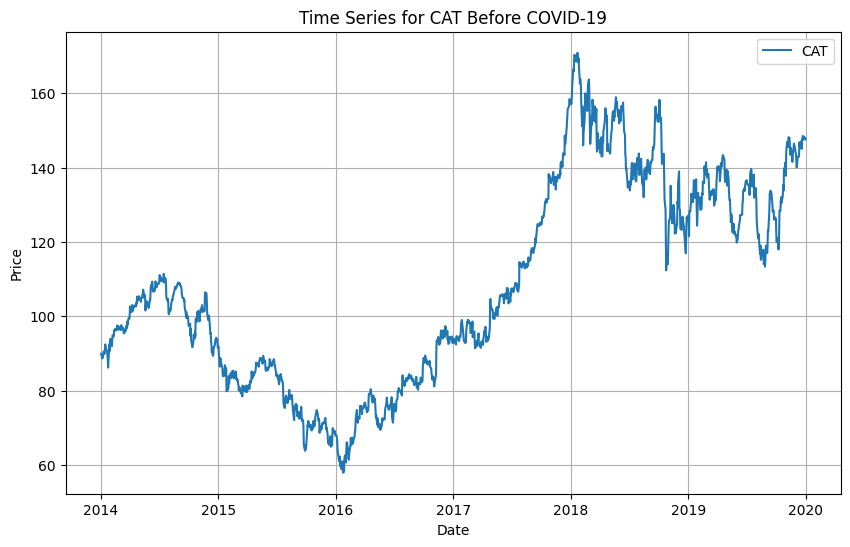

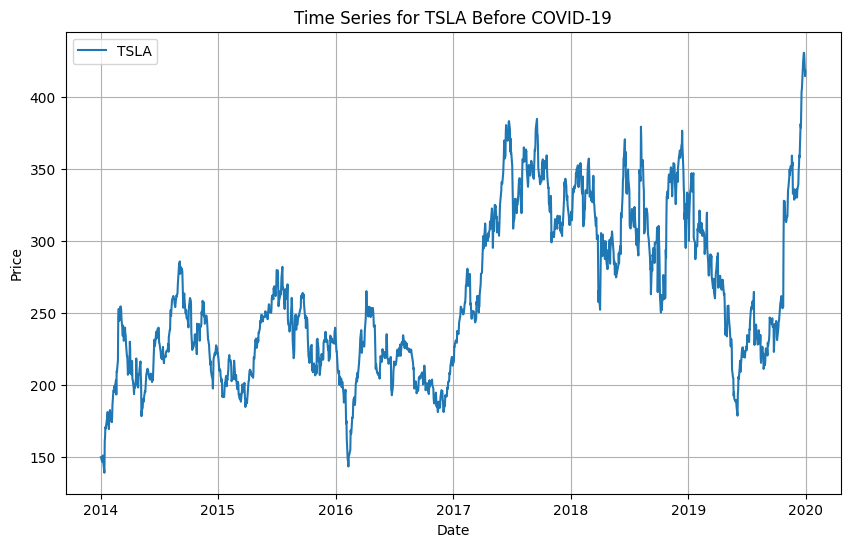

In [135]:
import matplotlib.pyplot as plt

# Iterate over each unique stock ticker
for ticker in pre_covid_top_stocks['ticker'].unique():
    # Extract data for the current stock ticker
    stock_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Plot the time series for the current stock
    plt.figure(figsize=(10, 6))  # Adjust the figure size if needed
    plt.plot(stock_data.index, stock_data['price'], label=ticker)  # Assuming 'price' is the column to plot
    plt.title(f"Time Series for {ticker} Before COVID-19")
    plt.xlabel("Date")
    plt.ylabel("Price")
    plt.legend()
    plt.grid(True)
    plt.show()


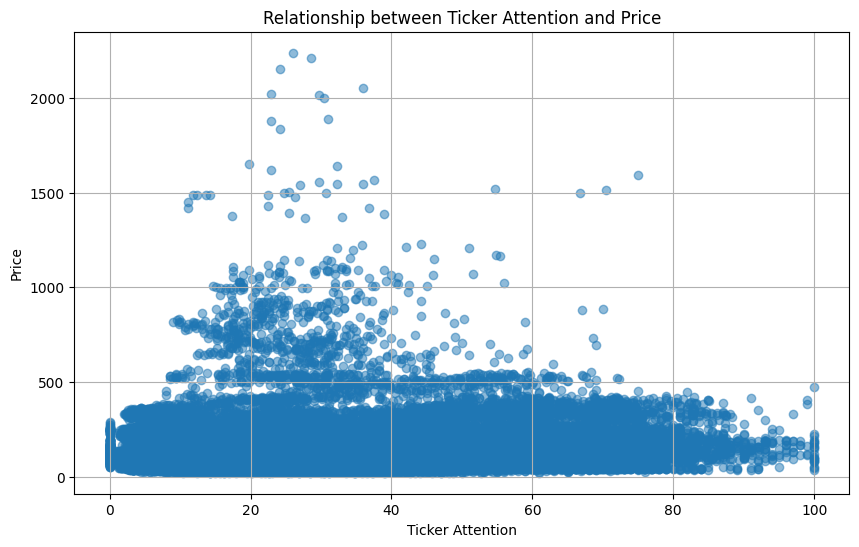

In [136]:
import matplotlib.pyplot as plt

# Plotting the relationship between 'ticker_attention' and 'price'
plt.figure(figsize=(10, 6))
plt.scatter(df['ticker_attention'], df['price'], alpha=0.5)
plt.title('Relationship between Ticker Attention and Price')
plt.xlabel('Ticker Attention')
plt.ylabel('Price')
plt.grid(True)
plt.show()


In [137]:
pre_covid_top_stocks.head(10)

,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,
2014-01-02,AAPL,553.13000,8338094.0,-0.014064,557.03003,552.02100,555.67999,554.525515,4.936392e+08,-1.4064,16.43,4.4,1.892723,False,0.000198
2014-01-03,AAPL,540.97998,13992006.0,-0.021966,553.70001,540.42999,552.85999,547.065000,4.827960e+08,-2.1966,18.02,4.2,1.858734,False,0.000483
2014-01-06,AAPL,543.92999,14820614.0,0.005453,546.79999,533.59998,537.45001,540.199985,4.854287e+08,0.5453,18.55,4.5,1.897441,False,0.000030
2014-01-07,AAPL,540.03748,11381939.0,-0.007156,545.96002,537.92499,544.32001,541.942505,4.819548e+08,-0.7156,15.90,4.7,1.816480,False,0.000051
2014-01-08,AAPL,543.46002,9199689.0,0.006338,545.56000,538.69000,538.81000,542.125000,4.850093e+08,0.6338,15.37,5.0,1.750521,False,0.000040
2014-01-09,AAPL,536.51898,9938497.0,-0.012772,546.85999,535.35010,546.79999,541.105045,4.788148e+08,-1.2772,16.96,4.3,1.681487,False,0.000163
2014-01-10,AAPL,532.94000,10839168.0,-0.006671,540.79999,531.10999,539.83002,535.954990,4.753766e+08,-0.6671,16.43,5.8,1.657192,False,0.000045
2014-01-13,AAPL,535.72998,13474914.0,0.005235,542.50000,529.88000,529.90997,536.190000,4.778652e+08,0.5235,15.37,4.6,1.600626,False,0.000027
2014-01-14,AAPL,546.39001,12687522.0,0.019898,546.72998,537.65997,538.21997,542.194975,4.873739e+08,1.9898,17.49,4.4,1.538628,False,0.000396


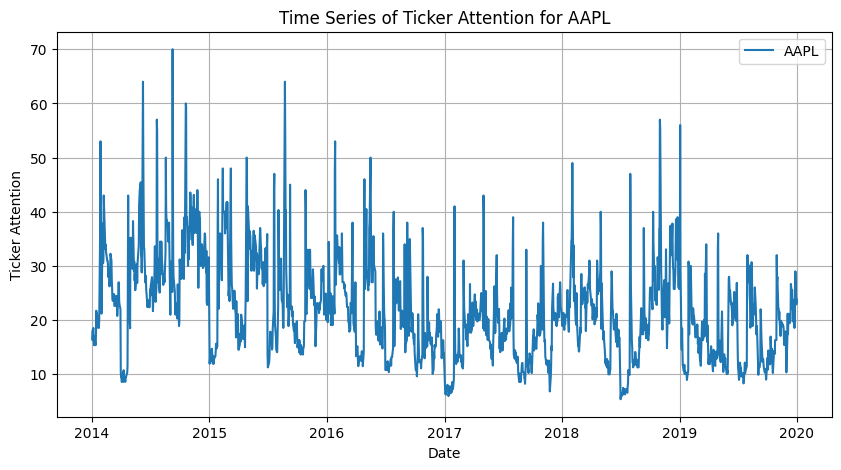

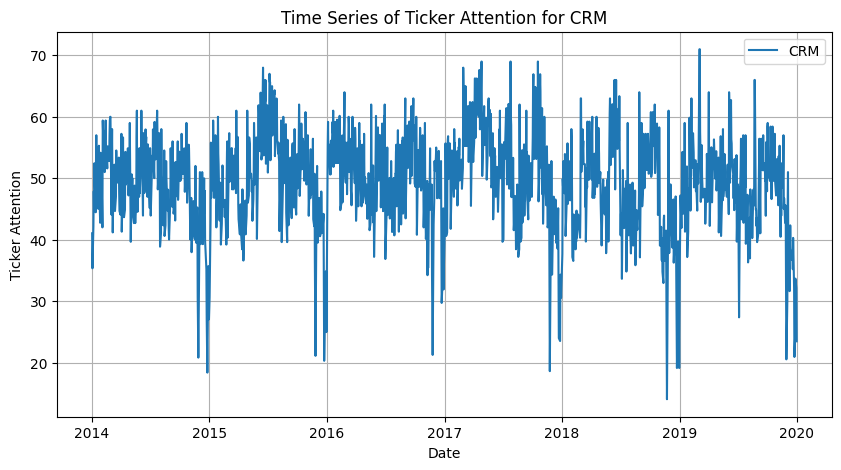

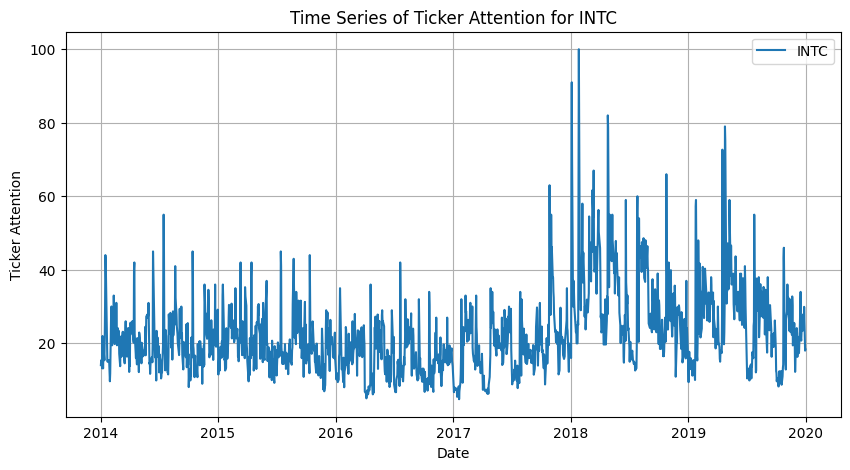

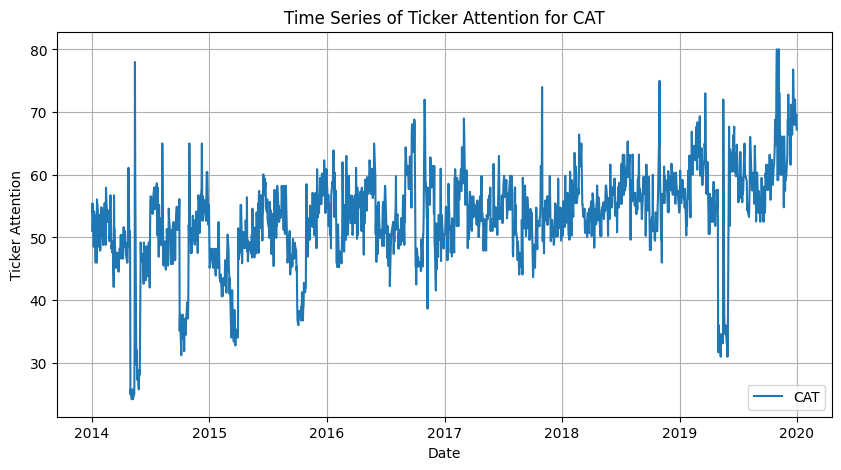

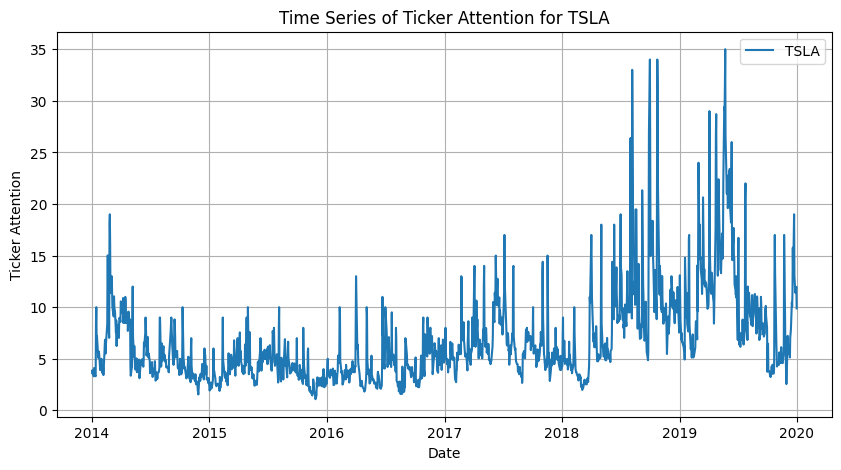

In [138]:
import matplotlib.pyplot as plt

# Iterate over each unique stock ticker in pre_covid_top_stocks
for ticker in pre_covid_top_stocks['ticker'].unique():
    # Select data for the current ticker
    ticker_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Plot the time series for ticker_attention
    plt.figure(figsize=(10, 5))
    plt.plot(ticker_data.index, ticker_data['ticker_attention'], label=ticker)
    plt.title(f'Time Series of Ticker Attention for {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Ticker Attention')
    plt.legend()
    plt.grid(True)
    plt.show()


In [139]:
import numpy as np

# Calculate the Pearson correlation coefficient
correlation_coefficient = np.corrcoef(pre_covid_top_stocks['ticker_attention'], pre_covid_top_stocks['price'])[0, 1]

print("Pearson Correlation Coefficient between ticker_attention and price:", correlation_coefficient)


Pearson Correlation Coefficient between ticker_attention and price: -0.40341847240740714


In [140]:
pre_covid_top_stocks.head()

,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,
2014-01-02,AAPL,553.13000,8338094.0,-0.014064,557.03003,552.02100,555.67999,554.525515,4.936392e+08,-1.4064,16.43,4.4,1.892723,False,0.000198
2014-01-03,AAPL,540.97998,13992006.0,-0.021966,553.70001,540.42999,552.85999,547.065000,4.827960e+08,-2.1966,18.02,4.2,1.858734,False,0.000483
2014-01-06,AAPL,543.92999,14820614.0,0.005453,546.79999,533.59998,537.45001,540.199985,4.854287e+08,0.5453,18.55,4.5,1.897441,False,0.000030
2014-01-07,AAPL,540.03748,11381939.0,-0.007156,545.96002,537.92499,544.32001,541.942505,4.819548e+08,-0.7156,15.90,4.7,1.816480,False,0.000051
2014-01-08,AAPL,543.46002,9199689.0,0.006338,545.56000,538.69000,538.81000,542.125000,4.850093e+08,0.6338,15.37,5.0,1.750521,False,0.000040


In [141]:
pre_covid_top_stocks.describe()

,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,volatility,squared_returns
count,7550.000000,7.550000e+03,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000,7.550000e+03,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000
mean,136.598275,1.588654e+07,0.000879,138.222376,134.838513,136.558319,136.530445,2.199275e+08,0.087856,31.022356,10.304654,1.809041,0.000385
std,97.149623,1.673036e+07,0.019608,98.453634,95.714935,97.087326,97.075293,2.788444e+08,1.960756,19.631252,10.677028,0.706004,0.001203
min,23.520000,7.102770e+05,-0.139015,23.760000,23.500000,23.600000,23.630000,1.715150e+07,-13.901500,1.080000,0.000000,0.839583,0.000000
25%,66.920000,4.351750e+06,-0.007887,67.842500,66.112500,66.880000,66.910625,4.917065e+07,-0.788675,13.200000,2.465000,1.305258,0.000017
50%,111.035000,7.617812e+06,0.000735,112.125000,109.695000,110.845000,110.785000,8.067736e+07,0.073500,27.300000,7.560000,1.634551,0.000083
75%,185.147500,2.363867e+07,0.010223,187.260000,182.484992,184.802507,185.271209,2.148731e+08,1.022325,50.400000,15.300000,2.133503,0.000318
max,647.349980,1.898486e+08,0.176692,651.260010,644.469970,649.900020,647.864990,1.288147e+09,17.669200,100.000000,100.000000,6.893301,0.031220


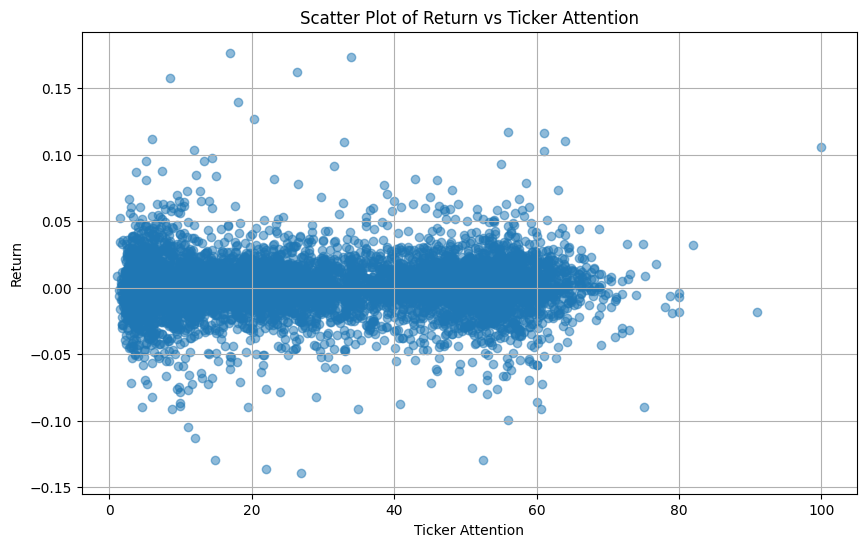

In [142]:
import matplotlib.pyplot as plt

# Scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(pre_covid_top_stocks['ticker_attention'], pre_covid_top_stocks['return'], alpha=0.5)
plt.title('Scatter Plot of Return vs Ticker Attention')
plt.xlabel('Ticker Attention')
plt.ylabel('Return')
plt.grid(True)
plt.show()


In [143]:
import numpy as np

# Calculate the Pearson correlation coefficient
correlation_coefficient = np.corrcoef(pre_covid_top_stocks['ticker_attention'], pre_covid_top_stocks['return'])[0, 1]

print("Pearson Correlation Coefficient between ticker_attention and return:", correlation_coefficient)


Pearson Correlation Coefficient between ticker_attention and return: 0.002441826739211069


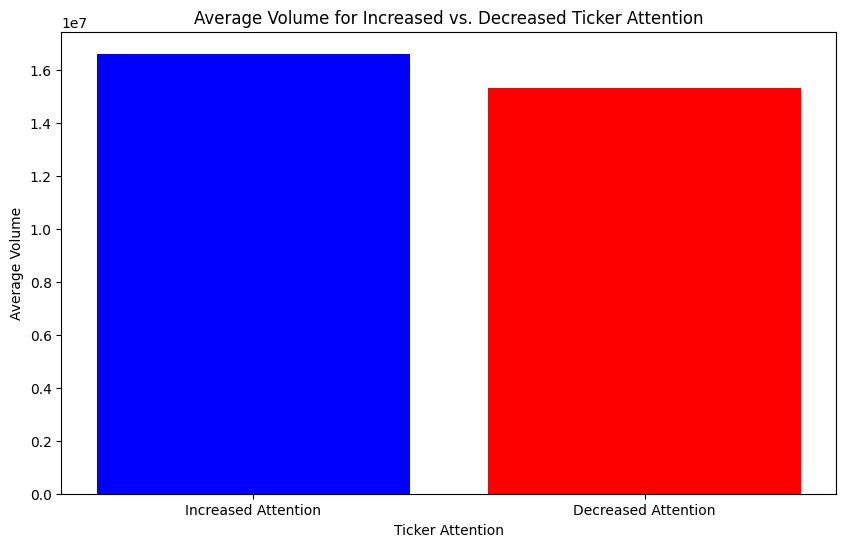

In [144]:
import matplotlib.pyplot as plt

# Divide the data based on changes in ticker attention
increased_attention = pre_covid_top_stocks[pre_covid_top_stocks['ticker_attention'] > pre_covid_top_stocks['ticker_attention'].shift(1)]
decreased_attention = pre_covid_top_stocks[pre_covid_top_stocks['ticker_attention'] < pre_covid_top_stocks['ticker_attention'].shift(1)]

# Calculate average volume for each group
avg_volume_increased = increased_attention['volume'].mean()
avg_volume_decreased = decreased_attention['volume'].mean()

# Visualize the relationship
plt.figure(figsize=(10, 6))
plt.bar(['Increased Attention', 'Decreased Attention'], [avg_volume_increased, avg_volume_decreased], color=['blue', 'red'])
plt.title('Average Volume for Increased vs. Decreased Ticker Attention')
plt.xlabel('Ticker Attention')
plt.ylabel('Average Volume')
plt.show()


In [145]:

import pandas as pd

# Calculate average volume for each group
avg_volume_increased = increased_attention['volume'].mean()
avg_volume_decreased = decreased_attention['volume'].mean()

# Create a DataFrame to display the results
volume_analysis = pd.DataFrame({
    'Ticker Attention': ['Increased', 'Decreased'],
    'Average Volume': [avg_volume_increased, avg_volume_decreased]
})

print(volume_analysis)


  Ticker Attention  Average Volume
0        Increased    1.662566e+07
1        Decreased    1.534223e+07


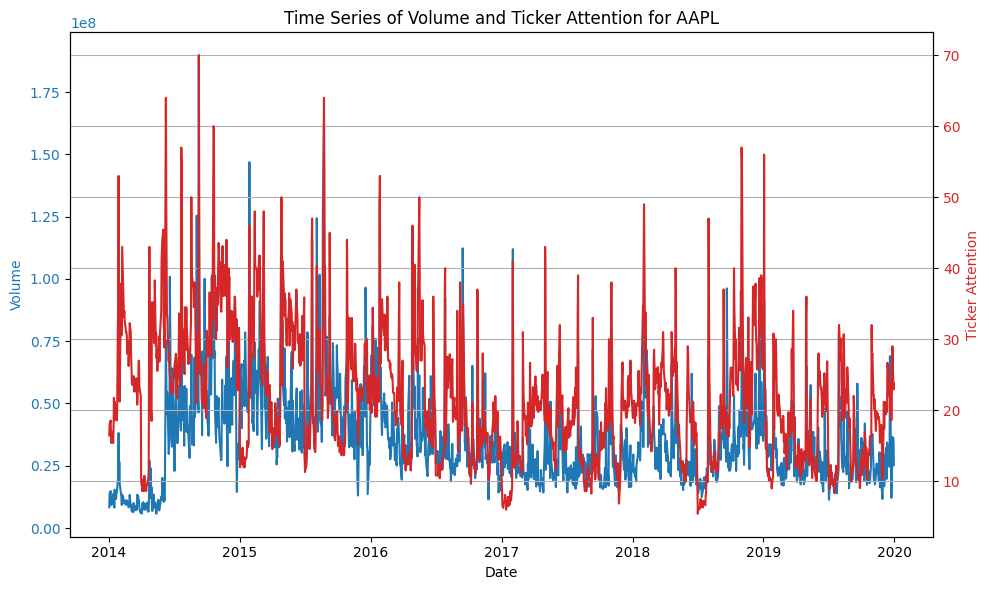

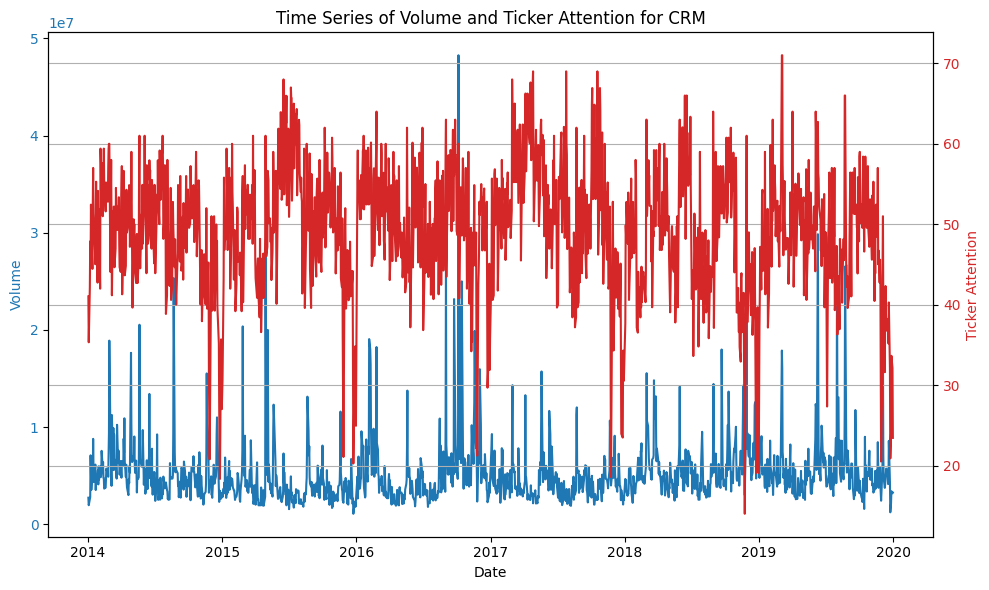

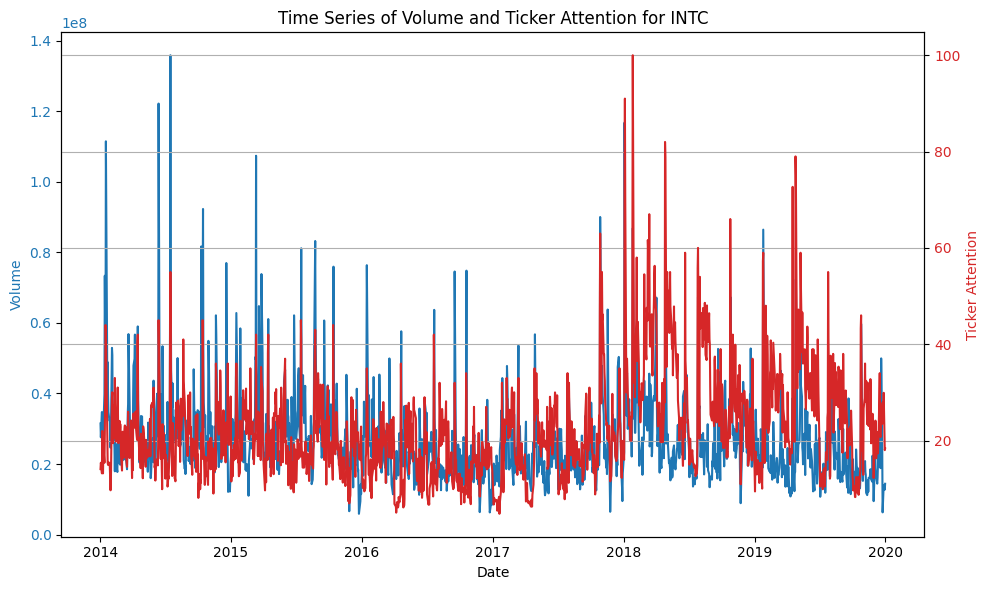

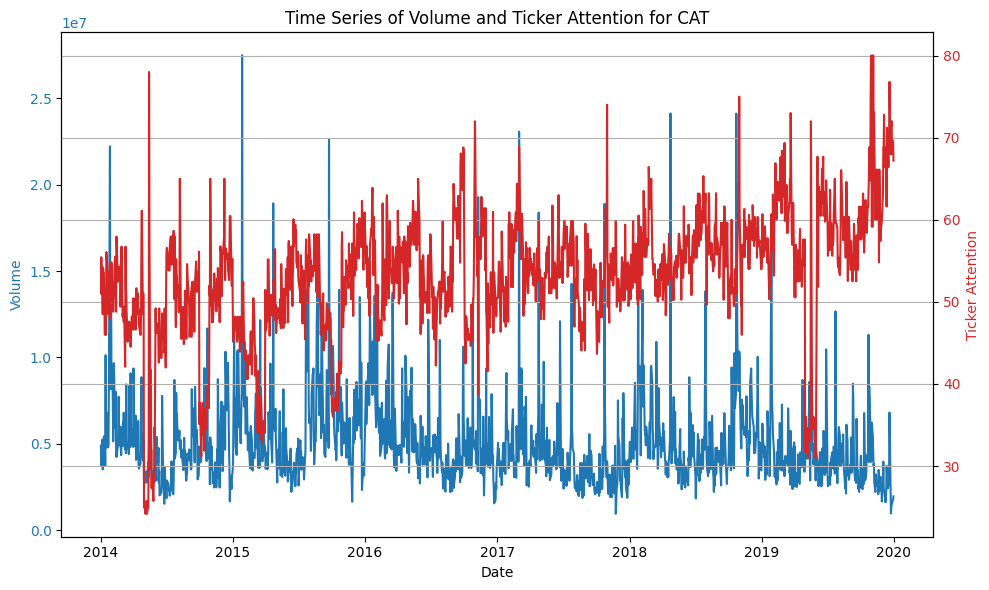

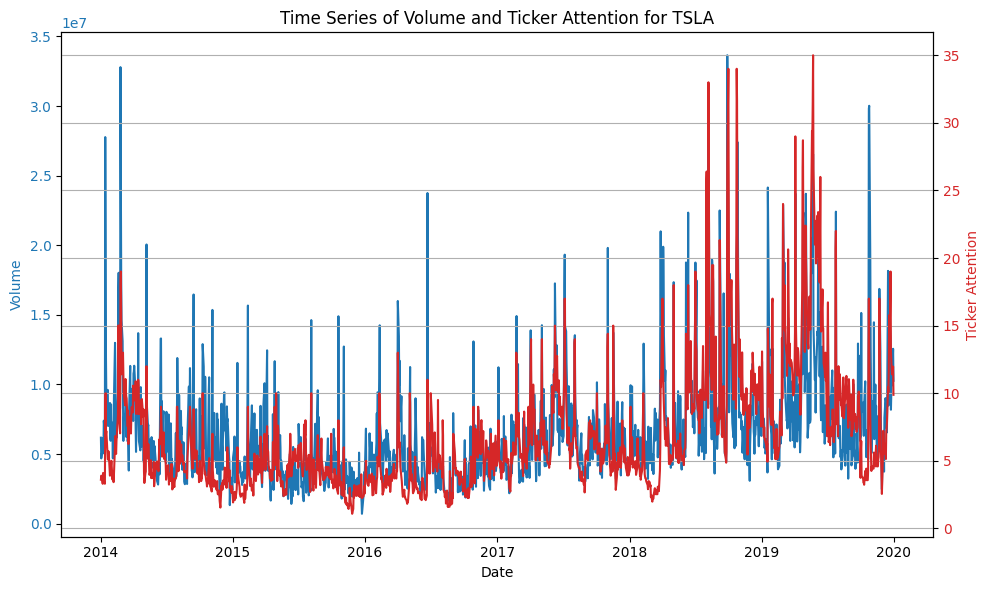

In [146]:
import matplotlib.pyplot as plt

# List of unique tickers
tickers = pre_covid_top_stocks['ticker'].unique()

# Plotting volume and attention for each stock
for ticker in tickers:
    stock_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Create subplots with shared x-axis
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot volume on primary y-axis
    color = 'tab:blue'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Volume', color=color)
    ax1.plot(stock_data.index, stock_data['volume'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    # Create secondary y-axis for ticker attention
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Ticker Attention', color=color)
    ax2.plot(stock_data.index, stock_data['ticker_attention'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f'Time Series of Volume and Ticker Attention for {ticker}')
    plt.grid(True)
    fig.tight_layout()
    plt.show()


<ipython-input-147-04c49feab215>:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean()
<ipython-input-147-04c49feab215>:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean()
<ipython-input-147-04c49feab215>:11: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean()
<ipy

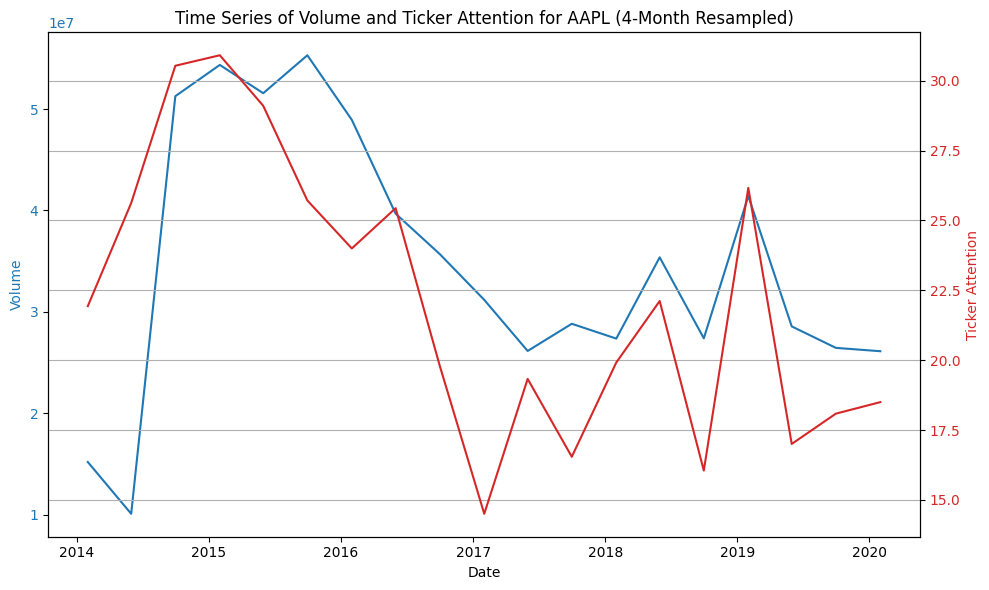

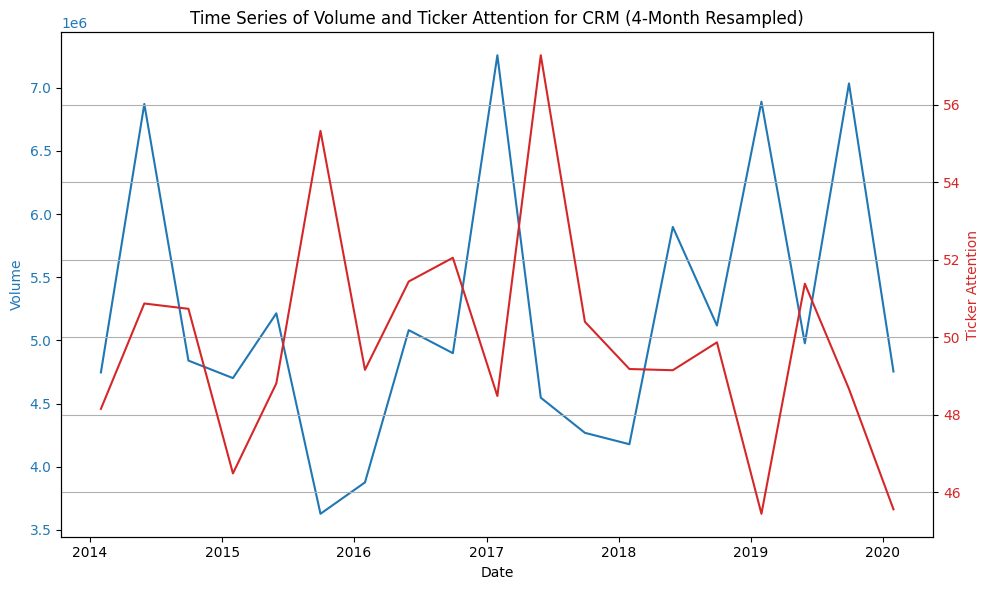

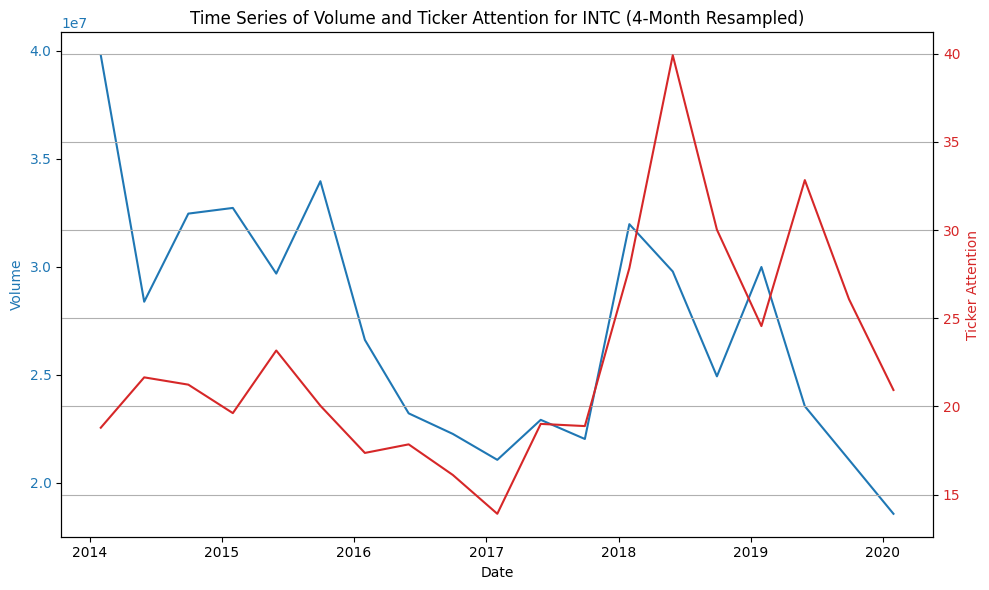

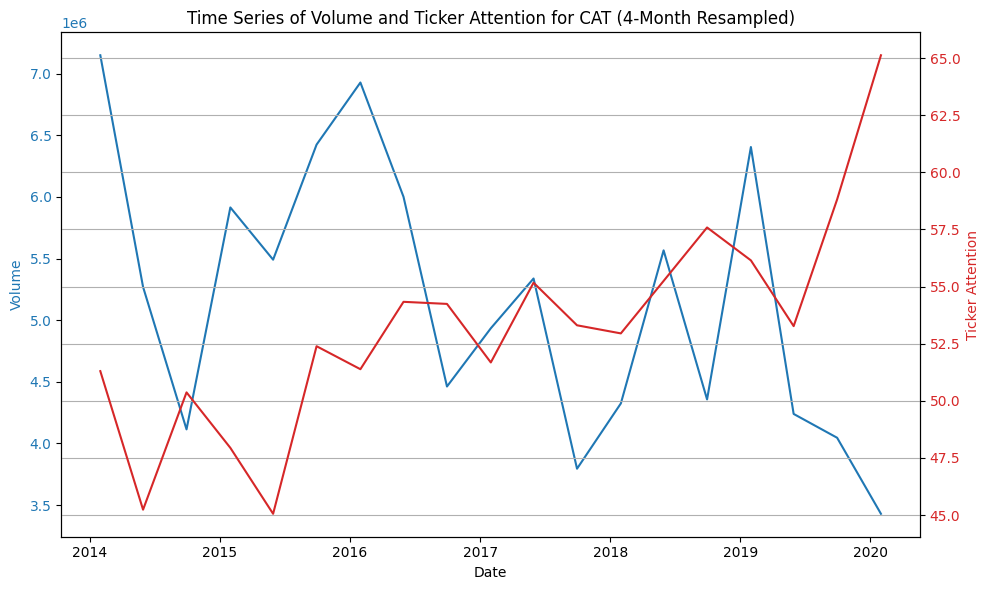

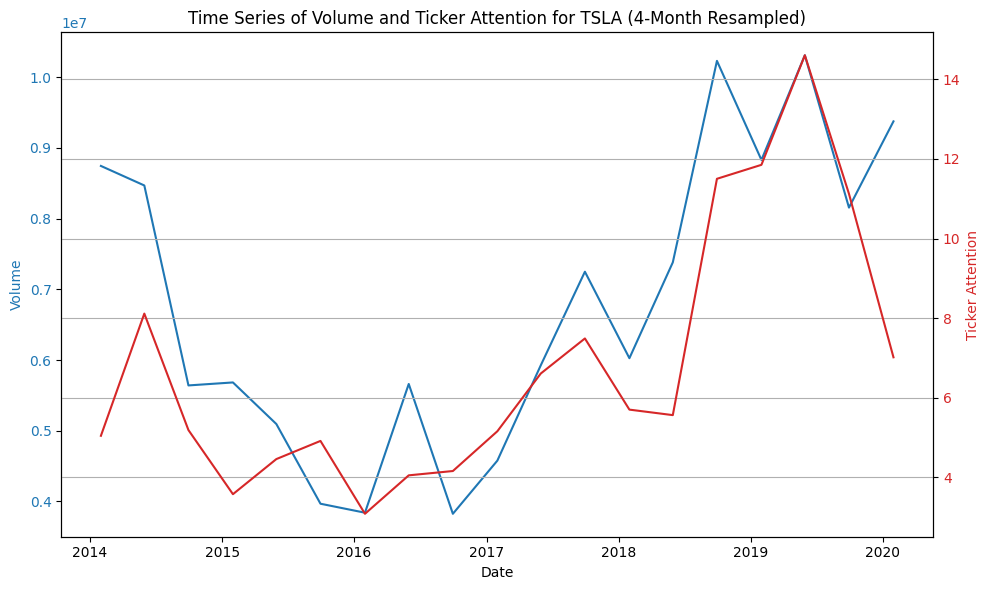

In [147]:
import matplotlib.pyplot as plt

# List of unique tickers
tickers = pre_covid_top_stocks['ticker'].unique()

# Plotting volume and attention for each stock
for ticker in tickers:
    stock_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Resample data to 4-month frequency
    stock_data_resampled = stock_data.resample('4M').mean()

    # Create subplots with shared x-axis
    fig, ax1 = plt.subplots(figsize=(10, 6))

    # Plot volume on primary y-axis
    color = 'tab:blue'
    ax1.set_xlabel('Date')
    ax1.set_ylabel('Volume', color=color)
    ax1.plot(stock_data_resampled.index, stock_data_resampled['volume'], color=color)
    ax1.tick_params(axis='y', labelcolor=color)

    # Create secondary y-axis for ticker attention
    ax2 = ax1.twinx()
    color = 'tab:red'
    ax2.set_ylabel('Ticker Attention', color=color)
    ax2.plot(stock_data_resampled.index, stock_data_resampled['ticker_attention'], color=color)
    ax2.tick_params(axis='y', labelcolor=color)

    plt.title(f'Time Series of Volume and Ticker Attention for {ticker} (4-Month Resampled)')
    plt.grid(True)
    fig.tight_layout()
    plt


<ipython-input-148-5b0a8a9de3ba>:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()


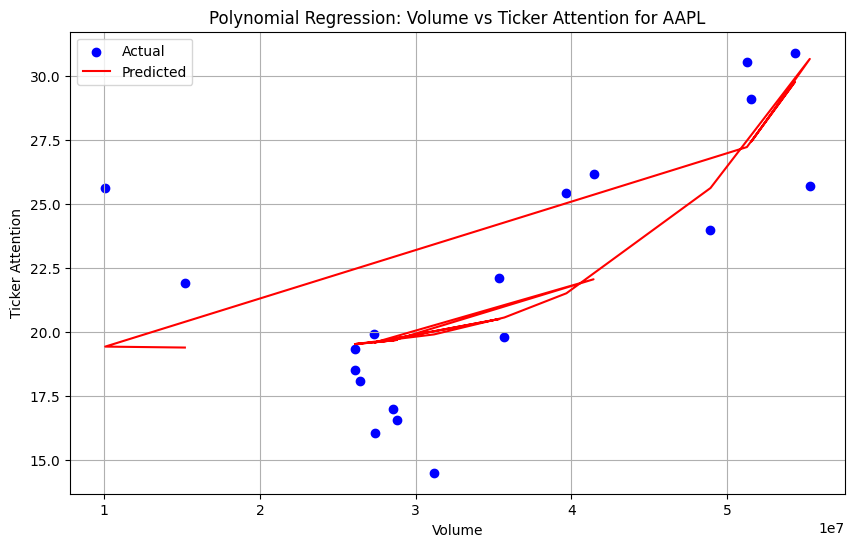

<ipython-input-148-5b0a8a9de3ba>:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()


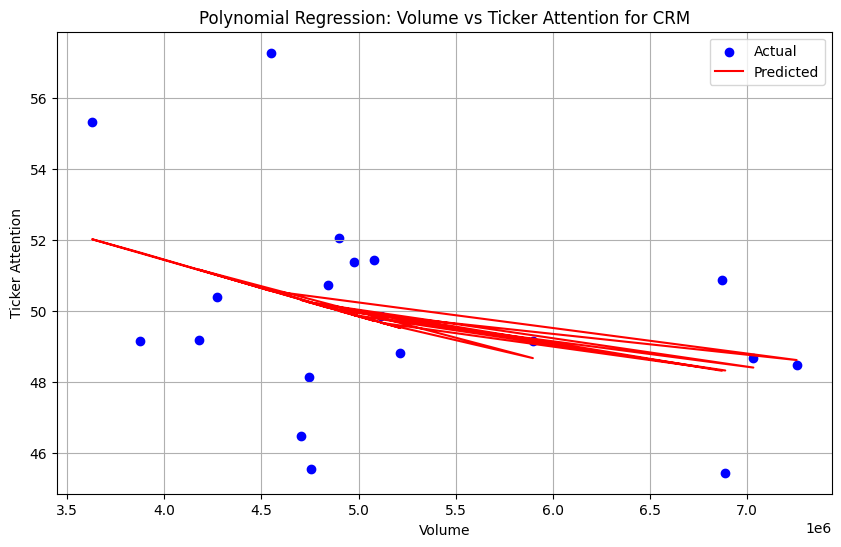

<ipython-input-148-5b0a8a9de3ba>:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()


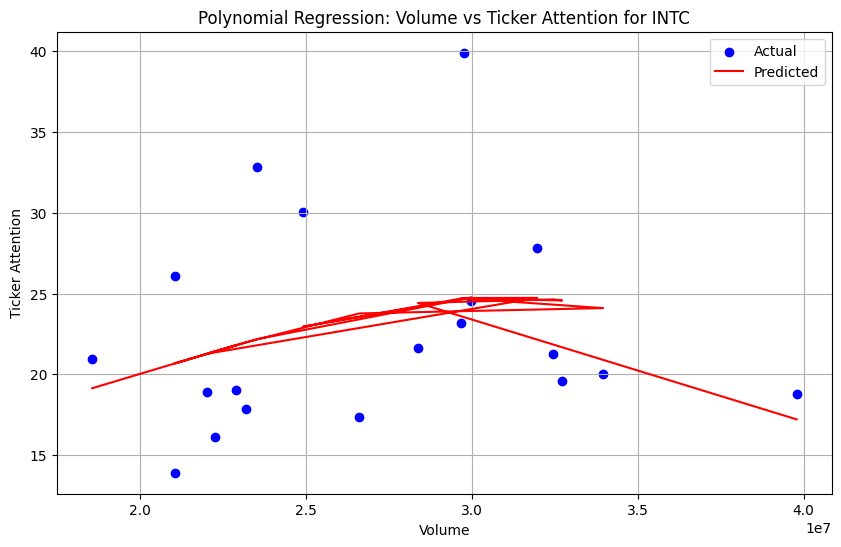

<ipython-input-148-5b0a8a9de3ba>:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()


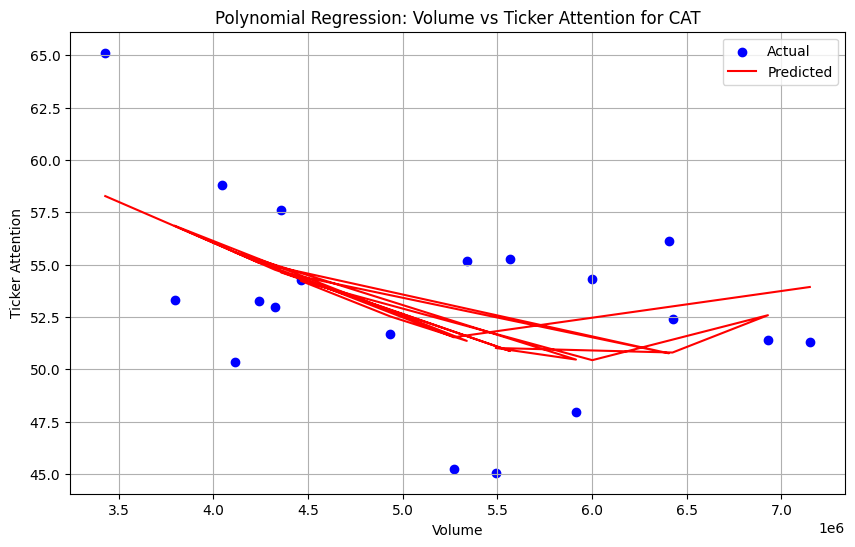

<ipython-input-148-5b0a8a9de3ba>:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()


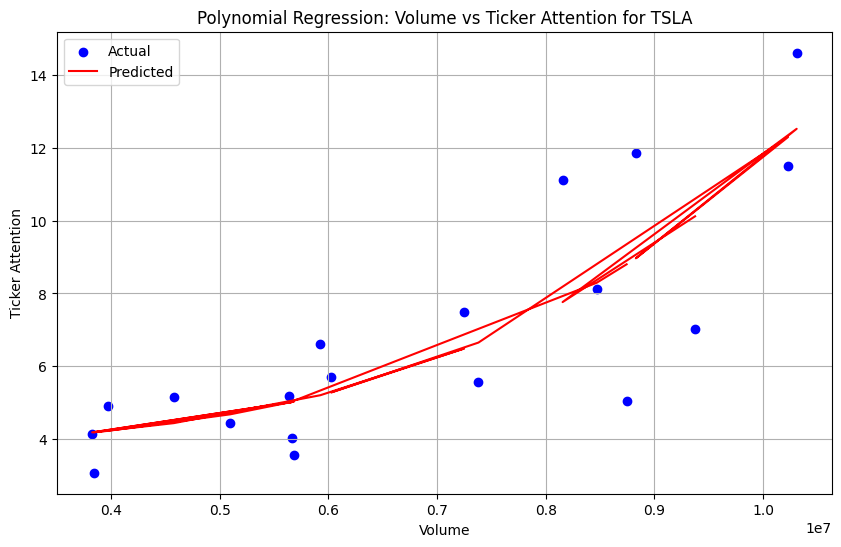

In [148]:
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Define degree of polynomial
degree = 4

# Plotting volume and attention for each stock
for ticker in tickers:
    stock_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Resample data to 4-month frequency
    stock_data_resampled = stock_data.resample('4M').mean().dropna()

    # Extracting volume and ticker attention
    volume = stock_data_resampled['volume'].values.reshape(-1, 1)
    ticker_attention = stock_data_resampled['ticker_attention'].values

    # Perform polynomial regression
    polynomial_features = PolynomialFeatures(degree=degree)
    volume_poly = polynomial_features.fit_transform(volume)

    model = LinearRegression()
    model.fit(volume_poly, ticker_attention)
    predicted_ticker_attention = model.predict(volume_poly)

    # Plot scatter plot and regression line
    plt.figure(figsize=(10, 6))
    plt.scatter(volume, ticker_attention, color='blue', label='Actual')
    plt.plot(volume, predicted_ticker_attention, color='red', label='Predicted')
    plt.title(f'Polynomial Regression: Volume vs Ticker Attention for {ticker}')
    plt.xlabel('Volume')
    plt.ylabel('Ticker Attention')
    plt.legend()
    plt.grid(True)
    plt.show()


In [149]:
import pandas as pd

# Create an empty DataFrame to store results
results_df = pd.DataFrame(columns=['Ticker', 'Degree', 'Intercept', 'Coefficients'])

# Define degree of polynomial
degree = 1

# Plotting volume and attention for each stock
for ticker in tickers:
    stock_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Resample data to 4-month frequency
    stock_data_resampled = stock_data.resample('4M').mean().dropna()

    # Extracting volume and ticker attention
    volume = stock_data_resampled['volume'].values.reshape(-1, 1)
    ticker_attention = stock_data_resampled['ticker_attention'].values

    # Perform polynomial regression
    polynomial_features = PolynomialFeatures(degree=degree)
    volume_poly = polynomial_features.fit_transform(volume)

    model = LinearRegression()
    model.fit(volume_poly, ticker_attention)

    # Get coefficients
    coefficients = model.coef_
    intercept = model.intercept_

    # Append results to DataFrame
    results_df = results_df.append({'Ticker': ticker,
                                    'Degree': degree,
                                    'Intercept': intercept,
                                    'Coefficients': coefficients}, ignore_index=True)

# Display results
print(results_df)


  Ticker Degree  Intercept                    Coefficients
0   AAPL      1  13.820576    [0.0, 2.401401631938108e-07]
1    CRM      1  54.998101   [0.0, -9.770487741246606e-07]
2   INTC      1  19.374450    [0.0, 1.198365608242526e-07]
3    CAT      1  62.168067  [0.0, -1.7277168983758962e-06]
4   TSLA      1  -1.440146   [0.0, 1.2132751861664831e-06]


<ipython-input-149-da1fee0bc38f>:14: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()
<ipython-input-149-da1fee0bc38f>:32: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Ticker': ticker,
<ipython-input-149-da1fee0bc38f>:14: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()
<ipython-input-149-da1fee0bc38f>:32: FutureWarning: The frame.append method is deprecated and wi

In [150]:
# Calculate the correlation coefficient between ticker attention and trading volume for each stock
correlation_results = {}

for ticker in tickers:
    stock_data = pre_covid_top_stocks[pre_covid_top_stocks['ticker'] == ticker]

    # Resample data to 4-month frequency
    stock_data_resampled = stock_data.resample('4M').mean().dropna()

    # Calculate correlation coefficient
    correlation_coefficient = stock_data_resampled['ticker_attention'].corr(stock_data_resampled['volume'])

    # Store results
    correlation_results[ticker] = correlation_coefficient

# Convert results to DataFrame
correlation_df = pd.DataFrame(list(correlation_results.items()), columns=['Ticker', 'Correlation_Coefficient'])

# Display results
print(correlation_df)


  Ticker  Correlation_Coefficient
0   AAPL                 0.622107
1    CRM                -0.361990
2   INTC                 0.104941
3    CAT                -0.409528
4   TSLA                 0.802181


<ipython-input-150-cd4f28bffd1f>:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()
<ipython-input-150-cd4f28bffd1f>:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4M').mean().dropna()
<ipython-input-150-cd4f28bffd1f>:8: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  stock_data_resampled = stock_data.resample('4

In [151]:
#Preprocessing

In [152]:
pre_covid_top_stocks.head()

,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,
2014-01-02,AAPL,553.13000,8338094.0,-0.014064,557.03003,552.02100,555.67999,554.525515,4.936392e+08,-1.4064,16.43,4.4,1.892723,False,0.000198
2014-01-03,AAPL,540.97998,13992006.0,-0.021966,553.70001,540.42999,552.85999,547.065000,4.827960e+08,-2.1966,18.02,4.2,1.858734,False,0.000483
2014-01-06,AAPL,543.92999,14820614.0,0.005453,546.79999,533.59998,537.45001,540.199985,4.854287e+08,0.5453,18.55,4.5,1.897441,False,0.000030
2014-01-07,AAPL,540.03748,11381939.0,-0.007156,545.96002,537.92499,544.32001,541.942505,4.819548e+08,-0.7156,15.90,4.7,1.816480,False,0.000051
2014-01-08,AAPL,543.46002,9199689.0,0.006338,545.56000,538.69000,538.81000,542.125000,4.850093e+08,0.6338,15.37,5.0,1.750521,False,0.000040


In [153]:
pre_covid_top_stocks.describe()

,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,volatility,squared_returns
count,7550.000000,7.550000e+03,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000,7.550000e+03,7550.000000,7550.000000,7550.000000,7550.000000,7550.000000
mean,136.598275,1.588654e+07,0.000879,138.222376,134.838513,136.558319,136.530445,2.199275e+08,0.087856,31.022356,10.304654,1.809041,0.000385
std,97.149623,1.673036e+07,0.019608,98.453634,95.714935,97.087326,97.075293,2.788444e+08,1.960756,19.631252,10.677028,0.706004,0.001203
min,23.520000,7.102770e+05,-0.139015,23.760000,23.500000,23.600000,23.630000,1.715150e+07,-13.901500,1.080000,0.000000,0.839583,0.000000
25%,66.920000,4.351750e+06,-0.007887,67.842500,66.112500,66.880000,66.910625,4.917065e+07,-0.788675,13.200000,2.465000,1.305258,0.000017
50%,111.035000,7.617812e+06,0.000735,112.125000,109.695000,110.845000,110.785000,8.067736e+07,0.073500,27.300000,7.560000,1.634551,0.000083
75%,185.147500,2.363867e+07,0.010223,187.260000,182.484992,184.802507,185.271209,2.148731e+08,1.022325,50.400000,15.300000,2.133503,0.000318
max,647.349980,1.898486e+08,0.176692,651.260010,644.469970,649.900020,647.864990,1.288147e+09,17.669200,100.000000,100.000000,6.893301,0.031220


In [154]:
pre_covid_top_stocks.to_csv('pre_covid_data.csv')
post_covid_top_stocks.to_csv('post_covid_data.csv')


In [155]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

def prepare_data(df):
    # Separate features and target variable
    X = df.drop(columns=['pct_return'])  # Features
    y = df['pct_return']  # Target variable

    # Define categorical and numerical features
    categorical_features = ['ticker']
    numeric_features = ['price', 'volume', 'return', 'high', 'low', 'open', 'avg_price', 'mkt_cap',
                        'ticker_attention', 'name_price_attention', 'volatility', 'High_Volatility']

    # Define preprocessing steps for categorical features
    categorical_transformer = OneHotEncoder(handle_unknown='ignore')

    # Define preprocessing steps for numerical features
    numeric_transformer = StandardScaler()

    # Combine preprocessing steps
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numeric_transformer, numeric_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    # Create a pipeline with preprocessing steps
    pipeline = Pipeline(steps=[('preprocessor', preprocessor)])

    # Fit and transform the data
    X_preprocessed = pipeline.fit_transform(X)

    return X_preprocessed, y

# Example usage:
X_preprocessed, y = prepare_data(pre_covid_top_stocks)


In [156]:
y

date
2014-01-02   -1.4064
2014-01-03   -2.1966
2014-01-06    0.5453
2014-01-07   -0.7156
2014-01-08    0.6338
               ...  
2019-12-24    1.4384
2019-12-26    1.3380
2019-12-27   -0.1299
2019-12-30   -3.6433
2019-12-31    0.8753
Name: pct_return, Length: 7550, dtype: float64

In [157]:
#XGBOOST

In [158]:
# Sentiment Analysis

In [159]:
df0=pd.read_csv('raw_analyst_ratings.csv')

In [160]:
df0.head()

,Unnamed: 0,headline,url,publisher,date,stock
0,0,Stocks That Hit 52-Week Highs On Friday,https://www.benzinga.com/news/20/06/16190091/s...,Benzinga Insights,2020-06-05 10:30:54-04:00,A
1,1,Stocks That Hit 52-Week Highs On Wednesday,https://www.benzinga.com/news/20/06/16170189/s...,Benzinga Insights,2020-06-03 10:45:20-04:00,A
2,2,71 Biggest Movers From Friday,https://www.benzinga.com/news/20/05/16103463/7...,Lisa Levin,2020-05-26 04:30:07-04:00,A
3,3,46 Stocks Moving In Friday's Mid-Day Session,https://www.benzinga.com/news/20/05/16095921/4...,Lisa Levin,2020-05-22 12:45:06-04:00,A
4,4,B of A Securities Maintains Neutral on Agilent...,https://www.benzinga.com/news/20/05/16095304/b...,Vick Meyer,2020-05-22 11:38:59-04:00,A


In [161]:
import pandas as pd

# Assuming the date column is in string format
df0['date'] = pd.to_datetime(df0['date'], errors='coerce', utc=True)

# Convert date to the desired format
df0['date'] = df0['date'].dt.strftime('%d.%m.%Y')

# Display the DataFrame with the updated date format
print(df0.head())


   Unnamed: 0                                           headline  \
0           0            Stocks That Hit 52-Week Highs On Friday   
1           1         Stocks That Hit 52-Week Highs On Wednesday   
2           2                      71 Biggest Movers From Friday   
3           3       46 Stocks Moving In Friday's Mid-Day Session   
4           4  B of A Securities Maintains Neutral on Agilent...   

                                                 url          publisher  \
0  https://www.benzinga.com/news/20/06/16190091/s...  Benzinga Insights   
1  https://www.benzinga.com/news/20/06/16170189/s...  Benzinga Insights   
2  https://www.benzinga.com/news/20/05/16103463/7...         Lisa Levin   
3  https://www.benzinga.com/news/20/05/16095921/4...         Lisa Levin   
4  https://www.benzinga.com/news/20/05/16095304/b...         Vick Meyer   

         date stock  
0  05.06.2020     A  
1  03.06.2020     A  
2  26.05.2020     A  
3  22.05.2020     A  
4  22.05.2020     A  


In [162]:
# Get all unique values in the 'stock' column
unique_stocks = df0['stock'].unique()

# Print the unique values
print(unique_stocks)


['A' 'AA' 'AAC' ... 'ZU' 'ZUMZ' 'ZX']


In [163]:
df1=pd.read_csv('raw_partner_headlines.csv')

In [164]:
df2=pd.read_csv('analyst_ratings_processed.csv')

In [165]:
df2.head()

,Unnamed: 0,title,date,stock
0,0.0,Stocks That Hit 52-Week Highs On Friday,2020-06-05 10:30:00-04:00,A
1,1.0,Stocks That Hit 52-Week Highs On Wednesday,2020-06-03 10:45:00-04:00,A
2,2.0,71 Biggest Movers From Friday,2020-05-26 04:30:00-04:00,A
3,3.0,46 Stocks Moving In Friday's Mid-Day Session,2020-05-22 12:45:00-04:00,A
4,4.0,B of A Securities Maintains Neutral on Agilent...,2020-05-22 11:38:00-04:00,A


In [166]:
# Rename the column 'Title' to 'Headline' in df2
df2 = df2.rename(columns={'title': 'headline'})

# Display the first few rows of df2 after renaming the column
df2.head()


,Unnamed: 0,headline,date,stock
0,0.0,Stocks That Hit 52-Week Highs On Friday,2020-06-05 10:30:00-04:00,A
1,1.0,Stocks That Hit 52-Week Highs On Wednesday,2020-06-03 10:45:00-04:00,A
2,2.0,71 Biggest Movers From Friday,2020-05-26 04:30:00-04:00,A
3,3.0,46 Stocks Moving In Friday's Mid-Day Session,2020-05-22 12:45:00-04:00,A
4,4.0,B of A Securities Maintains Neutral on Agilent...,2020-05-22 11:38:00-04:00,A


In [167]:
import pandas as pd

# Assuming the date column is in string format
df2['date'] = pd.to_datetime(df2['date'], errors='coerce', utc=True)

# Convert date to the desired format
df2['date'] = df2['date'].dt.strftime('%d.%m.%Y')

# Display the DataFrame with the updated date format
print(df2.head())


   Unnamed: 0                                           headline        date  \
0         0.0            Stocks That Hit 52-Week Highs On Friday  05.06.2020   
1         1.0         Stocks That Hit 52-Week Highs On Wednesday  03.06.2020   
2         2.0                      71 Biggest Movers From Friday  26.05.2020   
3         3.0       46 Stocks Moving In Friday's Mid-Day Session  22.05.2020   
4         4.0  B of A Securities Maintains Neutral on Agilent...  22.05.2020   

  stock  
0     A  
1     A  
2     A  
3     A  
4     A  


In [168]:
df1

,Unnamed: 0,headline,url,publisher,date,stock
0,2,Agilent Technologies Announces Pricing of $5……...,http://www.gurufocus.com/news/1153187/agilent-...,GuruFocus,2020-06-01 00:00:00,A
1,3,Agilent (A) Gears Up for Q2 Earnings: What's i...,http://www.zacks.com/stock/news/931205/agilent...,Zacks,2020-05-18 00:00:00,A
2,4,J.P. Morgan Asset Management Announces Liquida...,http://www.gurufocus.com/news/1138923/jp-morga...,GuruFocus,2020-05-15 00:00:00,A
3,5,"Pershing Square Capital Management, L.P. Buys ...",http://www.gurufocus.com/news/1138704/pershing...,GuruFocus,2020-05-15 00:00:00,A
4,6,Agilent Awards Trilogy Sciences with a Golden ...,http://www.gurufocus.com/news/1134012/agilent-...,GuruFocus,2020-05-12 00:00:00,A
...,...,...,...,...,...,...
1647250,1651103,"How To Get EM Right: Asia, Not BRATS",https://seekingalpha.com/article/4203441-get-e...,Seeking Alpha,2018-08-31 00:00:00,TUR
1647251,1651104,Top ETF Stories of August,http://www.zacks.com/stock/news/321036/top-etf...,Zacks,2018-08-31 00:00:00,TUR
1647252,1651105,Turkey: Short-Lived Lira Rally,https://seekingalpha.com/article/4203349-turke...,Seeking Alpha,2018-08-31 00:00:00,TUR
1647253,1651106,Market Volatility Bulletin: Are EM And U.S. Ra...,https://seekingalpha.com/article/4203253-marke...,Seeking Alpha,2018-08-30 00:00:00,TUR


In [169]:
import pandas as pd
from nltk.sentiment import SentimentIntensityAnalyzer



df1.head()

,Unnamed: 0,headline,url,publisher,date,stock
0,2,Agilent Technologies Announces Pricing of $5……...,http://www.gurufocus.com/news/1153187/agilent-...,GuruFocus,2020-06-01 00:00:00,A
1,3,Agilent (A) Gears Up for Q2 Earnings: What's i...,http://www.zacks.com/stock/news/931205/agilent...,Zacks,2020-05-18 00:00:00,A
2,4,J.P. Morgan Asset Management Announces Liquida...,http://www.gurufocus.com/news/1138923/jp-morga...,GuruFocus,2020-05-15 00:00:00,A
3,5,"Pershing Square Capital Management, L.P. Buys ...",http://www.gurufocus.com/news/1138704/pershing...,GuruFocus,2020-05-15 00:00:00,A
4,6,Agilent Awards Trilogy Sciences with a Golden ...,http://www.gurufocus.com/news/1134012/agilent-...,GuruFocus,2020-05-12 00:00:00,A


In [170]:
import pandas as pd

# Assuming the date column is in string format
df1['date'] = pd.to_datetime(df1['date'], errors='coerce')

# Convert date to the desired format
df1['date'] = df1['date'].dt.strftime('%d.%m.%Y')

# Display the DataFrame with the updated date format
print(df1.head())


   Unnamed: 0                                           headline  \
0           2  Agilent Technologies Announces Pricing of $5……...   
1           3  Agilent (A) Gears Up for Q2 Earnings: What's i...   
2           4  J.P. Morgan Asset Management Announces Liquida...   
3           5  Pershing Square Capital Management, L.P. Buys ...   
4           6  Agilent Awards Trilogy Sciences with a Golden ...   

                                                 url  publisher        date  \
0  http://www.gurufocus.com/news/1153187/agilent-...  GuruFocus  01.06.2020   
1  http://www.zacks.com/stock/news/931205/agilent...      Zacks  18.05.2020   
2  http://www.gurufocus.com/news/1138923/jp-morga...  GuruFocus  15.05.2020   
3  http://www.gurufocus.com/news/1138704/pershing...  GuruFocus  15.05.2020   
4  http://www.gurufocus.com/news/1134012/agilent-...  GuruFocus  12.05.2020   

  stock  
0     A  
1     A  
2     A  
3     A  
4     A  


In [171]:
df1.shape

(1647255, 6)

In [172]:
import pandas as pd

# Assuming df, df1, and df2 are already loaded DataFrames

# Concatenate the DataFrames vertically
appended_df = pd.concat([df0, df1, df2], ignore_index=True)

# Display the first few rows of the concatenated DataFrame
print(appended_df.head())


   Unnamed: 0                                           headline  \
0         0.0            Stocks That Hit 52-Week Highs On Friday   
1         1.0         Stocks That Hit 52-Week Highs On Wednesday   
2         2.0                      71 Biggest Movers From Friday   
3         3.0       46 Stocks Moving In Friday's Mid-Day Session   
4         4.0  B of A Securities Maintains Neutral on Agilent...   

                                                 url          publisher  \
0  https://www.benzinga.com/news/20/06/16190091/s...  Benzinga Insights   
1  https://www.benzinga.com/news/20/06/16170189/s...  Benzinga Insights   
2  https://www.benzinga.com/news/20/05/16103463/7...         Lisa Levin   
3  https://www.benzinga.com/news/20/05/16095921/4...         Lisa Levin   
4  https://www.benzinga.com/news/20/05/16095304/b...         Vick Meyer   

         date stock  
0  05.06.2020     A  
1  03.06.2020     A  
2  26.05.2020     A  
3  22.05.2020     A  
4  22.05.2020     A  


In [173]:
appended_df.shape

(4455052, 6)

In [174]:
appended_df.head()

,Unnamed: 0,headline,url,publisher,date,stock
0,0.0,Stocks That Hit 52-Week Highs On Friday,https://www.benzinga.com/news/20/06/16190091/s...,Benzinga Insights,05.06.2020,A
1,1.0,Stocks That Hit 52-Week Highs On Wednesday,https://www.benzinga.com/news/20/06/16170189/s...,Benzinga Insights,03.06.2020,A
2,2.0,71 Biggest Movers From Friday,https://www.benzinga.com/news/20/05/16103463/7...,Lisa Levin,26.05.2020,A
3,3.0,46 Stocks Moving In Friday's Mid-Day Session,https://www.benzinga.com/news/20/05/16095921/4...,Lisa Levin,22.05.2020,A
4,4.0,B of A Securities Maintains Neutral on Agilent...,https://www.benzinga.com/news/20/05/16095304/b...,Vick Meyer,22.05.2020,A


In [175]:
# List of tickers to filter
tickers_to_filter = ['AAPL', 'CAT', 'INTC', 'CRM']

# Filter the data for the specified tickers
filtered_df = appended_df[appended_df['stock'].isin(tickers_to_filter)]

# Display the first few rows of the filtered DataFrame
print(filtered_df.head())


      Unnamed: 0                                           headline  \
6680      7120.0  Tech Stocks And FAANGS Strong Again To Start D...   
6681      7121.0      10 Biggest Price Target Changes For Wednesday   
6682      7122.0  Benzinga Pro's Top 5 Stocks To Watch For Wed.,...   
6683      7123.0  Deutsche Bank Maintains Buy on Apple, Raises P...   
6684      7124.0  Apple To Let Users Trade In Their Mac Computer...   

                                                    url          publisher  \
6680  https://www.benzinga.com/government/20/06/1622...         JJ Kinahan   
6681  https://www.benzinga.com/analyst-ratings/price...         Lisa Levin   
6682  https://www.benzinga.com/short-sellers/20/06/1...  Benzinga Newsdesk   
6683  https://www.benzinga.com/news/20/06/16219873/d...  Benzinga Newsdesk   
6684  https://www.benzinga.com/news/20/06/16218697/a...      Neer Varshney   

            date stock  
6680  10.06.2020  AAPL  
6681  10.06.2020  AAPL  
6682  10.06.2020  AAPL  
6683

In [176]:
filtered_df

,Unnamed: 0,headline,url,publisher,date,stock
6680,7120.0,Tech Stocks And FAANGS Strong Again To Start D...,https://www.benzinga.com/government/20/06/1622...,JJ Kinahan,10.06.2020,AAPL
6681,7121.0,10 Biggest Price Target Changes For Wednesday,https://www.benzinga.com/analyst-ratings/price...,Lisa Levin,10.06.2020,AAPL
6682,7122.0,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",https://www.benzinga.com/short-sellers/20/06/1...,Benzinga Newsdesk,10.06.2020,AAPL
6683,7123.0,"Deutsche Bank Maintains Buy on Apple, Raises P...",https://www.benzinga.com/news/20/06/16219873/d...,Benzinga Newsdesk,10.06.2020,AAPL
6684,7124.0,Apple To Let Users Trade In Their Mac Computer...,https://www.benzinga.com/news/20/06/16218697/a...,Neer Varshney,10.06.2020,AAPL
...,...,...,...,...,...,...
3714345,670888.0,Hearing New Jersey Governor Says Outdoor Dinin...,NaN,NaN,01.06.2020,INTC
3714346,670889.0,Semiconductor Industry to Lobby for Billions t...,NaN,NaN,31.05.2020,INTC
3714347,670890.0,"Cramer Shares His Thoughts On Teva, Oxford Ind...",NaN,NaN,29.05.2020,INTC
3714348,670891.0,Chip Stocks Move Higher Following Strong Guida...,NaN,NaN,27.05.2020,INTC


In [177]:

import nltk
nltk.download('vader_lexicon')


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [178]:
# Initialize the SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

# Function to get sentiment score
def get_sentiment_score(text):
    return sia.polarity_scores(text)['compound']

# Apply sentiment analysis to each headline and create a new column 'Sentiment'
filtered_df['Sentiment'] = filtered_df['headline'].apply(get_sentiment_score)

# Display the DataFrame with the added 'Sentiment' column
print(filtered_df[['headline', 'Sentiment']])

                                                  headline  Sentiment
6680     Tech Stocks And FAANGS Strong Again To Start D...     0.5574
6681         10 Biggest Price Target Changes For Wednesday     0.0000
6682     Benzinga Pro's Top 5 Stocks To Watch For Wed.,...     0.2023
6683     Deutsche Bank Maintains Buy on Apple, Raises P...     0.0000
6684     Apple To Let Users Trade In Their Mac Computer...     0.3818
...                                                    ...        ...
3714345  Hearing New Jersey Governor Says Outdoor Dinin...     0.0000
3714346  Semiconductor Industry to Lobby for Billions t...     0.4215
3714347  Cramer Shares His Thoughts On Teva, Oxford Ind...     0.2960
3714348  Chip Stocks Move Higher Following Strong Guida...     0.6705
3714349  Linux Founder Switches Allegiance To AMD After...     0.0000

[11019 rows x 2 columns]


<ipython-input-178-09456aea5021>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Sentiment'] = filtered_df['headline'].apply(get_sentiment_score)


In [179]:
filtered_df

,Unnamed: 0,headline,url,publisher,date,stock,Sentiment
6680,7120.0,Tech Stocks And FAANGS Strong Again To Start D...,https://www.benzinga.com/government/20/06/1622...,JJ Kinahan,10.06.2020,AAPL,0.5574
6681,7121.0,10 Biggest Price Target Changes For Wednesday,https://www.benzinga.com/analyst-ratings/price...,Lisa Levin,10.06.2020,AAPL,0.0000
6682,7122.0,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",https://www.benzinga.com/short-sellers/20/06/1...,Benzinga Newsdesk,10.06.2020,AAPL,0.2023
6683,7123.0,"Deutsche Bank Maintains Buy on Apple, Raises P...",https://www.benzinga.com/news/20/06/16219873/d...,Benzinga Newsdesk,10.06.2020,AAPL,0.0000
6684,7124.0,Apple To Let Users Trade In Their Mac Computer...,https://www.benzinga.com/news/20/06/16218697/a...,Neer Varshney,10.06.2020,AAPL,0.3818
...,...,...,...,...,...,...,...
3714345,670888.0,Hearing New Jersey Governor Says Outdoor Dinin...,NaN,NaN,01.06.2020,INTC,0.0000
3714346,670889.0,Semiconductor Industry to Lobby for Billions t...,NaN,NaN,31.05.2020,INTC,0.4215
3714347,670890.0,"Cramer Shares His Thoughts On Teva, Oxford Ind...",NaN,NaN,29.05.2020,INTC,0.2960
3714348,670891.0,Chip Stocks Move Higher Following Strong Guida...,NaN,NaN,27.05.2020,INTC,0.6705


In [180]:
def vader_sentiment_classification(df):
    # Initialize the VADER sentiment analyzer
    nltk.download('vader_lexicon')
    analyzer = SentimentIntensityAnalyzer()

    # Add new column for sentiment category based on compound scores
    df['Sentiment_2'] = df['Sentiment'].apply(lambda x: 'positive' if x > 0 else ('negative' if x < 0 else 'neutral'))

    return df

# Call the function to classify sentiment based on compound scores
filtered_df = vader_sentiment_classification(filtered_df)

# Display the DataFrame with the added 'Sentiment_2' column
print(filtered_df[['headline', 'Sentiment', 'Sentiment_2']])


                                                  headline  Sentiment  \
6680     Tech Stocks And FAANGS Strong Again To Start D...     0.5574   
6681         10 Biggest Price Target Changes For Wednesday     0.0000   
6682     Benzinga Pro's Top 5 Stocks To Watch For Wed.,...     0.2023   
6683     Deutsche Bank Maintains Buy on Apple, Raises P...     0.0000   
6684     Apple To Let Users Trade In Their Mac Computer...     0.3818   
...                                                    ...        ...   
3714345  Hearing New Jersey Governor Says Outdoor Dinin...     0.0000   
3714346  Semiconductor Industry to Lobby for Billions t...     0.4215   
3714347  Cramer Shares His Thoughts On Teva, Oxford Ind...     0.2960   
3714348  Chip Stocks Move Higher Following Strong Guida...     0.6705   
3714349  Linux Founder Switches Allegiance To AMD After...     0.0000   

        Sentiment_2  
6680       positive  
6681        neutral  
6682       positive  
6683        neutral  
6684       po

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
<ipython-input-180-c72711285839>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Sentiment_2'] = df['Sentiment'].apply(lambda x: 'positive' if x > 0 else ('negative' if x < 0 else 'neutral'))


In [181]:
filtered_df.head()

,Unnamed: 0,headline,url,publisher,date,stock,Sentiment,Sentiment_2
6680,7120.0,Tech Stocks And FAANGS Strong Again To Start D...,https://www.benzinga.com/government/20/06/1622...,JJ Kinahan,10.06.2020,AAPL,0.5574,positive
6681,7121.0,10 Biggest Price Target Changes For Wednesday,https://www.benzinga.com/analyst-ratings/price...,Lisa Levin,10.06.2020,AAPL,0.0000,neutral
6682,7122.0,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",https://www.benzinga.com/short-sellers/20/06/1...,Benzinga Newsdesk,10.06.2020,AAPL,0.2023,positive
6683,7123.0,"Deutsche Bank Maintains Buy on Apple, Raises P...",https://www.benzinga.com/news/20/06/16219873/d...,Benzinga Newsdesk,10.06.2020,AAPL,0.0000,neutral
6684,7124.0,Apple To Let Users Trade In Their Mac Computer...,https://www.benzinga.com/news/20/06/16218697/a...,Neer Varshney,10.06.2020,AAPL,0.3818,positive


In [182]:
filtered_df['Sentiment_2'].value_counts()

neutral     5458
positive    3813
negative    1748
Name: Sentiment_2, dtype: int64

In [183]:
filtered_df.head()

,Unnamed: 0,headline,url,publisher,date,stock,Sentiment,Sentiment_2
6680,7120.0,Tech Stocks And FAANGS Strong Again To Start D...,https://www.benzinga.com/government/20/06/1622...,JJ Kinahan,10.06.2020,AAPL,0.5574,positive
6681,7121.0,10 Biggest Price Target Changes For Wednesday,https://www.benzinga.com/analyst-ratings/price...,Lisa Levin,10.06.2020,AAPL,0.0000,neutral
6682,7122.0,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",https://www.benzinga.com/short-sellers/20/06/1...,Benzinga Newsdesk,10.06.2020,AAPL,0.2023,positive
6683,7123.0,"Deutsche Bank Maintains Buy on Apple, Raises P...",https://www.benzinga.com/news/20/06/16219873/d...,Benzinga Newsdesk,10.06.2020,AAPL,0.0000,neutral
6684,7124.0,Apple To Let Users Trade In Their Mac Computer...,https://www.benzinga.com/news/20/06/16218697/a...,Neer Varshney,10.06.2020,AAPL,0.3818,positive


In [184]:
# Convert 'date' column to datetime type if it's not already
filtered_df['date'] = pd.to_datetime(filtered_df['date'])

# Find the highest and lowest dates
highest_date = filtered_df['date'].max()
lowest_date = filtered_df['date'].min()

# Display the highest and lowest dates
print("Highest Date:", highest_date)
print("Lowest Date:", lowest_date)


Highest Date: 2020-12-05 00:00:00
Lowest Date: 2011-01-12 00:00:00


<ipython-input-184-adaae207f3ac>:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  filtered_df['date'] = pd.to_datetime(filtered_df['date'])
<ipython-input-184-adaae207f3ac>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['date'] = pd.to_datetime(filtered_df['date'])


In [185]:
# Check for null values in the DataFrame
null_values = filtered_df.isnull().sum()

# Display the null values count
print("Null Values Count:")
print(null_values)


Null Values Count:
Unnamed: 0        0
headline          0
url            4254
publisher      4254
date              0
stock             0
Sentiment         0
Sentiment_2       0
dtype: int64


In [186]:
# Drop the columns 'url' and 'publisher'
filtered_df = filtered_df.drop(columns=['url', 'publisher'])

# Display the DataFrame after dropping the columns
filtered_df.head()


,Unnamed: 0,headline,date,stock,Sentiment,Sentiment_2
6680,7120.0,Tech Stocks And FAANGS Strong Again To Start D...,2020-10-06,AAPL,0.5574,positive
6681,7121.0,10 Biggest Price Target Changes For Wednesday,2020-10-06,AAPL,0.0000,neutral
6682,7122.0,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",2020-10-06,AAPL,0.2023,positive
6683,7123.0,"Deutsche Bank Maintains Buy on Apple, Raises P...",2020-10-06,AAPL,0.0000,neutral
6684,7124.0,Apple To Let Users Trade In Their Mac Computer...,2020-10-06,AAPL,0.3818,positive


In [187]:
filtered_df = filtered_df.drop(columns=['Unnamed: 0'])

In [188]:
filtered_df.head()

,headline,date,stock,Sentiment,Sentiment_2
6680,Tech Stocks And FAANGS Strong Again To Start D...,2020-10-06,AAPL,0.5574,positive
6681,10 Biggest Price Target Changes For Wednesday,2020-10-06,AAPL,0.0000,neutral
6682,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",2020-10-06,AAPL,0.2023,positive
6683,"Deutsche Bank Maintains Buy on Apple, Raises P...",2020-10-06,AAPL,0.0000,neutral
6684,Apple To Let Users Trade In Their Mac Computer...,2020-10-06,AAPL,0.3818,positive


In [189]:
#filtered_df.drop(columns=['level_0', 'index'], inplace=True)


KeyError: "['level_0', 'index'] not found in axis"

In [190]:
filtered_df.rename(columns={'stock': 'ticker'}, inplace=True)


In [191]:
filtered_df

,headline,date,ticker,Sentiment,Sentiment_2
6680,Tech Stocks And FAANGS Strong Again To Start D...,2020-10-06,AAPL,0.5574,positive
6681,10 Biggest Price Target Changes For Wednesday,2020-10-06,AAPL,0.0000,neutral
6682,"Benzinga Pro's Top 5 Stocks To Watch For Wed.,...",2020-10-06,AAPL,0.2023,positive
6683,"Deutsche Bank Maintains Buy on Apple, Raises P...",2020-10-06,AAPL,0.0000,neutral
6684,Apple To Let Users Trade In Their Mac Computer...,2020-10-06,AAPL,0.3818,positive
...,...,...,...,...,...
3714345,Hearing New Jersey Governor Says Outdoor Dinin...,2020-01-06,INTC,0.0000,neutral
3714346,Semiconductor Industry to Lobby for Billions t...,2020-05-31,INTC,0.4215,positive
3714347,"Cramer Shares His Thoughts On Teva, Oxford Ind...",2020-05-29,INTC,0.2960,positive
3714348,Chip Stocks Move Higher Following Strong Guida...,2020-05-27,INTC,0.6705,positive


In [192]:
df.head()

,Unnamed: 0,date,permno,ticker,price,volume,return,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns
date,,,,,,,,,,,,,,,,,,,
2014-01-02,0,2014-01-02,10107,MSFT,37.16,30423757.0,-0.006683,37.40,37.10,37.350,37.25,308428000.0,-0.6683,3.25,3.15,-0.6683,1.523906,False,0.000045
2014-01-03,1,2014-01-03,10107,MSFT,36.91,30944370.0,-0.006728,37.22,36.60,37.200,36.91,306353000.0,-0.6728,3.38,1.54,-0.6728,1.477227,False,0.000045
2014-01-06,2,2014-01-06,10107,MSFT,36.13,43111355.0,-0.021133,36.89,36.11,36.850,36.50,299879000.0,-2.1133,4.03,2.24,-2.1133,1.434310,False,0.000447
2014-01-07,3,2014-01-07,10107,MSFT,36.41,35478667.0,0.007750,36.49,36.21,36.325,36.35,302203000.0,0.7750,4.94,1.19,0.7750,1.521598,False,0.000060
2014-01-08,4,2014-01-08,10107,MSFT,35.76,59452427.0,-0.017852,36.14,35.58,36.000,35.86,296808000.0,-1.7852,5.33,1.68,-1.7852,1.473733,False,0.000319


In [193]:
# Drop the specified columns
df.drop(columns=['Unnamed: 0', 'permno', 'return'], inplace=True)


In [194]:
# Drop the index
df.reset_index(drop=True, inplace=True)


In [195]:
df.head()

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns
0,2014-01-02,MSFT,37.16,30423757.0,37.40,37.10,37.350,37.25,308428000.0,-0.6683,3.25,3.15,-0.6683,1.523906,False,0.000045
1,2014-01-03,MSFT,36.91,30944370.0,37.22,36.60,37.200,36.91,306353000.0,-0.6728,3.38,1.54,-0.6728,1.477227,False,0.000045
2,2014-01-06,MSFT,36.13,43111355.0,36.89,36.11,36.850,36.50,299879000.0,-2.1133,4.03,2.24,-2.1133,1.434310,False,0.000447
3,2014-01-07,MSFT,36.41,35478667.0,36.49,36.21,36.325,36.35,302203000.0,0.7750,4.94,1.19,0.7750,1.521598,False,0.000060
4,2014-01-08,MSFT,35.76,59452427.0,36.14,35.58,36.000,35.86,296808000.0,-1.7852,5.33,1.68,-1.7852,1.473733,False,0.000319


In [196]:
df['date'] = pd.to_datetime(df['date'])


In [197]:
import pandas as pd

# Convert 'date' column to datetime64[ns]
filtered_df['date'] = pd.to_datetime(filtered_df['date'])


In [198]:
# Merge the DataFrames on the "date" and "ticker" columns
merged_df = df.merge(filtered_df[['date', 'ticker', 'Sentiment', 'Sentiment_2']],
                     how='inner',
                     on=['date', 'ticker'])

# Drop irrelevant columns
merged_df.drop(columns=['price', 'volume', 'high', 'low', 'open',
                        'avg_price', 'mkt_cap', 'pct_return', 'ticker_attention',
                        'name_price_attention', 'returns'],
               inplace=True)

# Calculate the correlation
correlation_matrix = merged_df.corr()

# Display the correlation matrix
print(correlation_matrix)


                 volatility  High_Volatility  squared_returns  Sentiment
volatility         1.000000         0.812877         0.355808   0.007235
High_Volatility    0.812877         1.000000         0.275635   0.025987
squared_returns    0.355808         0.275635         1.000000  -0.032685
Sentiment          0.007235         0.025987        -0.032685   1.000000


<ipython-input-198-acd3d9348375>:13: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = merged_df.corr()


In [199]:
df.head()

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns
0,2014-01-02,MSFT,37.16,30423757.0,37.40,37.10,37.350,37.25,308428000.0,-0.6683,3.25,3.15,-0.6683,1.523906,False,0.000045
1,2014-01-03,MSFT,36.91,30944370.0,37.22,36.60,37.200,36.91,306353000.0,-0.6728,3.38,1.54,-0.6728,1.477227,False,0.000045
2,2014-01-06,MSFT,36.13,43111355.0,36.89,36.11,36.850,36.50,299879000.0,-2.1133,4.03,2.24,-2.1133,1.434310,False,0.000447
3,2014-01-07,MSFT,36.41,35478667.0,36.49,36.21,36.325,36.35,302203000.0,0.7750,4.94,1.19,0.7750,1.521598,False,0.000060
4,2014-01-08,MSFT,35.76,59452427.0,36.14,35.58,36.000,35.86,296808000.0,-1.7852,5.33,1.68,-1.7852,1.473733,False,0.000319


In [200]:
# Convert the "date" column in filtered_df to datetime type
filtered_df['date'] = pd.to_datetime(filtered_df['date'])

# Merge the DataFrames on the "date" and "ticker" columns
merged_df = df.merge(filtered_df, how='inner', on=['date', 'ticker'])

# Calculate the correlation matrix
correlation_matrix = merged_df[['Sentiment', 'Sentiment_2', 'price', 'volume', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'returns', 'volatility']].corr()

# Display the correlation matrix
print(correlation_matrix)


            Sentiment     price    volume      high       low      open  \
Sentiment    1.000000 -0.015358 -0.050170 -0.016365 -0.014811 -0.016465   
price       -0.015358  1.000000  0.162500  0.999575  0.999563  0.999342   
volume      -0.050170  0.162500  1.000000  0.167719  0.153627  0.160657   
high        -0.016365  0.999575  0.167719  1.000000  0.999305  0.999657   
low         -0.014811  0.999563  0.153627  0.999305  1.000000  0.999554   
open        -0.016465  0.999342  0.160657  0.999657  0.999554  1.000000   
avg_price   -0.015603  0.999743  0.160811  0.999832  0.999821  0.999780   
mkt_cap     -0.026885  0.678592  0.671637  0.677524  0.676178  0.674647   
pct_return   0.068327  0.049324  0.005968  0.036116  0.036435  0.029958   
returns      0.068327  0.049324  0.005968  0.036116  0.036435  0.029958   
volatility   0.007235  0.287318  0.412154  0.294272  0.276036  0.282328   

            avg_price   mkt_cap  pct_return   returns  volatility  
Sentiment   -0.015603 -0.026885

<ipython-input-200-48c922d1f14a>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = merged_df[['Sentiment', 'Sentiment_2', 'price', 'volume', 'high', 'low', 'open', 'avg_price', 'mkt_cap', 'pct_return', 'returns', 'volatility']].corr()


In [201]:
merged_df

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
0,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Apple Cuts iPhone Prices in China To Push Sale...,-0.2960,negative
1,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,"Gun, Security Stocks Trade Higher After Weeken...",-0.8689,negative
2,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Carter Worth And Mike Khouw's Apple Trade,0.2263,positive
3,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,"Apple Pays Hacker From India $100,000 For Disc...",-0.2960,negative
4,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Volume Production of New iPhone Models to Begi...,0.0000,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8447,2020-11-03,CAT,167.69000,4843562.0,169.00000,163.07001,165.00000,166.035005,9.080531e+07,2.7072,60.04,19.38,2.7072,2.355949,False,0.000733,Shares of several companies in the broader ind...,-0.3182,negative
8448,2020-12-03,CAT,174.63000,2904107.0,175.08000,173.28011,173.87000,174.180055,9.486914e+07,0.4371,72.09,37.10,0.4371,1.744699,False,0.000019,Stocks That Hit 52-Week Lows On Thursday,-0.2023,negative
8449,2020-12-03,CAT,174.63000,2904107.0,175.08000,173.28011,173.87000,174.180055,9.486914e+07,0.4371,72.09,37.10,0.4371,1.744699,False,0.000019,Shares of several companies in the broader ind...,-0.2023,negative
8450,2020-12-03,CAT,174.63000,2904107.0,175.08000,173.28011,173.87000,174.180055,9.486914e+07,0.4371,72.09,37.10,0.4371,1.744699,False,0.000019,Stocks That Hit 52-Week Lows On Thursday,-0.2023,negative


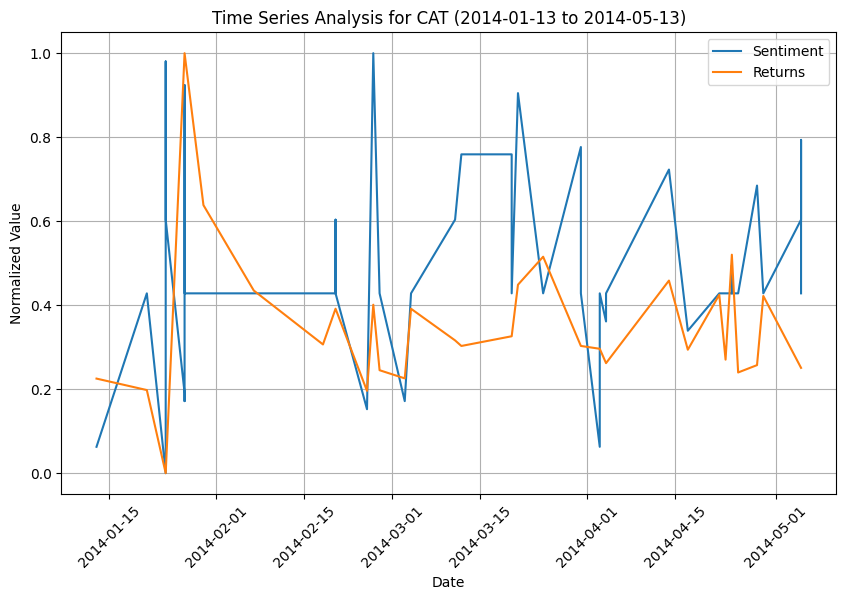

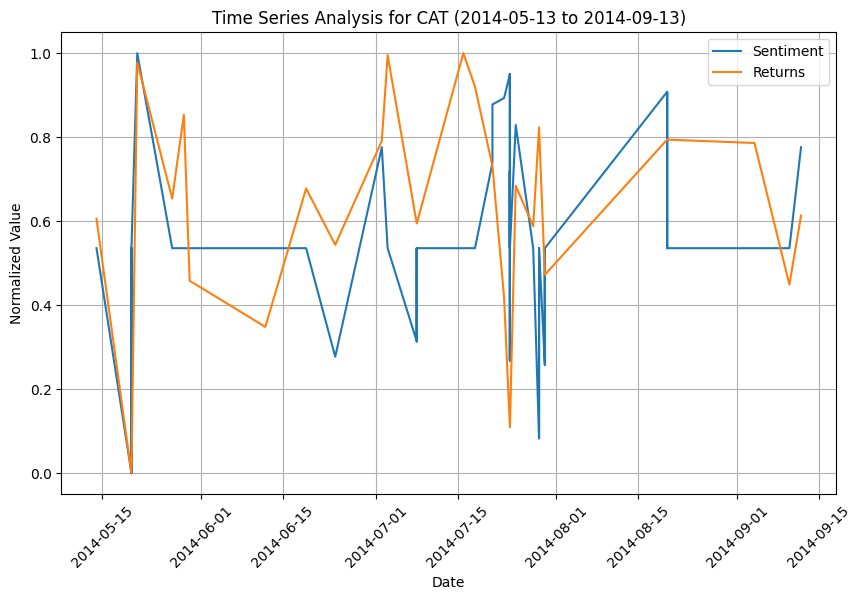

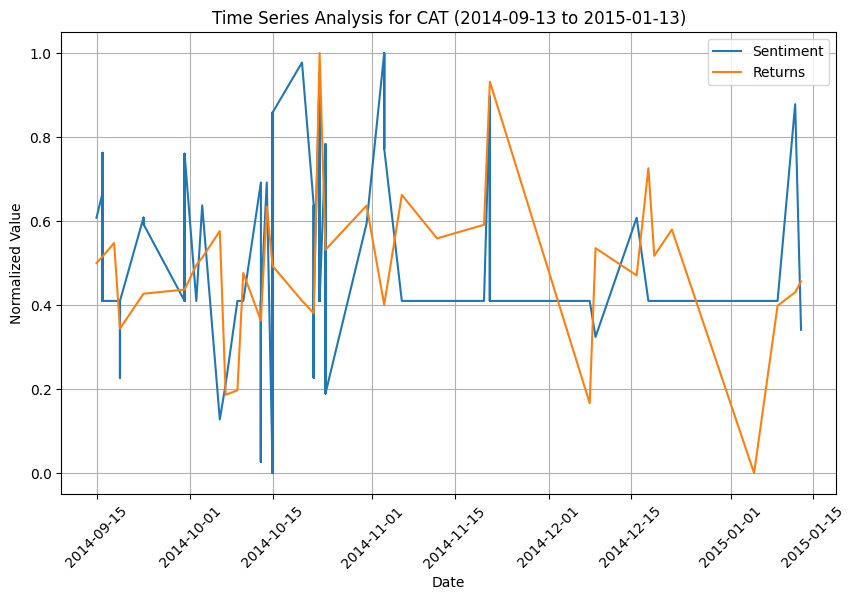

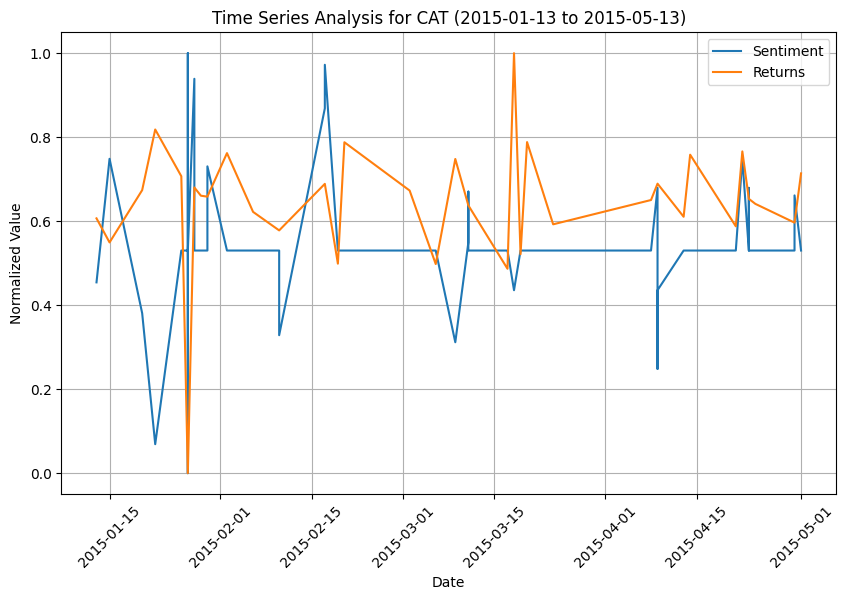

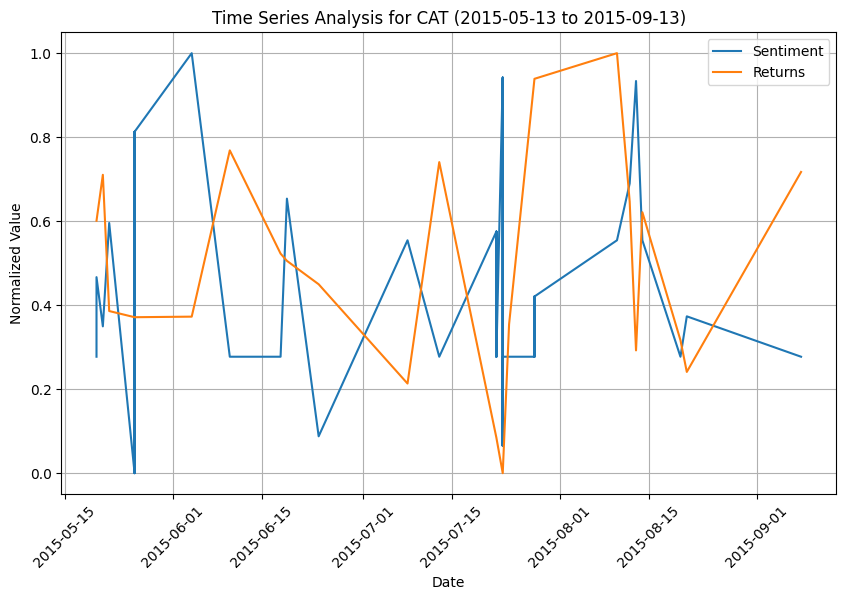

...

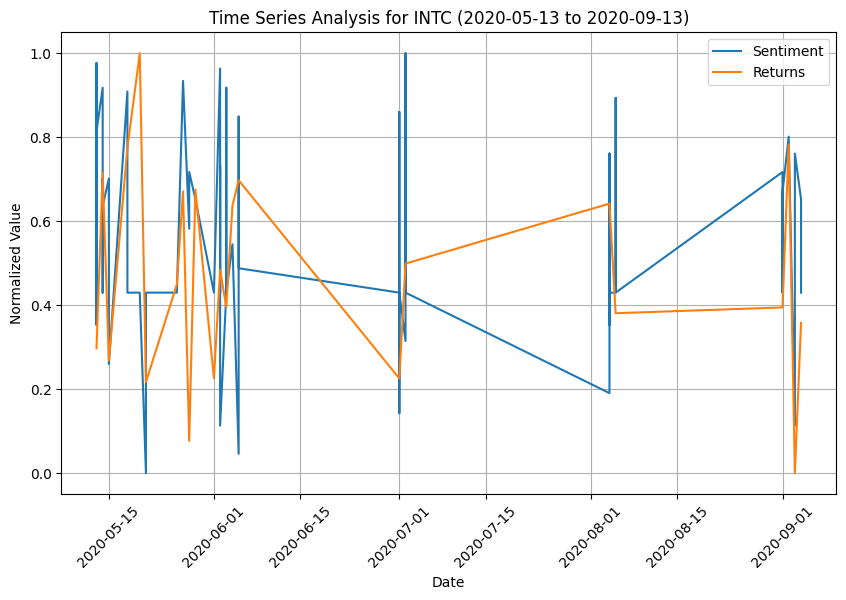

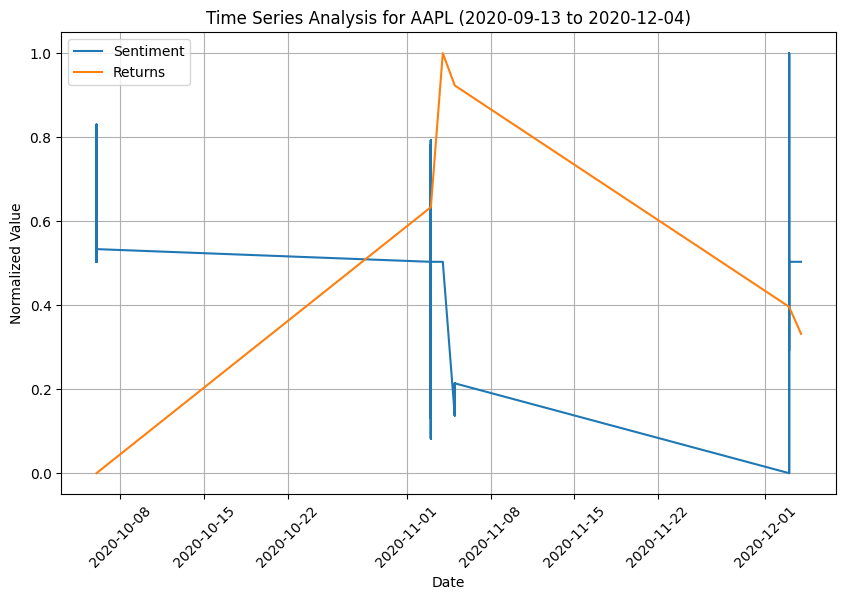

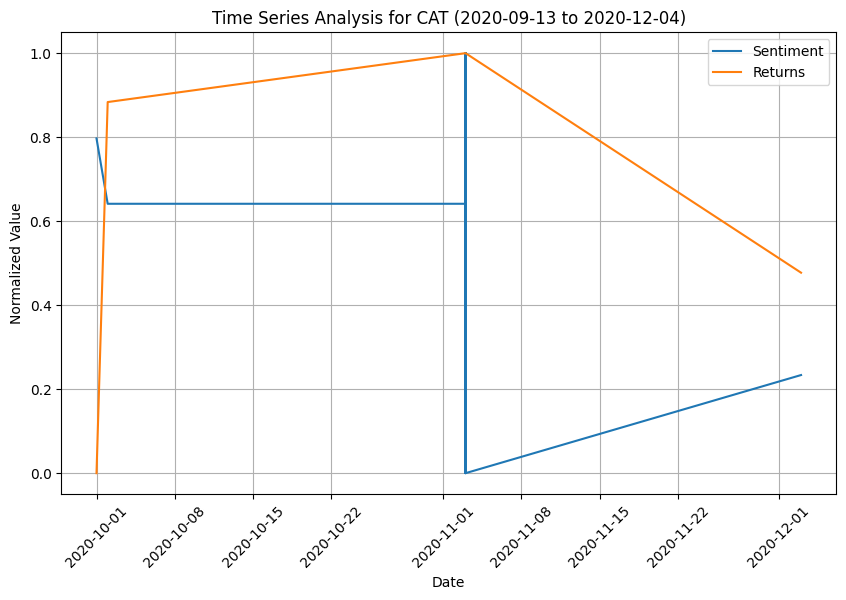

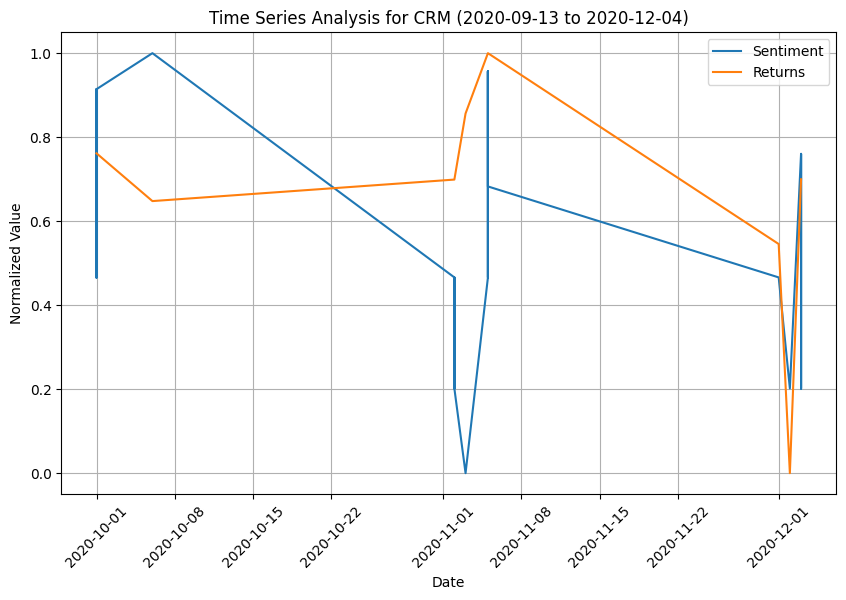

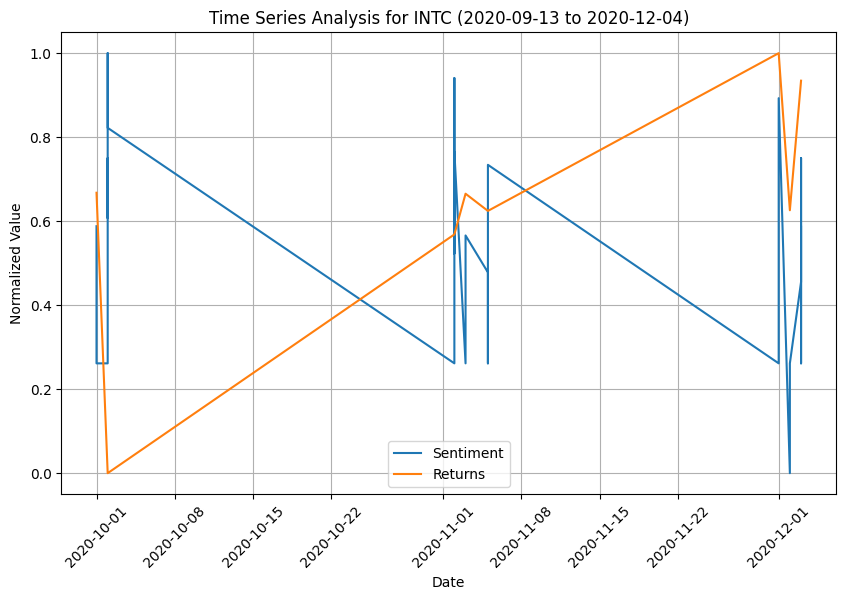

In [202]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Function to split data into four-month intervals
def split_into_intervals(data):
    min_date = data['date'].min()
    max_date = data['date'].max()
    intervals = []
    start_date = min_date
    while start_date < max_date:
        end_date = pd.to_datetime(start_date) + pd.DateOffset(months=4)
        end_date = min(end_date, max_date)
        intervals.append((start_date, end_date))
        start_date = end_date
    return intervals

# Define the function to plot time series graph for each interval
def plot_time_series(data, intervals):
    for interval in intervals:
        start_date, end_date = interval
        interval_data = data[(data['date'] >= start_date) & (data['date'] <= end_date)]
        if not interval_data.empty:
            grouped_data = interval_data.groupby('ticker')
            for ticker, group in grouped_data:
                plt.figure(figsize=(10, 6))
                # Normalize sentiment and returns
                normalized_sentiment = (group['Sentiment'] - group['Sentiment'].min()) / (group['Sentiment'].max() - group['Sentiment'].min())
                normalized_returns = (group['returns'] - group['returns'].min()) / (group['returns'].max() - group['returns'].min())
                plt.plot(group['date'], normalized_sentiment, label='Sentiment')
                plt.plot(group['date'], normalized_returns, label='Returns')
                plt.title(f'Time Series Analysis for {ticker} ({start_date.strftime("%Y-%m-%d")} to {end_date.strftime("%Y-%m-%d")})')
                plt.xlabel('Date')
                plt.ylabel('Normalized Value')
                plt.legend()
                plt.grid(True)
                plt.xticks(rotation=45)
                plt.show()

# Split data into four-month intervals
intervals = split_into_intervals(merged_df)

# Plot time series graphs for each interval
plot_time_series(merged_df, intervals)


In [203]:
df['date'] = pd.to_datetime(df['date'])


<ipython-input-204-a50f10a91b0a>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = merged_df[['Sentiment', 'Sentiment_2', 'price', 'volume', 'high', 'low', 'open', 'avg_price', 'mkt_cap','name_price_attention', 'pct_return', 'returns', 'volatility']].corr()


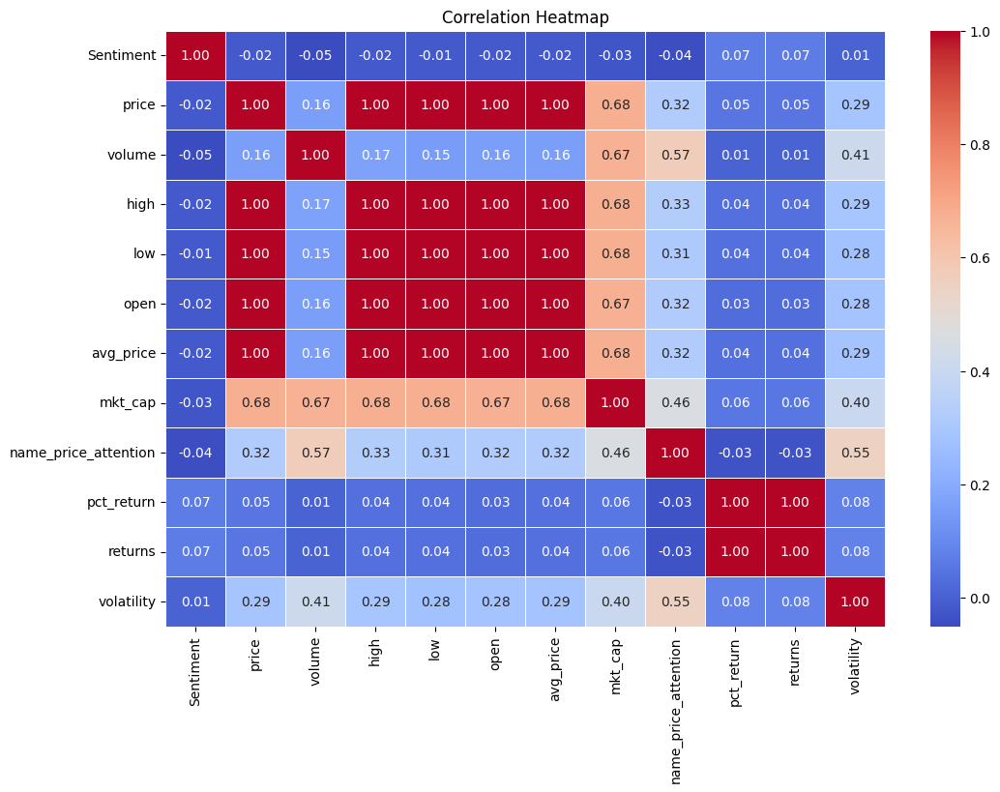

In [204]:
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate the correlation matrix
correlation_matrix = merged_df[['Sentiment', 'Sentiment_2', 'price', 'volume', 'high', 'low', 'open', 'avg_price', 'mkt_cap','name_price_attention', 'pct_return', 'returns', 'volatility']].corr()

# Create a heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()


In [205]:
# Convert correlation matrix to a DataFrame for better visualization
correlation_df = correlation_matrix.reset_index()

# Display the correlation matrix as a table with color gradient
correlation_table = correlation_df.style.background_gradient(cmap='coolwarm', axis=None, low=0, high=1, subset=None)
correlation_table


,index,Sentiment,price,volume,high,low,open,avg_price,mkt_cap,name_price_attention,pct_return,returns,volatility
0,Sentiment,1.000000,-0.015358,-0.050170,-0.016365,-0.014811,-0.016465,-0.015603,-0.026885,-0.042288,0.068327,0.068327,0.007235
1,price,-0.015358,1.000000,0.162500,0.999575,0.999563,0.999342,0.999743,0.678592,0.322399,0.049324,0.049324,0.287318
2,volume,-0.050170,0.162500,1.000000,0.167719,0.153627,0.160657,0.160811,0.671637,0.565928,0.005968,0.005968,0.412154
3,high,-0.016365,0.999575,0.167719,1.000000,0.999305,0.999657,0.999832,0.677524,0.330195,0.036116,0.036116,0.294272
4,low,-0.014811,0.999563,0.153627,0.999305,1.000000,0.999554,0.999821,0.676178,0.312802,0.036435,0.036435,0.276036
5,open,-0.016465,0.999342,0.160657,0.999657,0.999554,1.000000,0.999780,0.674647,0.321653,0.029958,0.029958,0.282328
6,avg_price,-0.015603,0.999743,0.160811,0.999832,0.999821,0.999780,1.000000,0.676979,0.321690,0.036279,0.036279,0.285345
7,mkt_cap,-0.026885,0.678592,0.671637,0.677524,0.676178,0.674647,0.676979,1.000000,0.458880,0.056389,0.056389,0.403978
8,name_price_attention,-0.042288,0.322399,0.565928,0.330195,0.312802,0.321653,0.321690,0.458880,1.000000,-0.030823,-0.030823,0.547574
9,pct_return,0.068327,0.049324,0.005968,0.036116,0.036435,0.029958,0.036279,0.056389,-0.030823,1.000000,1.000000,0.084426


In [206]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score

# Function to fit polynomial regression and evaluate relationship strength
def fit_polynomial_regression(X, y, degree):
    poly = PolynomialFeatures(degree=degree)
    X_poly = poly.fit_transform(X)
    model = LinearRegression()
    model.fit(X_poly, y)
    y_pred = model.predict(X_poly)
    r_squared = r2_score(y, y_pred)
    return model, r_squared

# Example: Fit polynomial regression for sentiment and 'price'
X = merged_df[['Sentiment']]
y = merged_df['price']
degree = 2  # Change the degree as needed
model, r_squared = fit_polynomial_regression(X, y, degree)
print("R-squared:", r_squared)

# Example: Fit decision tree or random forest and evaluate feature importances
from sklearn.ensemble import RandomForestRegressor

# Fit a random forest model
X = merged_df[['Sentiment']]
y = merged_df['price']  # Change the target variable as needed
rf_model = RandomForestRegressor()
rf_model.fit(X, y)

# Calculate feature importances
feature_importances = rf_model.feature_importances_
print("Feature Importances:", feature_importances)


R-squared: 0.002180623830864481
Feature Importances: [1.]


In [207]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Define features (X) and target variable (y)
X = merged_df[['Sentiment']]
y = merged_df['price']  # You can replace 'price' with any other variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Fit the model to the training data
rf_model.fit(X_train, y_train)

# Predict on the testing data
y_pred = rf_model.predict(X_test)

# Calculate R-squared
r_squared = r2_score(y_test, y_pred)
print("R-squared:", r_squared)


R-squared: 0.06067481232801808


In [208]:
# List of columns to iterate over
columns_to_explore = ['price', 'volume', 'high', 'low', 'open', 'avg_price', 'mkt_cap',
                      'pct_return', 'ticker_attention', 'name_price_attention',
                      'returns', 'volatility', 'High_Volatility']

# Dictionary to store R-squared values for each column
r_squared_values = {}

for column in columns_to_explore:
    # Define features (X) and target variable (y)
    X = merged_df[['Sentiment']]
    y = merged_df[column]

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Initialize the Random Forest Regressor
    rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

    # Fit the model to the training data
    rf_model.fit(X_train, y_train)

    # Predict on the testing data
    y_pred = rf_model.predict(X_test)

    # Calculate R-squared
    r_squared = r2_score(y_test, y_pred)

    # Store R-squared value in the dictionary
    r_squared_values[column] = r_squared

# Print R-squared values for each column
for column, r_squared in r_squared_values.items():
    print(f"R-squared for {column}: {r_squared}")


R-squared for price: 0.06067481232801808
R-squared for volume: 0.020495428509348823
R-squared for high: 0.06221207533783457
R-squared for low: 0.06178506613360746
R-squared for open: 0.06253044184896128
R-squared for avg_price: 0.06201551835301444
R-squared for mkt_cap: 0.051542119229395
R-squared for pct_return: 0.03104807479732341
R-squared for ticker_attention: 0.04383872576222925
R-squared for name_price_attention: 0.048175129341399114
R-squared for returns: 0.03104807479732352
R-squared for volatility: 0.07283777352357235
R-squared for High_Volatility: 0.049812328705979514


##The R-squared values for pct_return and volume indicate that the relationship between these variables and Sentiment is stronger compared to other variables in the dataset.

In [209]:
merged_df.head()

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
0,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Apple Cuts iPhone Prices in China To Push Sale...,-0.2960,negative
1,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,"Gun, Security Stocks Trade Higher After Weeken...",-0.8689,negative
2,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Carter Worth And Mike Khouw's Apple Trade,0.2263,positive
3,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,"Apple Pays Hacker From India $100,000 For Disc...",-0.2960,negative
4,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Volume Production of New iPhone Models to Begi...,0.0000,neutral


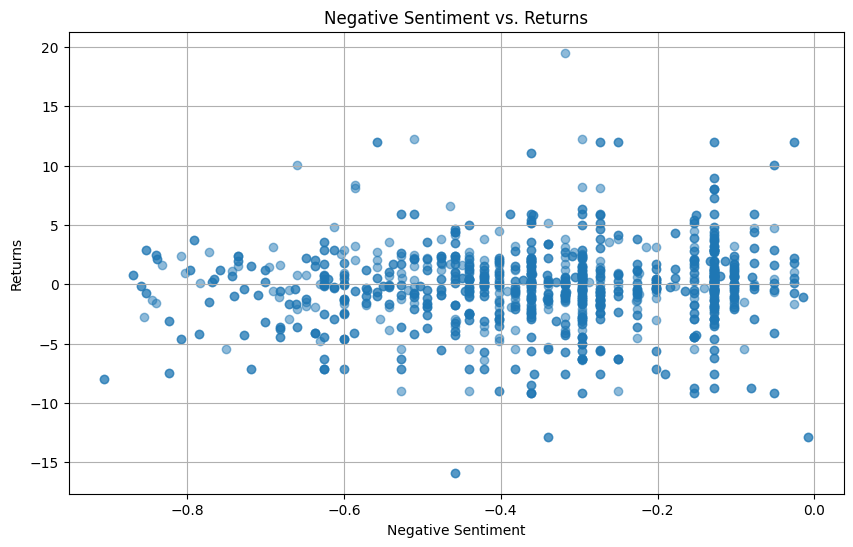

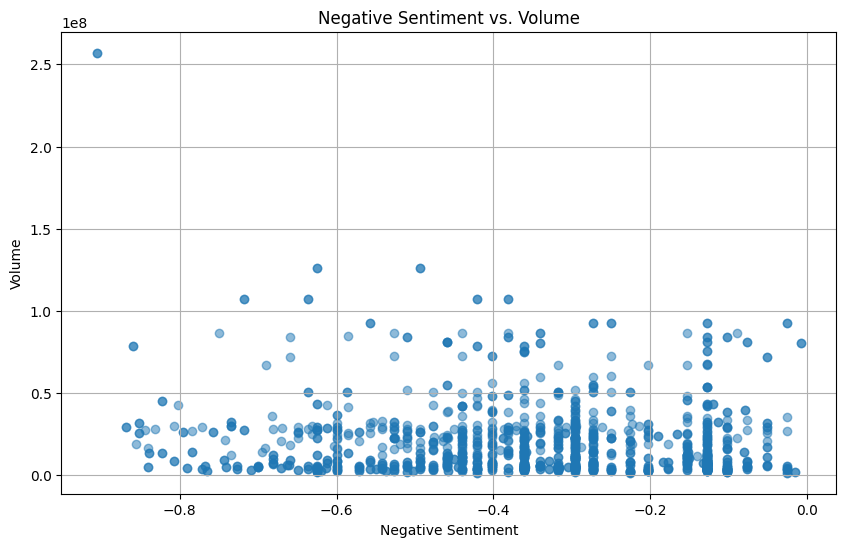

Correlation between negative sentiment and returns: 0.08262868804540915
Correlation between negative sentiment and volume: -0.0983420562878759


In [210]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming merged_df is your DataFrame containing the merged data
# Step 1: Filter the dataset to include only observations with negative sentiment
negative_sentiment_df = merged_df[merged_df['Sentiment_2'] == 'negative']

# Step 2: Explore the relationship between negative sentiment, returns, and volume
# Scatter plot of negative sentiment vs. returns
plt.figure(figsize=(10, 6))
plt.scatter(negative_sentiment_df['Sentiment'], negative_sentiment_df['returns'], alpha=0.5)
plt.title('Negative Sentiment vs. Returns')
plt.xlabel('Negative Sentiment')
plt.ylabel('Returns')
plt.grid(True)
plt.show()

# Scatter plot of negative sentiment vs. volume
plt.figure(figsize=(10, 6))
plt.scatter(negative_sentiment_df['Sentiment'], negative_sentiment_df['volume'], alpha=0.5)
plt.title('Negative Sentiment vs. Volume')
plt.xlabel('Negative Sentiment')
plt.ylabel('Volume')
plt.grid(True)
plt.show()

# Step 3: Calculate correlation coefficients
correlation_returns = negative_sentiment_df['Sentiment'].corr(negative_sentiment_df['returns'])
correlation_volume = negative_sentiment_df['Sentiment'].corr(negative_sentiment_df['volume'])
print("Correlation between negative sentiment and returns:", correlation_returns)
print("Correlation between negative sentiment and volume:", correlation_volume)

# Step 4: Consider regression analysis (optional)
# You can fit regression models to quantify the relationship between negative sentiment, returns, and volume
# For example, you can use linear regression or other regression techniques.


## Low relationship

In [211]:
merged_df

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
0,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Apple Cuts iPhone Prices in China To Push Sale...,-0.2960,negative
1,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,"Gun, Security Stocks Trade Higher After Weeken...",-0.8689,negative
2,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Carter Worth And Mike Khouw's Apple Trade,0.2263,positive
3,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,"Apple Pays Hacker From India $100,000 For Disc...",-0.2960,negative
4,2020-01-06,AAPL,299.79999,29597401.0,299.95999,292.75000,293.79001,296.354995,1.314331e+09,0.7968,18.45,20.72,0.7968,1.287497,False,0.000063,Volume Production of New iPhone Models to Begi...,0.0000,neutral
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8447,2020-11-03,CAT,167.69000,4843562.0,169.00000,163.07001,165.00000,166.035005,9.080531e+07,2.7072,60.04,19.38,2.7072,2.355949,False,0.000733,Shares of several companies in the broader ind...,-0.3182,negative
8448,2020-12-03,CAT,174.63000,2904107.0,175.08000,173.28011,173.87000,174.180055,9.486914e+07,0.4371,72.09,37.10,0.4371,1.744699,False,0.000019,Stocks That Hit 52-Week Lows On Thursday,-0.2023,negative
8449,2020-12-03,CAT,174.63000,2904107.0,175.08000,173.28011,173.87000,174.180055,9.486914e+07,0.4371,72.09,37.10,0.4371,1.744699,False,0.000019,Shares of several companies in the broader ind...,-0.2023,negative
8450,2020-12-03,CAT,174.63000,2904107.0,175.08000,173.28011,173.87000,174.180055,9.486914e+07,0.4371,72.09,37.10,0.4371,1.744699,False,0.000019,Stocks That Hit 52-Week Lows On Thursday,-0.2023,negative


In [212]:
# Filter the data for AAPL
aapl_df = merged_df[merged_df['ticker'] == 'AAPL']

# Display the filtered DataFrame
print(aapl_df)


          date ticker      price      volume       high     low       open  \
0   2020-01-06   AAPL  299.79999  29597401.0  299.95999  292.75  293.79001   
1   2020-01-06   AAPL  299.79999  29597401.0  299.95999  292.75  293.79001   
2   2020-01-06   AAPL  299.79999  29597401.0  299.95999  292.75  293.79001   
3   2020-01-06   AAPL  299.79999  29597401.0  299.95999  292.75  293.79001   
4   2020-01-06   AAPL  299.79999  29597401.0  299.95999  292.75  293.79001   
..         ...    ...        ...         ...        ...     ...        ...   
750 2020-12-03   AAPL  122.94000  78855661.0  123.78000  122.21  123.52000   
751 2020-12-03   AAPL  122.94000  78855661.0  123.78000  122.21  123.52000   
752 2020-12-03   AAPL  122.94000  78855661.0  123.78000  122.21  123.52000   
753 2020-12-03   AAPL  122.94000  78855661.0  123.78000  122.21  123.52000   
754 2020-12-04   AAPL  122.25000  78131082.0  122.86080  121.52  122.60000   

      avg_price       mkt_cap  pct_return  ticker_attention  \


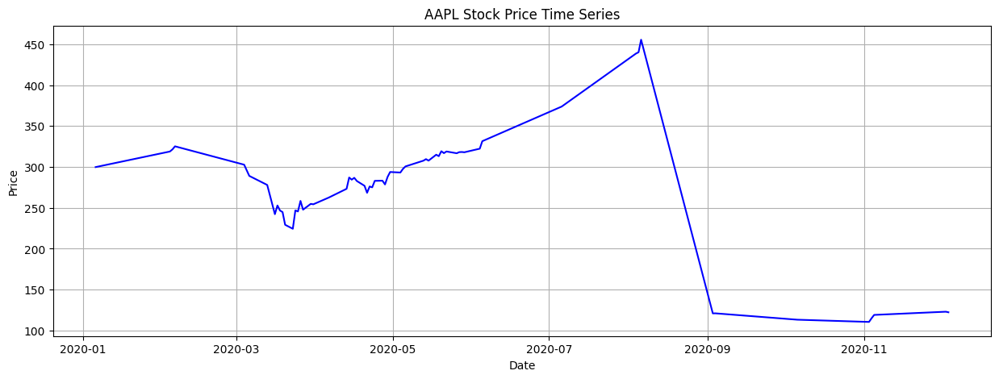

In [213]:
import matplotlib.pyplot as plt

# Plot the time series of AAPL stock price
plt.figure(figsize=(15, 5))
plt.plot(aapl_df['date'], aapl_df['price'], color='blue')
plt.title('AAPL Stock Price Time Series')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)
plt.show()


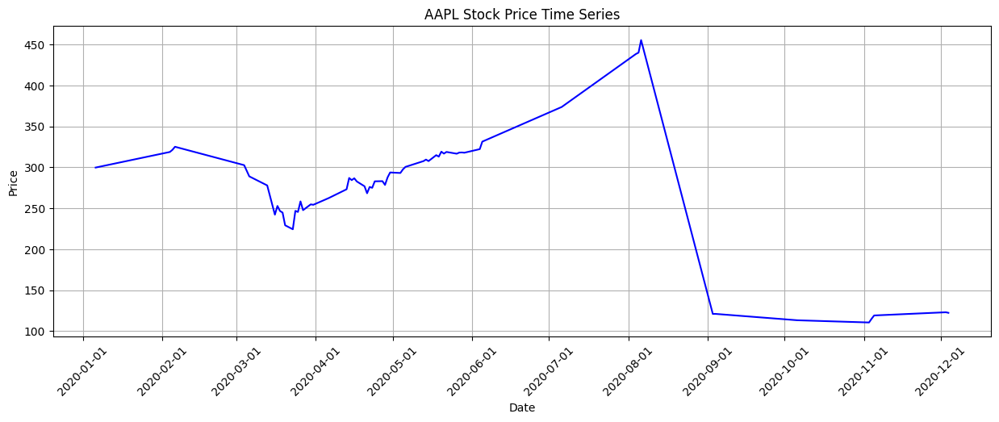

In [214]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Plot the time series of AAPL stock price
plt.figure(figsize=(15, 5))
plt.plot(aapl_df['date'], aapl_df['price'], color='blue')

# Set x-axis date format and tick frequency
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())

plt.title('AAPL Stock Price Time Series')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()


In [215]:
## Something happened in 8th month of 2020 so the price fell

In [216]:
# Filter the data for AAPL between August 2020 and September 2020
filtered_aapl_df = aapl_df[(aapl_df['date'] >= '2020-08-01') & (aapl_df['date'] <= '2020-09-30')]

# Display the filtered data
print(filtered_aapl_df)


          date ticker      price       volume       high        low  \
645 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
646 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
647 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
648 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
649 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
650 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
651 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
652 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
653 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
654 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
655 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
656 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
657 2020-08-04   AAPL  438.66000   43117998.0  443.16000  433.54999   
658 20

In [217]:
filtered_aapl_df

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
645,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Disney Shares Climb 7% As Video On Demand Serv...,0.1779,positive
646,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,"Netflix, YouTube, Disney+: Which Video Streami...",0.0000,neutral
647,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,The Show Must Go On – Event Industry Rising To...,0.0772,positive
648,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Global Payments Firm Papaya Global Publishes I...,-0.6249,negative
649,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Watching Apple Shares; Hearing Traders Circula...,0.0258,positive
650,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Shares of several technology companies are tra...,0.8360,positive
651,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,10 Biggest Price Target Changes For Wednesday,0.0000,neutral
652,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,"JP Morgan Maintains Overweight on Apple, Lower...",-0.1197,negative
653,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Hearing Piper Sandler Raised Apple Price Targe...,-0.1280,negative
654,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,iPhone Maker Foxconn To Produce Ventilators In US,0.0000,neutral


In [218]:
filtered_aapl_df.shape

(53, 19)

In [219]:
# Get the distribution of sentiments
sentiment_distribution = filtered_aapl_df['Sentiment_2'].value_counts()

# Display the distribution
print(sentiment_distribution)


neutral     25
positive    20
negative     8
Name: Sentiment_2, dtype: int64


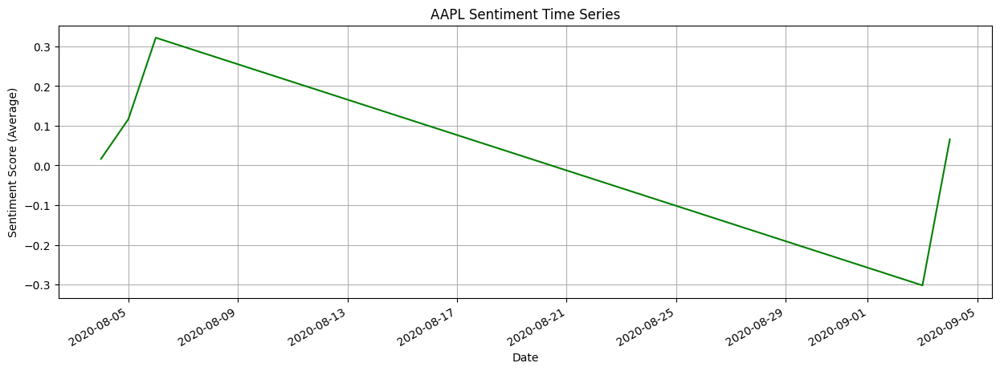

In [220]:
import matplotlib.pyplot as plt

# Group the data by date and calculate the average sentiment score
sentiment_time_series = filtered_aapl_df.groupby('date')['Sentiment'].mean()

# Plot the time series of sentiment
plt.figure(figsize=(15, 5))
sentiment_time_series.plot(color='green')
plt.title('AAPL Sentiment Time Series')
plt.xlabel('Date')
plt.ylabel('Sentiment Score (Average)')
plt.grid(True)
plt.show()


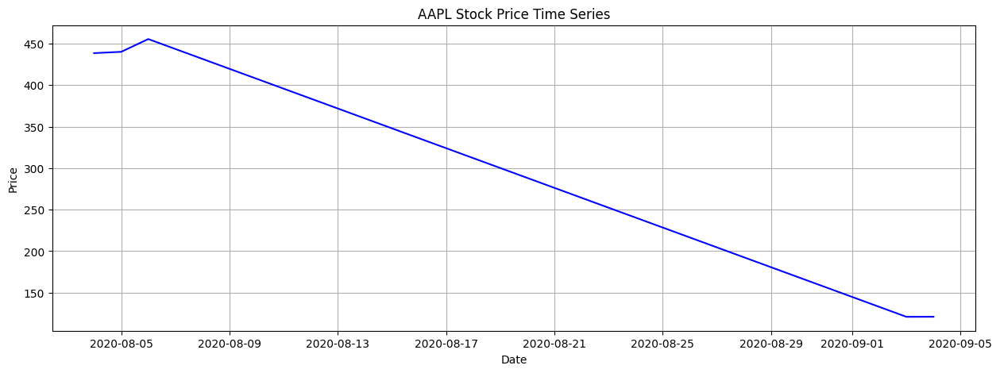

In [221]:
import matplotlib.pyplot as plt

# Plot the time series of AAPL stock price
plt.figure(figsize=(15, 5))
plt.plot(filtered_aapl_df['date'], filtered_aapl_df['price'], color='blue')
plt.title('AAPL Stock Price Time Series')
plt.xlabel('Date')
plt.ylabel('Price')
plt.grid(True)
plt.show()


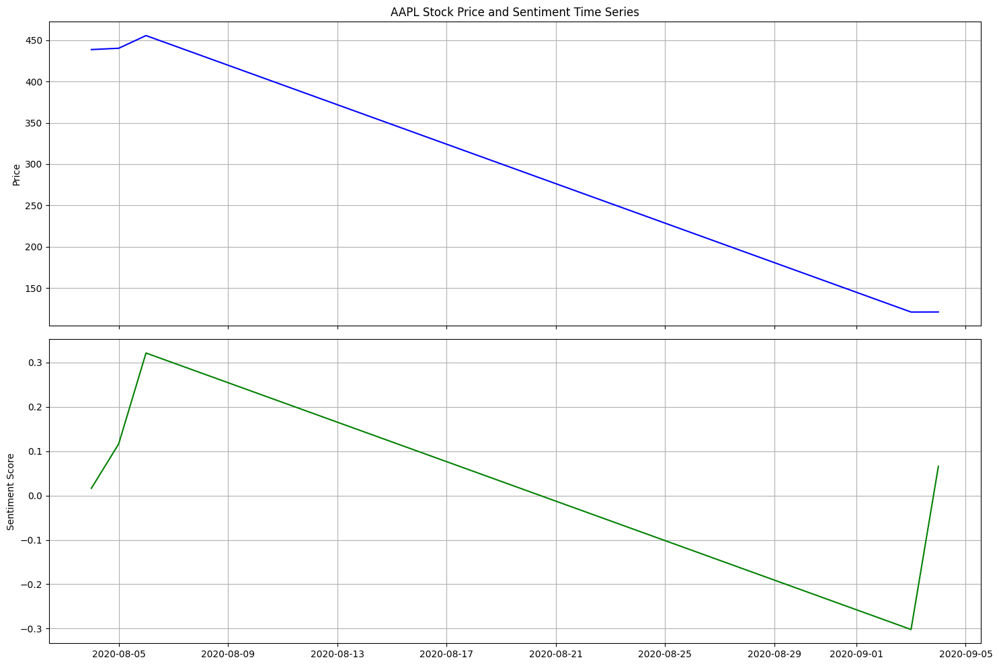

In [222]:
import matplotlib.pyplot as plt

# Create figure and subplots
fig, ax = plt.subplots(2, 1, figsize=(15, 10), sharex=True)

# Plot AAPL stock price
ax[0].plot(filtered_aapl_df['date'], filtered_aapl_df['price'], color='blue')
ax[0].set_ylabel('Price')
ax[0].grid(True)

# Plot sentiment score
ax[1].plot(sentiment_time_series.index, sentiment_time_series.values, color='green')
ax[1].set_ylabel('Sentiment Score')
ax[1].grid(True)

# Set titles
ax[0].set_title('AAPL Stock Price and Sentiment Time Series')

# Show plot
plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [223]:
##Clearly with the falling sentiment the price also falls

In [224]:
filtered_aapl_df

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
645,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Disney Shares Climb 7% As Video On Demand Serv...,0.1779,positive
646,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,"Netflix, YouTube, Disney+: Which Video Streami...",0.0000,neutral
647,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,The Show Must Go On – Event Industry Rising To...,0.0772,positive
648,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Global Payments Firm Papaya Global Publishes I...,-0.6249,negative
649,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Watching Apple Shares; Hearing Traders Circula...,0.0258,positive
650,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Shares of several technology companies are tra...,0.8360,positive
651,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,10 Biggest Price Target Changes For Wednesday,0.0000,neutral
652,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,"JP Morgan Maintains Overweight on Apple, Lower...",-0.1197,negative
653,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,Hearing Piper Sandler Raised Apple Price Targe...,-0.1280,negative
654,2020-08-04,AAPL,438.66000,43117998.0,443.16000,433.54999,436.53000,438.354995,1.875550e+09,0.6678,34.32,40.80,0.6678,3.443890,True,4.459568e-05,iPhone Maker Foxconn To Produce Ventilators In US,0.0000,neutral


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


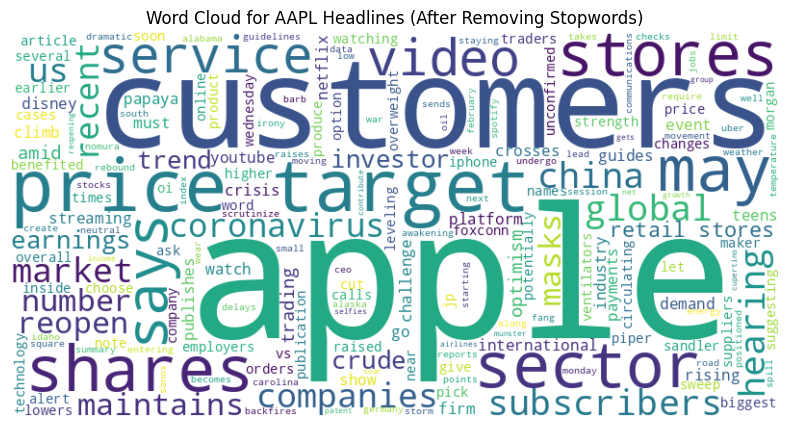

In [225]:
from wordcloud import WordCloud
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Download NLTK stopwords (if not already downloaded)
import nltk
nltk.download('stopwords')
nltk.download('punkt')

# Get the stopwords
stop_words = set(stopwords.words('english'))

# Combine all headlines into a single string
all_headlines = ' '.join(filtered_aapl_df['headline'])

# Tokenize the text
tokens = word_tokenize(all_headlines)

# Filter out stopwords
filtered_tokens = [word.lower() for word in tokens if word.lower() not in stop_words and word.isalpha()]

# Join the filtered tokens into a single string
cleaned_text = ' '.join(filtered_tokens)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for AAPL Headlines (After Removing Stopwords)')
plt.axis('off')
plt.show()


In [226]:
filtered_negative_df = filtered_aapl_df[filtered_aapl_df['Sentiment_2'] == 'negative']
filtered_negative_df


,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
648,2020-08-04,AAPL,438.66,43117998.0,443.16,433.54999,436.53,438.354995,1.875550e+09,0.6678,34.32,40.8,0.6678,3.44389,True,0.000045,Global Payments Firm Papaya Global Publishes I...,-0.6249,negative
652,2020-08-04,AAPL,438.66,43117998.0,443.16,433.54999,436.53,438.354995,1.875550e+09,0.6678,34.32,40.8,0.6678,3.44389,True,0.000045,"JP Morgan Maintains Overweight on Apple, Lower...",-0.1197,negative
653,2020-08-04,AAPL,438.66,43117998.0,443.16,433.54999,436.53,438.354995,1.875550e+09,0.6678,34.32,40.8,0.6678,3.44389,True,0.000045,Hearing Piper Sandler Raised Apple Price Targe...,-0.1280,negative
657,2020-08-04,AAPL,438.66,43117998.0,443.16,433.54999,436.53,438.354995,1.875550e+09,0.6678,34.32,40.8,0.6678,3.44389,True,0.000045,Global Payments Firm Papaya Global Publishes I...,-0.6249,negative
661,2020-08-04,AAPL,438.66,43117998.0,443.16,433.54999,436.53,438.354995,1.875550e+09,0.6678,34.32,40.8,0.6678,3.44389,True,0.000045,"JP Morgan Maintains Overweight on Apple, Lower...",-0.1197,negative
662,2020-08-04,AAPL,438.66,43117998.0,443.16,433.54999,436.53,438.354995,1.875550e+09,0.6678,34.32,40.8,0.6678,3.44389,True,0.000045,Hearing Piper Sandler Raised Apple Price Targe...,-0.1280,negative
681,2020-09-03,AAPL,120.88,257061551.0,128.84,120.50000,126.91,124.670000,2.067355e+09,-8.0061,84.15,91.0,-8.0061,2.42831,False,0.006410,Crude Awakening: Energy Sector Takes A 20% Spi...,-0.9062,negative
684,2020-09-03,AAPL,120.88,257061551.0,128.84,120.50000,126.91,124.670000,2.067355e+09,-8.0061,84.15,91.0,-8.0061,2.42831,False,0.006410,Crude Awakening: Energy Sector Takes A 20% Spi...,-0.9062,negative


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


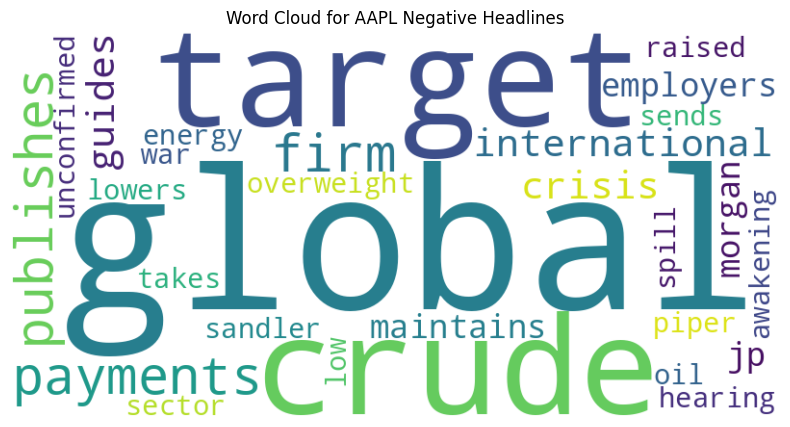

In [227]:
from wordcloud import WordCloud
from nltk.corpus import stopwords

# Download NLTK stopwords (if not already downloaded)
import nltk
nltk.download('stopwords')

# Get the stopwords
stop_words = set(stopwords.words('english'))

# Add "apple", "papaya", and "price" to the list of stopwords
stop_words.update(["apple", "papaya", "price"])

# Combine all negative headlines into a single string
negative_headlines_text = ' '.join(filtered_negative_df['headline'])

# Tokenize the text into individual words
tokens = nltk.word_tokenize(negative_headlines_text)

# Remove stopwords from the tokens
cleaned_tokens = [word.lower() for word in tokens if word.lower() not in stop_words and word.isalpha()]

# Combine the cleaned tokens into a single string
cleaned_text = ' '.join(cleaned_tokens)

# Generate word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(cleaned_text)

# Display the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud for AAPL Negative Headlines')
plt.axis('off')
plt.show()


In [228]:
##CRM

In [248]:
# Assuming the DataFrame is named merged_df
crm_df = merged_df[merged_df['ticker'] == 'CRM'].copy()


In [230]:
import matplotlib.pyplot as plt

def analyze_stock_data(stock_df):
    # 1. Shape of the DataFrame
    print("Shape of the DataFrame:", stock_df.shape)

    # 2. Highest and Lowest Date, Price
    highest_price_row = stock_df.loc[stock_df['price'].idxmax()]
    lowest_price_row = stock_df.loc[stock_df['price'].idxmin()]

    print("Highest Price Date:", highest_price_row['date'])
    print("Highest Price:", highest_price_row['price'])

    print("Lowest Price Date:", lowest_price_row['date'])
    print("Lowest Price:", lowest_price_row['price'])

    # 3. Price Time Series Graph
    plt.figure(figsize=(10, 6))
    plt.plot(stock_df['date'], stock_df['price'], color='blue')
    plt.title('Stock Price Time Series')
    plt.xlabel('Date')
    plt.ylabel('Price')
    plt.grid(True)
    plt.show()

    # 4. Sentiment Time Series Graph
    plt.figure(figsize=(10, 6))
    plt.plot(stock_df['date'], stock_df['Sentiment'], color='green')
    plt.title('Sentiment Time Series')
    plt.xlabel('Date')
    plt.ylabel('Sentiment Score')
    plt.grid(True)
    plt.show()


Shape of the DataFrame: (2580, 19)
Highest Price Date: 2020-09-01 00:00:00
Highest Price: 281.25
Lowest Price Date: 2016-02-05 00:00:00
Lowest Price: 58.51


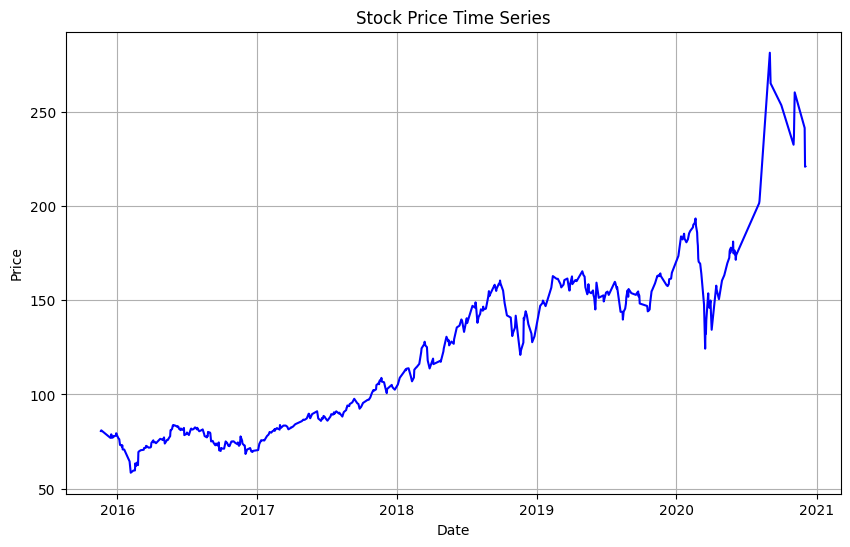

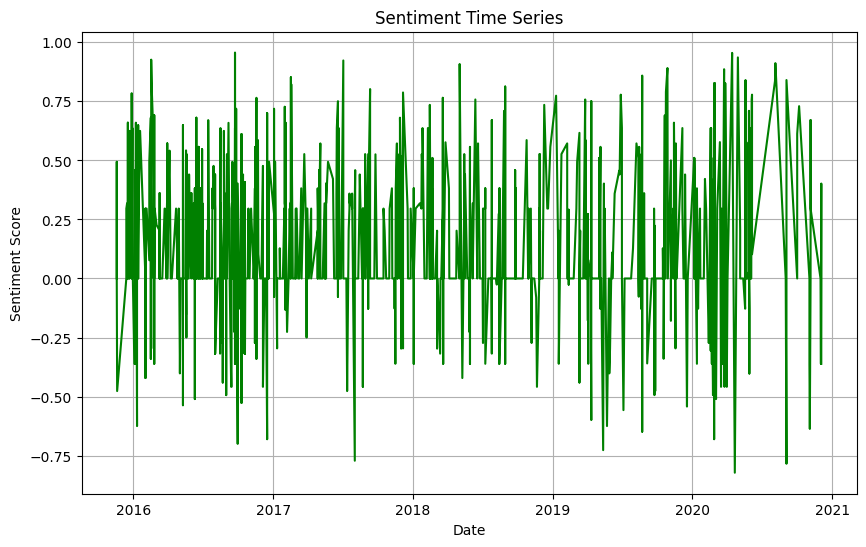

In [231]:
analyze_stock_data(crm_df)

In [232]:
import plotly.graph_objects as go

# Create Candlestick chart
fig = go.Figure(data=[go.Candlestick(
    x=crm_df['date'],
    open=crm_df['open'],
    high=crm_df['high'],
    low=crm_df['low'],
    close=crm_df['price']
)])

# Update layout
fig.update_layout(
    margin=dict(l=20, r=20, t=60, b=20),
    height=300,
    paper_bgcolor="LightSteelBlue",
    title="CRM Candlestick Chart"
)

# Show the chart
fig.show()


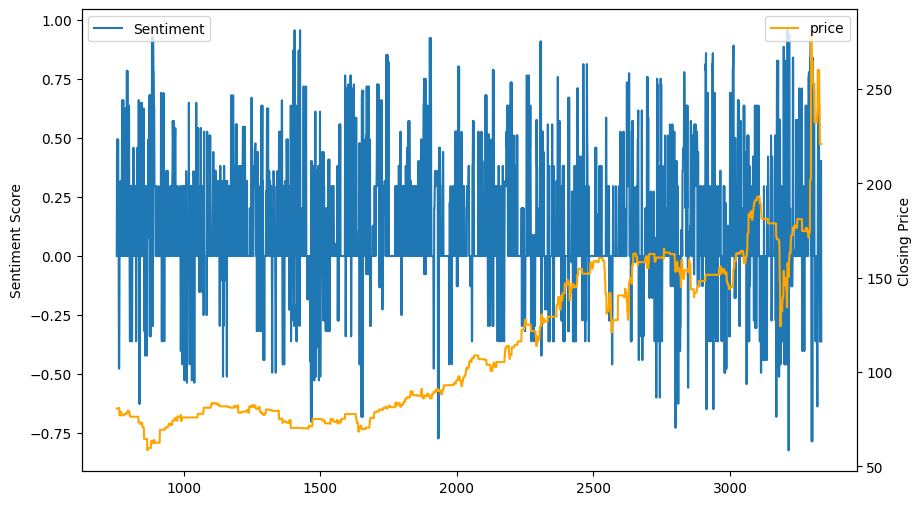

In [235]:
import matplotlib.pyplot as plt

# Plot sentiment
ax1 = crm_df["Sentiment"].plot(legend="Sentiment", figsize=(10, 6))
ax1.set_ylabel('Sentiment Score')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Closing Price')

# Plot closing price on the second y-axis
crm_df["price"].plot(ax=ax2, color="orange", legend="Closing Price")

# Customize legend
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

# Show plot
plt.show()


In [234]:
crm_df.head()

,date,ticker,price,volume,high,low,open,avg_price,mkt_cap,pct_return,ticker_attention,name_price_attention,returns,volatility,High_Volatility,squared_returns,headline,Sentiment,Sentiment_2
755,2015-11-19,CRM,80.64,11602837.0,82.9,80.45,81.05,81.675,52864035.84,4.2534,56.43,6.16,4.2534,1.455072,False,0.001809,Salesforce Shatters Former All-Time High After...,0.0000,neutral
756,2015-11-19,CRM,80.64,11602837.0,82.9,80.45,81.05,81.675,52864035.84,4.2534,56.43,6.16,4.2534,1.455072,False,0.001809,"At A New All-Time High, Salesforce's Outlook I...",0.4939,positive
757,2015-11-19,CRM,80.64,11602837.0,82.9,80.45,81.05,81.675,52864035.84,4.2534,56.43,6.16,4.2534,1.455072,False,0.001809,Stocks Hitting 52-Week Highs,0.0000,neutral
758,2015-11-19,CRM,80.64,11602837.0,82.9,80.45,81.05,81.675,52864035.84,4.2534,56.43,6.16,4.2534,1.455072,False,0.001809,Early Global News: Starboard Asks Yahoo Not To...,0.0000,neutral
759,2015-11-19,CRM,80.64,11602837.0,82.9,80.45,81.05,81.675,52864035.84,4.2534,56.43,6.16,4.2534,1.455072,False,0.001809,Salesforce Shatters Former All-Time High After...,0.0000,neutral


In [244]:
import matplotlib.pyplot as plt

# Convert 'date' column to datetime if it's not already
crm_df['date'] = pd.to_datetime(crm_df['date'])

# Set 'date' column as the index
crm_df.set_index('date', inplace=True)

# Resample sentiment to weekly frequency and calculate mean
weekly_sentiment = crm_df['Sentiment'].resample('W').mean()

# Plot resampled sentiment
ax1 = weekly_sentiment.plot(legend="Sentiment", figsize=(10, 6))
ax1.set_ylabel('Sentiment Score (Weekly Average)')

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()
ax2.set_ylabel('Closing Price')

# Plot closing price on the second y-axis
crm_df["price"].plot(ax=ax2, color="orange", legend="Closing Price")

# Customize legend
ax1.legend(loc="upper left")
ax2.legend(loc="upper right")

# Show plot
plt.show()


KeyError: 'date'

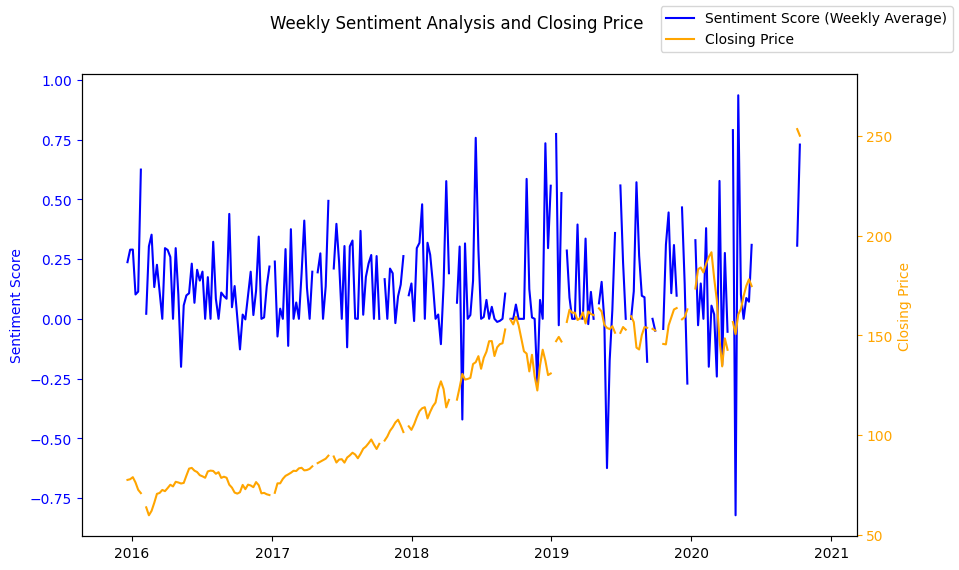

In [246]:
import pandas as pd
import matplotlib.pyplot as plt

def analyze_sentiment_and_price(df):
    # Convert 'date' column to datetime if it's not already
    crm_df['date'] = pd.to_datetime(df['date'])

    # Set 'date' column as the index
    crm_df.set_index('date', inplace=True)

    # Resample sentiment to weekly frequency and calculate mean
    weekly_sentiment = crm_df['Sentiment'].resample('W').mean()

    # Plot resampled sentiment
    fig, ax1 = plt.subplots(figsize=(10, 6))
    ax1.plot(weekly_sentiment, color='blue', label='Sentiment Score (Weekly Average)')
    ax1.set_ylabel('Sentiment Score', color='blue')
    ax1.tick_params('y', colors='blue')

    # Create a second y-axis sharing the same x-axis
    ax2 = ax1.twinx()
    ax2.plot(df["price"].resample('W').mean(), color='orange', label='Closing Price')
    ax2.set_ylabel('Closing Price', color='orange')
    ax2.tick_params('y', colors='orange')

    # Set title and legend
    fig.suptitle('Weekly Sentiment Analysis and Closing Price')
    fig.legend(loc='upper right')

    # Show plot
    plt.show()

# Call the function with the DataFrame
analyze_sentiment_and_price(crm_df)


In [250]:
import pandas as pd

def analyze_sentiment_and_price(df):
    # Convert 'date' column to datetime if it's not already
    df['date'] = pd.to_datetime(df['date'])

    # Set 'date' column as the index
    df.set_index('date', inplace=True)

    # Resample sentiment to weekly frequency and calculate mean
    weekly_sentiment = df['Sentiment'].resample('W').mean()

    # Resample closing price to weekly frequency and calculate mean
    weekly_price = df['price'].resample('W').mean()

    # Create DataFrame with weekly sentiment and price
    weekly_data = pd.DataFrame({
        'Week': weekly_sentiment.index,
        'Sentiment Score (Weekly Average)': weekly_sentiment.values,
        'Closing Price (Weekly Average)': weekly_price.values
    })

    return weekly_data

# Call the function with the DataFrame
weekly_analysis = analyze_sentiment_and_price(crm_df)

# Display the resulting DataFrame
print(weekly_analysis)


          Week  Sentiment Score (Weekly Average)  \
0   2015-11-22                          0.003440   
1   2015-11-29                               NaN   
2   2015-12-06                               NaN   
3   2015-12-13                               NaN   
4   2015-12-20                          0.237212   
..         ...                               ...   
259 2020-11-08                         -0.003511   
260 2020-11-15                               NaN   
261 2020-11-22                               NaN   
262 2020-11-29                               NaN   
263 2020-12-06                         -0.080125   

     Closing Price (Weekly Average)  
0                         80.710000  
1                               NaN  
2                               NaN  
3                               NaN  
4                         77.427500  
..                              ...  
259                      242.226667  
260                             NaN  
261                             N

In [251]:
weekly_analysis

,Week,Sentiment Score (Weekly Average),Closing Price (Weekly Average)
0,2015-11-22,0.003440,80.710000
1,2015-11-29,NaN,NaN
2,2015-12-06,NaN,NaN
3,2015-12-13,NaN,NaN
4,2015-12-20,0.237212,77.427500
...,...,...,...
259,2020-11-08,-0.003511,242.226667
260,2020-11-15,NaN,NaN
261,2020-11-22,NaN,NaN
262,2020-11-29,NaN,NaN


In [253]:
# Assuming the columns are named 'price' and 'sentiment'
correlation = crm_df['price'].corr(crm_df['Sentiment'])
print("Correlation between price and sentiment:", correlation)


Correlation between price and sentiment: -0.04959754562087274
